<a href="https://colab.research.google.com/github/babi00/ai4biological-pattern/blob/guido-clean/invasive_plants_analysis/save_models_trained_with_hyssopifolia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This file modifies the file "LOSO_training_no_hyssopifolia" to save the model trained INCLUDING HYSSOPIFOLIA, so that we are able to extract predictions also from that in order to calculate F1 score and other metrics. Used for the article, after the thesis.

Then, use "predictions_with_logits.ipynb" to generate the file with the predictions and go from there for metrics. Remember to change the name of the files.

In [ ]:
#@title Imports and downloads
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.transforms import functional as TF
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split, ConcatDataset
from torchvision import transforms, models
from sklearn.metrics import classification_report, multilabel_confusion_matrix, confusion_matrix, ConfusionMatrixDisplay, f1_score
from sklearn.model_selection import GroupKFold
from google.colab import drive
import time
from tqdm import tqdm
!pip install open_clip_torch
import open_clip
import math
from collections import Counter
import datetime
import json
import os
import random

torch.manual_seed(42)
np.random.seed(42)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

drive.mount('/content/drive')

# Clone the repository and checkout the 'clean-barbara' branch
!git clone --branch clean-barbara https://github.com/babi00/ai4biological-pattern.git
%cd ai4biological-pattern

# Enable sparse checkout
!git sparse-checkout init --cone

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 79.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 4.4 MB/s eta 0:00:00
Mounted at /content/drive
Cloning into 'ai4biological-pattern'...
remote: Enumerating objects: 735248, done.
remote: Counting objects: 100% (179/179), done.
remote: Compressing objects: 100% (107/107), done.
remote: Total 735248 (delta 94), reused 143 (delta 71), pack-reused 735069 (from 3)
Receiving objects: 100% (735248/735248), 8.79 GiB | 15.95 MiB/s, done.
Resolving deltas: 100% (2298/2298), done.
Updating files: 100% (214837/214837), done.
/content/ai4biological-pattern
Updating files: 100% (214835/214835), done.


In [ ]:
#@title Training log saving function
def save_training_log(model_name, output_dir, train_losses, val_losses, train_accuracies, val_accuracies, classification_report_dict):
    import datetime
    import json
    import os

    timestamp = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
    log_dir = f"/content/drive/MyDrive/Thesis/{output_dir}/logs"
    os.makedirs(log_dir, exist_ok=True)
    log_path = os.path.join(log_dir, "training_log.json")

    # Load existing logs (if any)
    if os.path.exists(log_path):
        with open(log_path, "r") as f:
            all_logs = json.load(f)
    else:
        all_logs = []

    # Prepare this run's data
    this_log = {
        "model_name": model_name,
        "timestamp": timestamp,
        "final_train_loss": train_losses[-1] if train_losses else None,
        "final_val_loss": val_losses[-1] if val_losses else None,
        "final_train_accuracy": train_accuracies[-1] if train_accuracies else None,
        "final_val_accuracy": val_accuracies[-1] if val_accuracies else None,
        "classification_report_last_epoch": classification_report_dict[-1] if isinstance(classification_report_dict, list) else classification_report_dict,
        "train_loss_history": train_losses,
        "val_loss_history": val_losses,
        "train_accuracy_history": train_accuracies,
        "val_accuracy_history": val_accuracies
    }

    all_logs.append(this_log)

    # Save updated list
    with open(log_path, "w") as f:
        json.dump(all_logs, f, indent=4)

    print(f"📝 Appended log to {log_path}")


In [ ]:
#@title Horizontal flip
def hflip(image):
  return TF.hflip(image)

In [ ]:
#@title Original Dataset
class InvasiveSpeciesDataset(Dataset):
    def __init__(self, root_dir, transform=None, get_label_fn=None):
        self.root_dir = root_dir
        self.transform = transform
        self.entries = []
        self.label_map = {
            "Invasive" : 0,
            "Non Invasive" : 1
        }

        taxa_folders = [d for d in os.listdir(root_dir) if os.path.isdir(os.path.join(root_dir, d)) and d != "metadata"]
        for taxon in taxa_folders:
            meta_path = os.path.join(root_dir, "filtered_metadata", f"{taxon}_metadata.csv")
            if not os.path.exists(meta_path):
                continue
            metadata_df = pd.read_csv(meta_path)
            for idx, row in metadata_df.iterrows():
              if pd.isna(row["filename"]):
                  print(f"⚠️ Missing filename in taxon '{taxon}' at index {idx}")
                  continue
              self.entries.append((taxon, row))

    def __len__(self):
        return len(self.entries)

    def __getitem__(self, idx):
        taxon, row = self.entries[idx]
        filename = str(row["filename"])
        image_path = os.path.join(self.root_dir, taxon, filename)
        image = Image.open(image_path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        label = self.label_map.get(row["label"])
        return image, label, idx, taxon

In [ ]:
#@title Augmented Dataset
class AugmentedDataset(Dataset):
  def __init__(self, original_dataset, transform=None):
    self.original_dataset = original_dataset
    self.transform = transform
    self.entries = [entry for entry in original_dataset.entries]
    self.root_dir = original_dataset.root_dir
    self.label_map = {
            "Invasive" : 0,
            "Non Invasive" : 1
        }

  def __len__(self):
    return len(self.entries)

  def __getitem__(self, idx):
    taxon, row = self.entries[idx]
    filename = str(row['filename'])
    image_path = os.path.join(self.root_dir, taxon, filename)
    image = Image.open(image_path).convert("RGB")
    if self.transform:
        image = self.transform(image)
    label = self.label_map.get(row["label"])
    return image, label, idx, taxon

In [ ]:
#@title Augmented Dataset (Only for lythrum virgatum)
class AugmentedVirgatumDataset(Dataset):
  def __init__(self, original_dataset, transform=None):
    self.original_dataset = original_dataset
    self.transform = transform
    self.entries = [entry for entry in original_dataset.entries if entry[0] == 'lythrum_virgatum']
    self.root_dir = original_dataset.root_dir
    self.label_map = {
            "Invasive" : 0,
            "Non Invasive" : 1
        }

  def __len__(self):
    return len(self.entries)

  def __getitem__(self, idx):
    taxon, row = self.entries[idx]
    filename = str(row['filename'])
    image_path = os.path.join(self.root_dir, taxon, filename)
    image = Image.open(image_path).convert("RGB")
    if self.transform:
        image = self.transform(image)
    label = self.label_map.get(row["label"])
    return image, label, idx, taxon

In [ ]:
#@title Return the dataloader of all images and not already separated (also class weights are not present)
def get_data_loader(root_dir, batch_size=32, use_bioclip=True, preprocess=None):
    if use_bioclip and preprocess:
        transform = preprocess
    else:
        transform = transforms.Compose([
          transforms.Resize((224, 224)),
          transforms.ToTensor()
        ])

    dataset = InvasiveSpeciesDataset(
        root_dir=root_dir,
        transform=transform,
    )

    loader = DataLoader(dataset, batch_size=32, shuffle=False)

    return loader

In [ ]:
#@title Augmentation helper functions
def get_augmented_transform_flipping(preprocess=None):

    if preprocess:
        # BioCLIP: use its own preprocessing, plus flipping
        return transforms.Compose([
            transforms.Lambda(lambda img: TF.hflip(img)),
            preprocess
        ])
    else:
        # ResNet or default: manual transform
        return transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.Lambda(lambda img: TF.hflip(img)),
            transforms.ToTensor()
        ])


def get_augmented_transform_jitter(preprocess=None):

    if preprocess:
        # BioCLIP: use its own preprocessing, plus jittering (no hue modification)
        return transforms.Compose([
            transforms.ColorJitter(0.3, 0.3, 0.3),
            preprocess
        ])
    else:
        # ResNet or default: manual transform
        return transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ColorJitter(0.3, 0.3, 0.3),
            transforms.ToTensor()
        ])

In [ ]:
#@title Augmented DataLoader (N.B. Modify the AugmentedDataset with what you need)
def get_data_loader_augmented(root_dir, batch_size=32, use_bioclip=True, preprocess=None, augmentation='flipping'):
    if use_bioclip and preprocess:
        original_transform = preprocess
    else:
        original_transform = transforms.Compose([
          transforms.Resize((224, 224)),
          transforms.ToTensor(),
          # transforms.RandomHorizontalFlip(p=1.0)
        ])

    if augmentation=='flipping':
      augmented_transform = get_augmented_transform_flipping(preprocess if use_bioclip else None)
    elif augmentation=='jittering':
      augmented_transform = get_augmented_transform_jitter(preprocess if use_bioclip else None)
    else:
      print("Error in the augmentation!")
      augmented_transform = -1 #this will break after


    original_dataset = InvasiveSpeciesDataset(
        root_dir=root_dir,
        transform=original_transform,
    )

    augmented_dataset = AugmentedVirgatumDataset(
        original_dataset=original_dataset,
        transform=augmented_transform,
    )

    #this is confirmed to print the correct entries
    # print("### INSIDE GET DATA LOADER - AUGMENTED DATASET ENTRIES: ", augmented_dataset.entries)

    augmented_loader = DataLoader(augmented_dataset, batch_size=32, shuffle=False)

    return augmented_loader

In [ ]:
#@title 2.Define the embedding extractor:
#ResNet without the last FC layer
def get_resnet_embeddings_extractor_model():
    #Use a pre-trained ResNet18 model
    model = models.resnet18(weights='IMAGENET1K_V1')

    #Freeze all layers
    for param in model.parameters():
        param.requires_grad = False

    embeddings_extractor= nn.Sequential(*list(model.children())[:-1]) #removes the last FC layer
    print("Model obtained...")

    return embeddings_extractor

#BioCLIP model
def get_bioclip_embeddings_extractor_model(device, bioclip_version=2):
    if bioclip_version==2:
        print("BioCLIP 2!")
        model, _, preprocess = open_clip.create_model_and_transforms('hf-hub:imageomics/bioclip-2')
    else:
        model, _, preprocess = open_clip.create_model_and_transforms('hf-hub:imageomics/bioclip')
    print("Model obtained...")
    model.to(device)
    model.eval()
    return model, preprocess

In [ ]:
#@title 3. Extract embeddings using the embeddings_extractor and return the embeddings tensors
def extract_embeddings(dataloader, embeddings_extractor, device, embeddings_save_path, augmented=False, use_bioclip=True, dataset=None):
    embeddings_extractor.eval()
    all_embeddings = []
    all_labels = []
    all_ids = []
    all_groups = []  # ✅ NEW: store taxa names

    with torch.no_grad():
      for images, labels, obs_id, taxon in tqdm(dataloader, desc='Extracting embeddings'):
          images = images.to(device)
          if use_bioclip:
              embeddings = embeddings_extractor.encode_image(images)
              embeddings = embeddings / embeddings.norm(dim=-1, keepdim=True)  # Optional: normalize
          else:
              embeddings = embeddings_extractor(images).view(images.size(0), -1)

          all_embeddings.append(embeddings.cpu())
          all_labels.append(labels)
          all_ids.extend(obs_id)

          all_groups.extend(taxon) #remember to use extend and not append to get a flat list and not a list of tuples of the batch

          # ✅ OLD: reconstruct taxa names directly here
          # if dataset is not None:
          #     for i in obs_id:
          #         taxon, _ = dataset.entries[int(i)]
          #         all_groups.append(taxon)

    embeddings_tensors = torch.cat(all_embeddings, dim=0).to(device)
    labels_tensors = torch.cat(all_labels, dim=0).to(device)
    obs_id_tensor = torch.tensor(all_ids).to(device)

    all_embeddings = {
       'embeddings' : embeddings_tensors,
       'labels' : labels_tensors,
       'ids' : obs_id_tensor,
       'groups': all_groups  # ✅ Save group names
    }

    if augmented==False:
      torch.save(all_embeddings, embeddings_save_path)

    # embedding_size = embeddings_tensors.shape[1] #useful for classifier

    return all_embeddings

In [ ]:
#@title Split the embeddings 80-20, then add the augmentation to the training set
def split_embeddings(embeddings_dict, augmented_embeddings_dict=None, val_percentage=0.2):

    """Split the embeddings and not the images into training set and validation set"""

    embeddings_tensors = embeddings_dict["embeddings"]
    labels_tensors = embeddings_dict["labels"]
    obs_id_tensor = embeddings_dict["ids"]

    embedding_size = embeddings_tensors.shape[1] #useful for classifier

    dataset = torch.utils.data.TensorDataset(embeddings_tensors, labels_tensors, obs_id_tensor)

    train_size = int((1-val_percentage) * len(dataset))
    val_size = len(dataset) - train_size

    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

    #if using augmentation
    if augmented_embeddings_dict:
      print("Augmenting train dataset...")
      aug_embeddings_tensors = augmented_embeddings_dict["embeddings"]
      aug_labels_tensors = augmented_embeddings_dict["labels"]
      aug_obs_id_tensor = augmented_embeddings_dict["ids"]

      augmented_train_dataset = torch.utils.data.TensorDataset(aug_embeddings_tensors, aug_labels_tensors, aug_obs_id_tensor)

      #concatenate train dataset with augmented train dataset
      train_dataset = ConcatDataset([train_dataset, augmented_train_dataset])

    label_counts = Counter()
    for _, label, _ in train_dataset:
        label_counts[int(label)] += 1

    print("🔢 Class distribution in train set:", label_counts)

    # total = sum(label_counts.values())
    class_weights = torch.tensor([
        1.0 / math.log(1.02 + label_counts[0]),
        1.0 / math.log(1.02 + label_counts[1]),
    ], dtype=torch.float)

    print("⚖️ Class weights:", class_weights)

    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=True)

    return train_loader, val_loader, class_weights, embedding_size



In [ ]:
#@title K fold helper function

def inspect_folds_groups(dataset, n_splits=5):
    """
    Print the number of validation groups, their names,
    and the class distribution for each fold (GroupKFold).
    """
    labels = [dataset.label_map[row["label"]] for _, row in dataset.entries]
    groups = [taxon for taxon, _ in dataset.entries]

    gkf = GroupKFold(n_splits=n_splits)

    print(f"🔍 Inspecting {n_splits}-fold GroupKFold:")
    for fold_idx, (_, val_idx) in enumerate(gkf.split(np.zeros(len(labels)), labels, groups)):
        val_groups = sorted(set(groups[i] for i in val_idx))
        val_labels = [labels[i] for i in val_idx]
        class_counts = Counter(val_labels)

        print(f"\n📂 Fold {fold_idx}: {len(val_groups)} validation groups")
        print(f"Class distribution: {dict(class_counts)}")
        print(f"Species in this fold: {val_groups}")



def inspect_folds_groups_with_augmentation(embeddings_dict, augmented_embeddings_dict=None, dataset=None, n_splits=5, remove_species=None):
    labels = embeddings_dict["labels"].cpu().numpy()
    groups = np.array(embeddings_dict["groups"])
    # print("### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - embeddings_dict['groups'])", embeddings_dict['groups'][:5]) correct a list of strings
    # print(len(groups)) 45361 correct


    if remove_species is not None:
        indices = np.array([g not in remove_species for g in groups])
        labels = labels[indices]
        groups = groups[indices]

    gkf = GroupKFold(n_splits=n_splits)

    print(f"🔍 Inspecting {n_splits}-fold GroupKFold with augmentation effects:")
    print(f"📊 Total samples in filtered embeddings: {len(labels)}")
    print(f"📊 Total unique groups: {len(set(groups))}")

    if augmented_embeddings_dict:
        # print("### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups']", augmented_embeddings_dict["groups"])
        aug_labels = augmented_embeddings_dict["labels"].cpu().numpy()
        aug_groups = np.array(augmented_embeddings_dict["groups"])
        if remove_species is not None:
            aug_indices = np.array([g not in remove_species for g in aug_groups])
            aug_labels = aug_labels[aug_indices]

        print(f"📊 Total augmented samples (filtered): {len(aug_labels)}")
        print(f"📊 Augmented class distribution: {dict(Counter(aug_labels))}")

    for fold_idx, (train_idx, val_idx) in enumerate(gkf.split(np.zeros(len(labels)), labels, groups)):
        val_groups = sorted(set(groups[val_idx]))
        val_labels = labels[val_idx]
        train_labels = labels[train_idx]

        print(f"\n📂 Fold {fold_idx}: {len(val_groups)} validation groups")
        print(f"VALIDATION - Class distribution: {dict(Counter(val_labels))}")
        print(f"TRAINING (original) - Class distribution: {dict(Counter(train_labels))}")

        if augmented_embeddings_dict:
            aug_labels = augmented_embeddings_dict["labels"].cpu().numpy()
            aug_groups = np.array(augmented_embeddings_dict["groups"])
            if remove_species is not None:
                aug_labels = aug_labels[[g not in remove_species for g in aug_groups]]
            combined_train_labels = list(train_labels) + list(aug_labels)
            print(f"TRAINING (with augmentation) - Class distribution: {dict(Counter(combined_train_labels))}")
        print(f"Species in validation fold: {val_groups}")


#E.g. Validating fold 0 (salicaria) without hyssopifolia
#without augmentation it trains on 709 embeddings
#Augmenting virgatum is 68 embeddings per augmentation
#So if i augment x3 I expect it to train on 845 total embeddings
def debug_validation_set_actual_with_augmentation(embeddings_dict, augmented_embeddings_dict=None, dataset=None, n_splits=5, fold_idx=0, remove_species=None):
    labels = embeddings_dict["labels"].cpu().numpy()
    groups = np.array(embeddings_dict["groups"])

    if remove_species is not None:
        keep_mask = np.array([g not in remove_species for g in groups])
        labels = labels[keep_mask]
        groups = groups[keep_mask]

    #this will go into the model name. Generalize to account for the possibility of having splits with more than one species
    taxa = ''

    for i, t in enumerate(sorted(set(groups))):
      taxa = taxa + str(t)

      if i!=len(groups)-1:
        taxa = taxa  + '_'

    gkf = GroupKFold(n_splits=n_splits)
    all_splits = list(gkf.split(np.zeros(len(labels)), labels, groups))
    train_idx, val_idx = all_splits[fold_idx]

    val_labels = labels[val_idx]
    val_groups = groups[val_idx]
    train_labels = labels[train_idx]
    train_groups = groups[train_idx]

    #this will go into the model name.

    taxa = str(sorted(set(val_groups))[0])

    print(f"\n🔍 DEBUG: Actual sets for fold {fold_idx} ({taxa}):")
    print(f"VALIDATION SET:")
    print(f"  Size: {len(val_labels)}")
    print(f"  Class distribution: {dict(Counter(val_labels))}")
    print(f"  Unique groups: {sorted(set(val_groups))}")

    print(f"TRAINING SET (original):")
    print(f"  Size: {len(train_labels)}")
    print(f"  Class distribution: {dict(Counter(train_labels))}")
    print(f"  Unique groups: {sorted(set(train_groups))}")

    if augmented_embeddings_dict:
        aug_labels = augmented_embeddings_dict["labels"].cpu().numpy()
        aug_groups = np.array(augmented_embeddings_dict["groups"])

        # Exclude both remove_species and validation species
        val_groups_set = set(val_groups)
        aug_mask = np.array([
            (g not in remove_species) and (g not in val_groups_set)
            for g in aug_groups
        ])

        aug_labels = aug_labels[aug_mask]

        combined_train_labels = list(train_labels) + list(aug_labels)
        print(f"TRAINING SET (with augmentation):")
        print(f"  Size: {len(combined_train_labels)}")
        print(f"  Class distribution: {dict(Counter(combined_train_labels))}")

    return taxa

In [ ]:
#@title Group K Fold

from sklearn.model_selection import GroupKFold
from torch import from_numpy

def split_embeddings_groupkfold(embeddings_dict, augmented_embeddings_dict=None, n_splits=5, fold_idx=0, remove_species=None):
    """
    Split the embeddings using GroupKFold instead of random_split.
    Automatically uses taxon as groups (reconstructed from dataset.entries).
    """

    embeddings_tensors = embeddings_dict["embeddings"]
    labels_tensors = embeddings_dict["labels"]
    obs_id_tensor = embeddings_dict["ids"]

    ###
    #modified to exclude species from the training

    embeddings_np = embeddings_tensors.cpu().numpy()
    labels_np = labels_tensors.cpu().numpy()
    obs_id_np = obs_id_tensor.cpu().numpy()
    groups_np = np.array(embeddings_dict["groups"])  # ✅ Directly use stored groups

    if remove_species != None:
      #mask
      indices = [groups_np[i] not in remove_species for i in range(len(groups_np))]

      embeddings_np_reduced = np.array([embeddings_np[i] for i in range(len(indices)) if indices[i]])
      labels_np_reduced = np.array([labels_np[i] for i in range(len(indices)) if indices[i]])
      obs_id_np_reduced = np.array([obs_id_np[i] for i in range(len(indices)) if indices[i]])
      groups_np_reduced = [groups_np[i] for i in range(len(indices)) if indices[i]]

    else:
      embeddings_np_reduced = embeddings_np
      labels_np_reduced = labels_np
      obs_id_np_reduced = obs_id_np
      groups_np_reduced = groups_np

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # or get from caller
    embeddings_tensors = torch.from_numpy(np.stack(embeddings_np_reduced)).to(device)
    labels_tensors = torch.from_numpy(np.array(labels_np_reduced)).to(device)
    obs_id_tensor = torch.from_numpy(np.array(obs_id_np_reduced)).to(device)

    #end of modification
    ###

    embedding_size = embeddings_tensors.shape[1]  # useful for classifier

    labels_np = labels_tensors.cpu().numpy()

    gkf = GroupKFold(n_splits=n_splits)
    all_splits = list(gkf.split(np.zeros(len(labels_np_reduced)), labels_np_reduced, groups_np_reduced))
    train_idx, val_idx = all_splits[fold_idx]

    #build datasets
    train_dataset = torch.utils.data.TensorDataset(
        embeddings_tensors[train_idx],
        labels_tensors[train_idx],
        obs_id_tensor[train_idx]
    )
    val_dataset = torch.utils.data.TensorDataset(
        embeddings_tensors[val_idx],
        labels_tensors[val_idx],
        obs_id_tensor[val_idx]
    )

    #augmentation
    if augmented_embeddings_dict:
        # print("elements in augmented dict: ", len(augmented_embeddings_dict['embeddings']))
        print("Augmenting train dataset...")
        aug_embeddings_tensors = augmented_embeddings_dict["embeddings"]
        aug_labels_tensors = augmented_embeddings_dict["labels"]
        aug_obs_id_tensor = augmented_embeddings_dict["ids"]

        aug_embeddings_np = aug_embeddings_tensors.cpu().numpy()
        aug_labels_np = aug_labels_tensors.cpu().numpy()
        aug_obs_id_np = aug_obs_id_tensor.cpu().numpy()
        aug_groups_np = np.array(augmented_embeddings_dict["groups"])  # ✅ Directly use stored groups

        # print("!!!AUGMENTED EMBEDDINGS DICT GROUPS (taken from argument): ", Counter(aug_groups_np))

        # print("!!!! aug embeddings np: ", len(aug_embeddings_np))

        if remove_species != None:
          indices = [aug_groups_np[i] not in remove_species for i in range(len(aug_groups_np))]

          #this is to remove species (e.g hyssopifolia) from augmentation
          aug_embeddings_np_reduced = np.array([aug_embeddings_np[i] for i in range(len(indices)) if indices[i]])
          aug_labels_np_reduced = np.array([aug_labels_np[i] for i in range(len(indices)) if indices[i]])
          aug_obs_id_np_reduced = np.array([aug_obs_id_np[i] for i in range(len(indices)) if indices[i]])
          aug_groups_np_reduced = np.array([aug_groups_np[i] for i in range(len(indices)) if indices[i]])

          # print("!!!! Aug embeddings np after removing species !!!! : ", len(aug_embeddings_np))

        else:
          aug_embeddings_np_reduced = aug_embeddings_np
          aug_labels_np_reduced = aug_labels_np
          aug_obs_id_np_reduced = aug_obs_id_np
          aug_groups_np_reduced = aug_groups_np

          # print("!!!! Aug embedings np NOT REMOVING SPECIES: ", len(aug_embeddings_np))

        # Get val groups from main split
        val_groups_set = set(groups_np_reduced[i] for i in val_idx)

        # print("!!! Val groups set: ", val_groups_set)

        # print("!!!Groups np reduced BEFORE MASKING: ", Counter(aug_groups_np_reduced))
        # Keep only augmented samples whose group is NOT in val groups
        aug_mask = np.array([g not in val_groups_set for g in aug_groups_np_reduced])

        # print("!!! Counter of aug_mask: ", Counter(aug_mask))
        # print("Aug mask: ", aug_mask[:10])
        # print("!!! Counter of aug_groups_np_reduced: ", Counter(aug_groups_np_reduced))

        aug_embeddings_np_reduced = aug_embeddings_np_reduced[aug_mask]
        aug_labels_np_reduced = aug_labels_np_reduced[aug_mask]
        aug_obs_id_np_reduced = aug_obs_id_np_reduced[aug_mask]
        aug_groups_np_reduced = aug_groups_np_reduced[aug_mask]

        print("!!!AUG Groups np reduced AFTER MASKING: ", Counter(aug_groups_np_reduced))

        # print("!!!! aug embeddings np AFTER MASKING: ", len(aug_embeddings_np_reduced))

        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')  # or get from caller
        aug_embeddings_tensors = torch.from_numpy(np.stack(aug_embeddings_np_reduced)).to(device)
        aug_labels_tensors = torch.from_numpy(np.array(aug_labels_np_reduced)).to(device)
        aug_obs_id_tensor = torch.from_numpy(np.array(aug_obs_id_np_reduced)).to(device)

        augmented_train_dataset = torch.utils.data.TensorDataset(aug_embeddings_tensors, aug_labels_tensors, aug_obs_id_tensor)
        # print("train dataset before augmentation: ", len(train_dataset))
        # print("!!!!!!!! Only Augmented train dataset length: ", len(augmented_train_dataset))
        train_dataset = ConcatDataset([train_dataset, augmented_train_dataset])

    #class weights (as before)
    label_counts = Counter()
    for _, label, _ in train_dataset:
        label_counts[int(label)] += 1

    print("🔢 Class distribution in train set:", label_counts)
    class_weights = torch.tensor([
        1.0 / math.log(1.02 + label_counts.get(0, 1)),
        1.0 / math.log(1.02 + label_counts.get(1, 1)),
    ], dtype=torch.float)
    print("⚖️ Class weights:", class_weights)

    g = torch.Generator()
    g.manual_seed(42)

    train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True, generator=g)
    val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False)

    return train_loader, val_loader, class_weights, embedding_size


In [ ]:
#@title Classifier
class InvasiveSpeciesClassifier(nn.Module):
    def __init__(self, embedding_dim, hidden_dim=256, num_classes=2):
        super().__init__()
        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, hidden_dim),
            nn.ReLU(), #consider adding a Dropout layer
            # nn.Dropout(0.3), #We remove the dropout layer
            nn.Linear(hidden_dim, num_classes)
        )

    def forward(self, x):
        return self.classifier(x)

In [ ]:
#@title Early Stopping class

#Patience: how many epochs to wait after last improvements
#delta: minimum change in validation to be considered improvement
class EarlyStopping:

    def __init__(self, patience=10, delta=0.01, verbose=False):
        self.patience = patience
        self.delta = delta
        self.verbose = verbose
        self.best_loss = None
        self.no_improvement_count = 0
        self.stop_training = False

    def check_early_stop(self, val_loss):
        if self.best_loss is None or val_loss < self.best_loss - self.delta:
            self.best_loss = val_loss
            self.no_improvement_count = 0
        else:
            self.no_improvement_count += 1
            if self.no_improvement_count >= self.patience:
                self.stop_training = True
                if self.verbose:
                    print("Stopping early as no improvement has been observed.")

In [ ]:
#@title 4. Training function
def train_classifier(train_loader, val_loader, feature_extractor, classifier, optimizer, criterion, device, output_dir, model_name, num_epoch=10, verbose=True, save_classifier=False, do_early_stopping=False):

    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    early_stopping = EarlyStopping(patience=25, delta=0, verbose=True)

    for epoch in range(num_epoch):
        print(f"\n🔁 Epoch {epoch + 1}/{num_epoch}")
        classifier.train()
        running_loss, correct, total = 0, 0, 0

        for embeddings, labels, _ in tqdm(train_loader, desc="Training"): # Unpack all three values
            outputs = classifier(embeddings)
            loss = criterion(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * embeddings.size(0)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

        train_loss = running_loss / total
        train_acc = correct / total

        val_loss, val_acc, y_true, y_pred = evaluate_classifier(
            val_loader, feature_extractor, classifier, criterion, device
        )

        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        if verbose:
            print(f"📉 Train Loss: {train_loss:.4f} | Accuracy: {train_acc:.4f}")
            print(f"📈 Val Loss:   {val_loss:.4f} | Accuracy: {val_acc:.4f}")

            print("\n📋 Classification Report:")
            report_dict = classification_report(y_true, y_pred, labels=[0, 1], target_names=["Invasive", "Non Invasive"], zero_division=0, output_dict=True)
            print(classification_report(y_true, y_pred, labels=[0, 1], target_names=["Invasive", "Non Invasive"], zero_division=0, output_dict=False))

            #plot confusion matrix
            cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
            fig, ax = plt.subplots(figsize=(6, 6))
            im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
            ax.figure.colorbar(im, ax=ax)
            classes = ["Invasive", "Non Invasive"]

            # Show all ticks and label them
            ax.set(xticks=np.arange(len(classes)),
                yticks=np.arange(len(classes)),
                xticklabels=classes,
                yticklabels=classes,
                ylabel='True label',
                xlabel='Predicted label',
                title='Validation Confusion Matrix')

            # Rotate the tick labels and set alignment.
            plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

            # Loop over data dimensions and create text annotations.
            fmt = 'd'
            thresh = cm.max() / 2. if cm.max() > 0 else 1
            for i in range(cm.shape[0]):
                for j in range(cm.shape[1]):
                    ax.text(j, i, format(cm[i, j], fmt),
                            ha="center", va="center",
                            color="white" if cm[i, j] > thresh else "black")

            fig.tight_layout()
            plt.grid(False)
            plt.show()
        else:
          report_dict = None

        if do_early_stopping:
          # Check early stopping condition
          early_stopping.check_early_stop(val_loss)

          if early_stopping.stop_training:
            print(f"Early stopping at epoch {epoch}")
            break


    torch.save(classifier.state_dict(), f'classifier_head_{model_name}.pth')
    google_drive_path = f'/content/drive/MyDrive/Thesis/species_models_with_hyssopifolia/classifier_head_{model_name}.pth'
    torch.save(classifier.state_dict(), google_drive_path)

    return train_losses, train_accuracies, val_losses, val_accuracies, report_dict

In [ ]:
#@title 5. Evaluation function

from sklearn.metrics import balanced_accuracy_score

def evaluate_classifier(loader, feature_extractor, classifier, criterion, device):
    classifier.eval()
    total_loss, correct, total = 0, 0, 0

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for embeddings, labels, obs_ids in tqdm(loader, desc="Evaluating"): # Unpack all three values
            embeddings, labels = embeddings.to(device), labels.to(device)
            outputs = classifier(embeddings)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * embeddings.size(0)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    avg_loss = total_loss / total
    avg_acc = correct / total

    return avg_loss, avg_acc, all_labels, all_preds

In [ ]:
#@title Focal loss function

class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        """
        alpha: Class weighting (tensor or list), same as in CrossEntropyLoss
        gamma: Focusing parameter (higher → more focus on hard samples) (gamma=0 => cross entropy loss)
        reduction: 'mean', 'sum', or 'none'
        """
        super(FocalLoss, self).__init__()
        self.alpha=alpha
        self.gamma=gamma
        self.reduction=reduction

    def forward(self, inputs, targets):
        #cross entropy per sample (no reduction)
        ce_loss = F.cross_entropy(inputs, targets, weight=self.alpha, reduction='none')

        #convert to probabilities of true class for modulating factor
        pt = torch.exp(-ce_loss) #ce = -log(pt), so pt = e^(-ce), model confidence of true class

        #focal loss formula (focal term)
        focal_loss = ((1-pt)**self.gamma) * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean() #return average loss per batch
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss


In [ ]:
#@title Full Model
class FullModel(nn.Module):
    def __init__(self, embedding_model, classifier_head):
        super().__init__()
        self.embedding_model = embedding_model
        self.classifier_head = classifier_head

    def forward(self, x):
        with torch.no_grad():
            if hasattr(self.encoder, 'encode_image'):
                features = self.encoder.encode_image(x)
            else:
                features = self.encoder(x)

        if features.ndim == 4:
            features = features.view(features.size(0), -1)

        return self.classifier_head(features)

In [ ]:
#@title Create model and predict
def create_model_and_predict(folder_name="taxas", use_bioclip=True, bioclip_version=None,
                             augmentation=True, augmentation_factor=2, loss_type='CE', output_dir="invasive_species",
                             model_name="prova", verbose=True, save_model=True, embeddings_save_path=None,
                             epochs=50, debug_subset_size=None, n_splits=5, fold_idx=0, remove_species=None, do_early_stopping=False):
    start_time = time.time()

    np.random.seed(42)
    torch.manual_seed(42)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

    # model_name = f'bioclip_2_{model_name}' if use_bioclip and bioclip_version==2 else f'bioclip_1_{model_name}' if use_bioclip else f'resnet_{model_name}'

    github = '/content/ai4biological-pattern/barbara_new'
    github_repository = f'{github}/{folder_name}'

    if not os.path.isdir(github_repository): #check if data has already been downloaded
        !git sparse-checkout set barbara_new/{folder_name}
        !git checkout clean-barbara

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")

    if use_bioclip:
        feature_extractor, preprocess = get_bioclip_embeddings_extractor_model(device, bioclip_version)
        feature_extractor = feature_extractor.to(device)
    else:
        feature_extractor = get_resnet_embeddings_extractor_model()
        feature_extractor = feature_extractor.to(device)
        preprocess = None
    print("Feature extractor obtained..")

    def count_unique_taxa(dataset):
      groups = [taxon for taxon, _ in dataset.entries]
      unique_groups = set(groups)
      print(f"📊 Total number of taxa (groups): {len(unique_groups)}")
      return unique_groups

    #Load dataset to reconstruct groups
    dataset = InvasiveSpeciesDataset(root_dir=github_repository, transform=preprocess if use_bioclip else None)
    # inspect_folds_groups(dataset, n_splits=n_splits)
    unique_taxa = count_unique_taxa(dataset)

    if os.path.exists(embeddings_save_path):

        print("✅ Embeddings already exist, loading from file...")
        embeddings_dict = torch.load(embeddings_save_path)

        img_loader = get_data_loader(root_dir=github_repository)

        if augmentation:
          #only extract embeddings for augmentated data
          augmented_loader = get_data_loader_augmented(root_dir=github_repository, augmentation='flipping')
          augmented_embeddings_dict = extract_embeddings(augmented_loader, feature_extractor, device, embeddings_save_path=embeddings_save_path, augmented=True, use_bioclip=use_bioclip, dataset=dataset)

          if augmentation_factor==3:
            augmented_loader_2 = get_data_loader_augmented(root_dir=github_repository, augmentation='jittering')
            augmented_embeddings_dict_2 = extract_embeddings(augmented_loader_2, feature_extractor, device, embeddings_save_path=embeddings_save_path, augmented=True, use_bioclip=use_bioclip, dataset=dataset)

            augmented_embeddings_dict = {
              "embeddings": torch.cat([augmented_embeddings_dict["embeddings"], augmented_embeddings_dict_2["embeddings"]]),
              "labels": torch.cat([augmented_embeddings_dict["labels"], augmented_embeddings_dict_2["labels"]]),
              "ids": torch.cat([augmented_embeddings_dict["ids"], augmented_embeddings_dict_2["ids"]]),
              "groups": augmented_embeddings_dict["groups"] + augmented_embeddings_dict_2["groups"]
            }

        else:
          augmented_embeddings_dict=None

        if fold_idx==0: #only need it one time
          inspect_folds_groups_with_augmentation(embeddings_dict, augmented_embeddings_dict, dataset, n_splits=n_splits, remove_species=remove_species)

        # Debug the specific fold you're training on
        taxa = debug_validation_set_actual_with_augmentation(embeddings_dict, augmented_embeddings_dict, dataset,
                                                    n_splits=n_splits, fold_idx=fold_idx, remove_species=remove_species)

        model_name = f'bioclip_2_{taxa}' if use_bioclip and bioclip_version==2 else f'bioclip_1_{taxa}' if use_bioclip else f'resnet_{taxa}'


        if debug_subset_size is not None:
          print(f"⚠ Debug mode: using only the first {debug_subset_size} embeddings.")
          embeddings_dict['embeddings'] = embeddings_dict['embeddings'][:debug_subset_size]
          embeddings_dict['labels'] = embeddings_dict['labels'][:debug_subset_size]
          embeddings_dict['ids'] = embeddings_dict['ids'][:debug_subset_size]

          if augmentation:
            augmented_embeddings_dict['embeddings'] = augmented_embeddings_dict['embeddings'][:debug_subset_size]
            augmented_embeddings_dict['labels'] = augmented_embeddings_dict['labels'][:debug_subset_size]
            augmented_embeddings_dict['ids'] = augmented_embeddings_dict['ids'][:debug_subset_size]
          else:
            augmented_embeddings_dict=None


        embeddings_train_loader, embeddings_val_loader, class_weights, input_size = split_embeddings_groupkfold(
               embeddings_dict, augmented_embeddings_dict, n_splits=n_splits, fold_idx=fold_idx, remove_species=remove_species
        )

    else:

        img_loader = get_data_loader(root_dir=github_repository)
        print("Dataloader obtained..")

        #this function also saves embeddings in the desired path
        #input size is the same for training and validation, is is the size (number of features) of the single embedding.
        embeddings_dict = extract_embeddings(img_loader, feature_extractor, device, use_bioclip=use_bioclip, embeddings_save_path=embeddings_save_path, dataset=dataset)

        if augmentation:
          #only extract embeddings for augmentated data
          augmented_loader = get_data_loader_augmented(root_dir=github_repository)
          augmented_embeddings_dict = extract_embeddings(augmented_loader, feature_extractor, device, embeddings_save_path=embeddings_save_path, augmented=True, use_bioclip=use_bioclip, dataset=dataset)

          if augmentation_factor==3:
            augmented_loader_2 = get_data_loader_augmented(root_dir=github_repository, augmentation='jittering')
            augmented_embeddings_dict_2 = extract_embeddings(augmented_loader_2, feature_extractor, device, embeddings_save_path=embeddings_save_path, augmented=True, use_bioclip=use_bioclip, dataset=dataset)

            augmented_embeddings_dict = {
              "embeddings": torch.cat([augmented_embeddings_dict["embeddings"], augmented_embeddings_dict_2["embeddings"]]),
              "labels": torch.cat([augmented_embeddings_dict["labels"], augmented_embeddings_dict_2["labels"]]),
              "ids": torch.cat([augmented_embeddings_dict["ids"], augmented_embeddings_dict_2["ids"]]),
              "groups": augmented_embeddings_dict["groups"] + augmented_embeddings_dict_2["groups"]
            }

        else:
          augmented_embeddings_dict=None

        if debug_subset_size is not None:
          print(f"⚠ Debug mode: using only the first {debug_subset_size} embeddings.")
          embeddings_dict['embeddings'] = embeddings_dict['embeddings'][:debug_subset_size]
          embeddings_dict['labels'] = embeddings_dict['labels'][:debug_subset_size]
          embeddings_dict['ids'] = embeddings_dict['ids'][:debug_subset_size]

          if augmentation:
            augmented_embeddings_dict['embeddings'] = augmented_embeddings_dict['embeddings'][:debug_subset_size]
            augmented_embeddings_dict['labels'] = augmented_embeddings_dict['labels'][:debug_subset_size]
            augmented_embeddings_dict['ids'] = augmented_embeddings_dict['ids'][:debug_subset_size]
          else:
            augmented_embeddings_dict=None

        embeddings_train_loader, embeddings_val_loader, class_weights, input_size = split_embeddings_groupkfold(
               embeddings_dict, augmented_embeddings_dict, n_splits=n_splits, fold_idx=fold_idx
        )


    classifier = InvasiveSpeciesClassifier(embedding_dim=input_size).to(device)
    if loss_type=='CE':
      criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
    elif loss_type=='FL':
      criterion = FocalLoss(alpha=class_weights.to(device), gamma=2, reduction='mean')
    optimizer = optim.Adam(classifier.parameters(), lr=1e-4)


    train_losses, train_accuracies, val_losses, val_accuracies, report_dict = train_classifier(
        train_loader=embeddings_train_loader,
        val_loader=embeddings_val_loader,
        feature_extractor=feature_extractor,
        classifier=classifier,
        criterion=criterion,
        optimizer=optimizer,
        device=device,
        output_dir=output_dir,
        model_name=model_name,
        num_epoch=epochs,
        verbose=verbose,
        save_classifier=save_model,
        do_early_stopping = do_early_stopping
    )

    # Save results
    save_training_log(model_name, output_dir, train_losses, val_losses, train_accuracies, val_accuracies, report_dict)

    epochs = range(1, len(train_losses) + 1)

    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, 'bo-', label='Train Loss')
    plt.plot(epochs, val_losses, 'ro-', label='Val Loss')
    plt.title("Loss over Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, 'bo-', label='Train Accuracy')
    plt.plot(epochs, val_accuracies, 'ro-', label='Val Accuracy')
    plt.title("Accuracy over Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    full_model = FullModel(feature_extractor, classifier)
    print("Full model built...")
    full_model.eval()

    # if save_model: DO NOT SAVE FULL MODEL AS IT IS TOO HEAVY AND ONLY THE CLASSIFIER HEAD IS NEEDED
    #   torch.save(full_model.state_dict(), f'full_{model_name}.pth')
    #   google_drive_path = f'/content/drive/MyDrive/Thesis/{output_dir}/full_{model_name}.pth'
    #   torch.save(full_model.state_dict(), google_drive_path)

    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f"Total execution time: {elapsed_time:.2f} seconds")

    #return the validation loss and accuracy for the last epoch
    return val_losses[-1], val_accuracies[-1], taxa

# Model executions

### Running the models

In [ ]:
all_val_losses = []
all_val_accuracies = []

n_splits = 5

final_HP_search = {'augmentation': True, 'loss_type': 'CE', 'factor': 2, 'val_loss': 0.35223526106626696, 'val_accuracy': 0.8417397244677217}
embeddings_save_path_BC2_new = '/content/drive/MyDrive/Thesis/NEW_GROUPS_bioclip_2_embeddings.pt'
model_name_final = 'group_k_fold_new_embeddings'
epochs=50

for fold_idx in range(n_splits):
  val_loss, val_acc = create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=final_HP_search['augmentation'],
                                          augmentation_factor=final_HP_search['factor'], loss_type=final_HP_search['loss_type'],
                                         bioclip_version=2, output_dir="invasive_species", model_name=model_name_final,
                                           save_model=False, verbose=True, embeddings_save_path=embeddings_save_path_BC2_new,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx)
  all_val_losses.append(val_loss)
  all_val_accuracies.append(val_acc)
  print(f"✅ Fold {fold_idx} done: Val Loss = {val_loss:.4f}, Val Acc = {val_acc:.4f}")


mean_loss = sum(all_val_losses) / len(all_val_losses)
mean_acc = sum(all_val_accuracies) / len(all_val_accuracies)

print("\n📊 Cross-validation results:")
print(f"Average Validation Loss: {mean_loss:.4f}")
print(f"Average Validation Accuracy: {mean_acc:.4f}")
print(f"All Fold Accuracies: {all_val_accuracies}")

#All Fold Accuracies: [0.4812747150500116, 0.9596758633995756, 0.6296825222454135, 0.34934054785255325, 0.6497595102754701, 0.9419537517697026, 0.6900668576886342, 0.7086124401913876]

NameError: name 'create_model_and_predict' is not defined

In [ ]:
# 📂 Fold 0: 4 validation groups
# Class distribution: {0: 465}
# Validation accuracy : 0.4812747150500116

# 📂 Fold 1: 4 validation groups
# Class distribution: {0: 185}
# Validation accuracy : 0.9596758633995756

# 📂 Fold 2: 4 validation groups
# Class distribution: {0: 16671, 1: 434, 2: 5545}
# Validation accuracy :  0.6296825222454135

# 📂 Fold 3: 4 validation groups
# Class distribution: {0: 267}
# Validation accuracy :  0.34934054785255325

# 📂 Fold 4: 3 validation groups
# Class distribution: {0: 206, 1: 145}
# Validation accuracy : 0.6497595102754701

# 📂 Fold 5: 3 validation groups
# Class distribution: {0: 4083, 2: 2, 1: 325}
# Validation accuracy : 0.9419537517697026

# 📂 Fold 6: 3 validation groups
# Class distribution: {0: 6526, 2: 6506}
# Validation accuracy : 0.6900668576886342

# 📂 Fold 7: 3 validation groups
# Class distribution: {0: 2553}
# Validation accuracy : 0.7086124401913876

# 📊 Cross-validation results:
# Average Validation Loss: 1.1046
# Average Validation Accuracy: 0.6763
# All Fold Accuracies: [0.4812747150500116, 0.9596758633995756, 0.6296825222454135, 0.34934054785255325, 0.6497595102754701, 0.9419537517697026, 0.6900668576886342, 0.7086124401913876]

In [ ]:
#@title Check alignment

def check_embeddings_alignment(embeddings_dict, dataset):
    """
    Checks whether the labels in the embeddings_dict match the labels
    reconstructed from the current dataset.entries order.
    Returns True if perfectly aligned, False otherwise.
    """
    labels_tensor = embeddings_dict["labels"].cpu().numpy()
    ids_tensor = embeddings_dict["ids"].cpu().numpy()

    mismatches = []
    for i, (label, idx) in enumerate(zip(labels_tensor, ids_tensor)):
        taxon, row = dataset.entries[int(idx)]
        true_label = dataset.label_map[row["label"]]
        if label != true_label:
            mismatches.append((i, idx, label, true_label, taxon))

    if not mismatches:
        print("✅ Embeddings are aligned with the current dataset order.")
        return True
    else:
        print(f"❌ Found {len(mismatches)} mismatches!")
        print("Example mismatches (up to 10):")
        for m in mismatches[:10000]:
            print(f"Embedding idx {m[0]} (obs_id={m[1]}): stored_label={m[2]}, true_label={m[3]}, taxon={m[4]}")
        return False

# Usage example:
embeddings_dict = torch.load('/content/drive/MyDrive/Thesis/bioclip_2_embeddings.pt')
dataset = InvasiveSpeciesDataset(root_dir='/content/ai4biological-pattern/barbara_new/taxas/')
check_embeddings_alignment(embeddings_dict, dataset)

### All species split (Leave One Group Out)

Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 9583}
VALIDATION - Total

Evaluating: 100%|██████████| 410/410 [00:00<00:00, 808.58it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1150.74it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1122.72it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1045.22it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1157.00it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 823.75it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1146.31it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1167.81it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1165.73it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1105.83it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 826.25it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 942.21it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1110.09it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1166.35it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 860.30it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1027.94it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 737.46it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1154.88it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1154.78it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1131.92it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1107.69it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 840.33it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1121.16it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1150.62it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1152.40it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1164.13it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 808.14it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1140.26it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1132.41it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1109.91it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1147.89it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1137.14it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 823.18it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1156.49it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1148.91it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1115.00it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1168.30it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 788.72it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1151.29it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1155.00it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1143.42it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1095.78it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 884.91it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 840.20it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1138.84it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1149.99it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1171.76it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1121.09it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 859.45it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1081.69it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


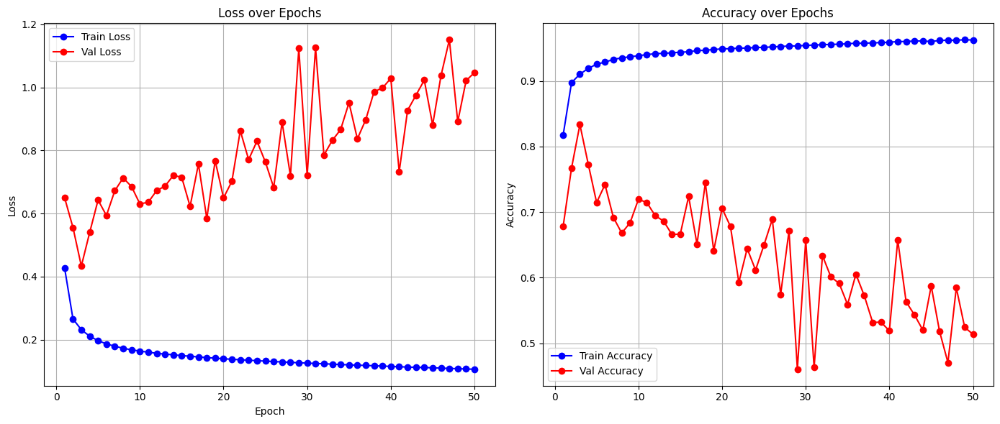

Full model built...
Total execution time: 151.54 seconds
✅ Fold 0 done: Val Loss = 1.0473, Val Acc = 0.5138
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 328/328 [00:00<00:00, 777.45it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1109.86it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1066.31it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1150.46it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1129.36it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 841.19it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1010.50it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1140.17it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1128.18it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1089.51it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 815.69it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1075.26it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1122.89it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1120.76it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1044.59it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 833.98it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1102.14it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1118.23it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 980.00it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1110.01it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 799.54it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1114.00it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1001.05it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1131.03it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1128.01it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 778.62it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 911.31it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1134.01it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1130.98it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1057.45it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1131.17it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 722.77it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1137.15it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1106.40it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1068.59it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1130.19it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 860.51it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1133.07it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1085.14it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1113.85it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1112.15it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 841.57it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1085.59it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1124.39it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1130.25it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1068.30it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 795.50it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1142.73it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1128.72it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1078.00it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


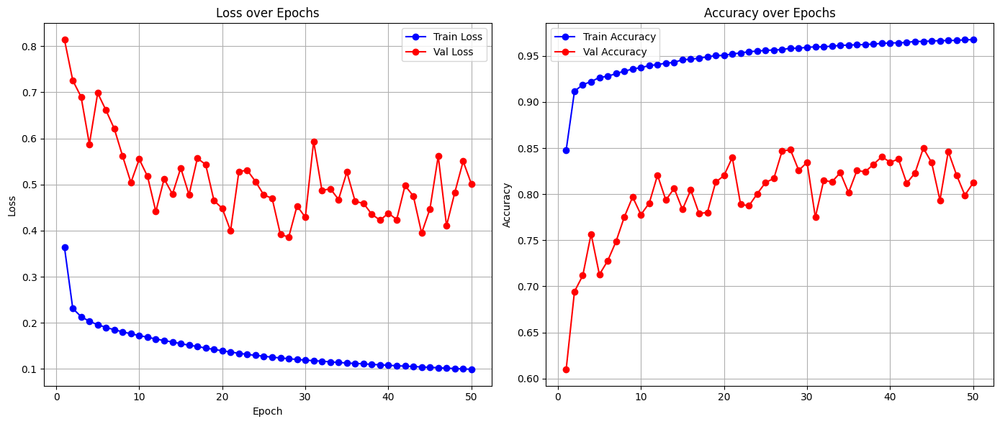

Full model built...
Total execution time: 146.21 seconds
✅ Fold 1 done: Val Loss = 0.5008, Val Acc = 0.8123
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 300/300 [00:00<00:00, 777.71it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1081.38it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1145.29it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1097.05it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 715.81it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1022.08it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1105.10it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1092.60it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1049.13it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 807.06it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1096.68it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1109.34it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1106.99it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1082.74it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 803.47it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1056.93it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1121.70it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1115.56it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1050.60it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 787.72it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 959.27it/s] 



🔁 Epoch 22/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1126.86it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1126.48it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1113.48it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 939.65it/s] 



🔁 Epoch 26/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 752.90it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1125.56it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1105.55it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1064.94it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1109.84it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 743.04it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1115.95it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1107.45it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1121.49it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1046.42it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 737.91it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1118.13it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1101.53it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1053.89it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1101.41it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 791.79it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1124.91it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1067.74it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1126.11it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1061.41it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 851.45it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1109.67it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1125.42it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1068.45it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1092.92it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


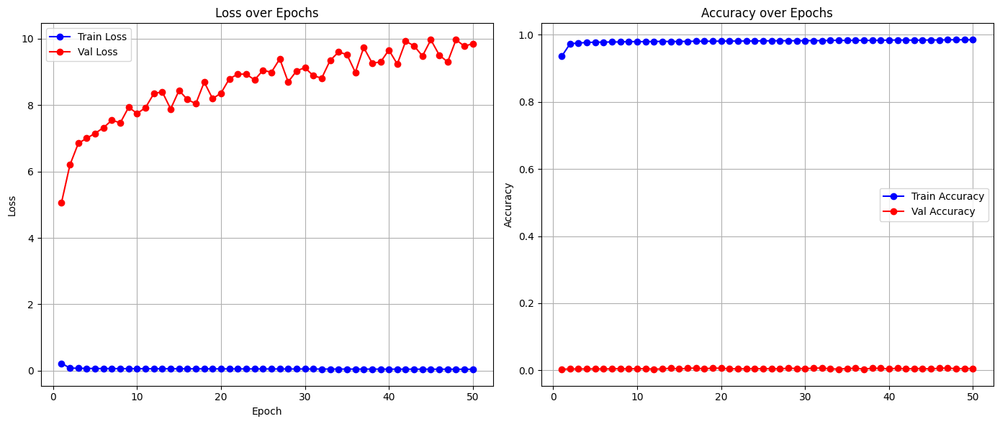

Full model built...
Total execution time: 148.54 seconds
✅ Fold 2 done: Val Loss = 9.8498, Val Acc = 0.0057
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1003.97it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1104.37it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 796.32it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1060.36it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1114.01it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1062.40it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1097.05it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 854.43it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1093.95it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1133.06it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1033.86it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1064.35it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 814.41it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1033.63it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1089.27it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1079.01it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 725.47it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1085.71it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1074.18it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 931.32it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1071.99it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 755.81it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1070.72it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 975.62it/s] 



🔁 Epoch 25/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1043.02it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1078.51it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 835.72it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1064.97it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1088.67it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1061.31it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1075.67it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 718.31it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1093.60it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1079.31it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1070.22it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 695.18it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 629.62it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1095.69it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1096.89it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1097.90it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 795.82it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1064.81it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1106.47it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1078.28it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1088.25it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 776.94it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1078.56it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 920.10it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1092.84it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1063.31it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


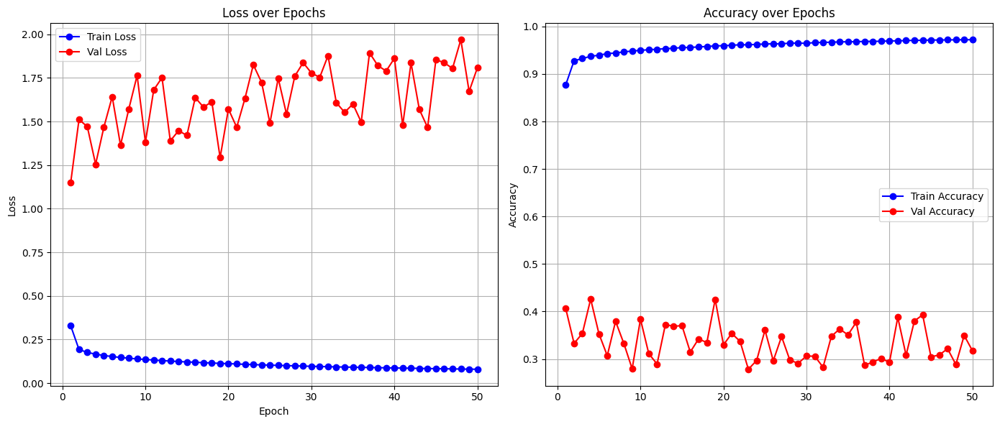

Full model built...
Total execution time: 162.59 seconds
✅ Fold 3 done: Val Loss = 1.8080, Val Acc = 0.3173
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 76/76 [00:00<00:00, 980.20it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1036.03it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1016.27it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 984.12it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 878.09it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1036.97it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1018.54it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1047.01it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 799.83it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1051.43it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 892.65it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1046.56it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1056.49it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 813.41it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 763.53it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1010.34it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1008.73it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1024.32it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 886.01it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1023.32it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1051.24it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1040.32it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 705.14it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1038.63it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1001.62it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1069.05it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1043.18it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 689.25it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1024.23it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 880.55it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1058.10it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1048.94it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 744.21it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1033.89it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 989.26it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1032.59it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 767.28it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 975.73it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 979.11it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 995.32it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 996.24it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 856.54it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 878.80it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 800.95it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1024.72it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1001.63it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 668.48it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1019.67it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1040.23it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 946.06it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


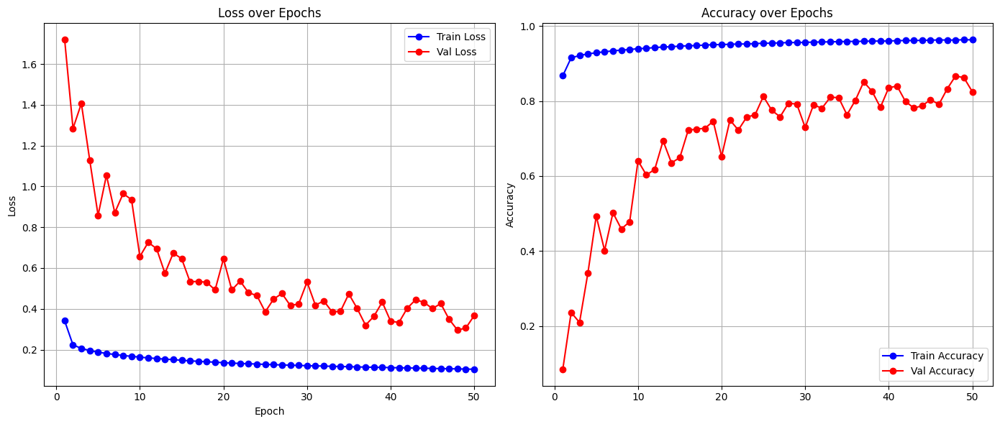

Full model built...
Total execution time: 157.31 seconds
✅ Fold 4 done: Val Loss = 0.3668, Val Acc = 0.8250
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 68/68 [00:00<00:00, 874.60it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1034.77it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 960.51it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1000.97it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 736.22it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 981.67it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1003.90it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 958.93it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 998.77it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 749.02it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1011.58it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 913.92it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1010.71it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 614.96it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 641.17it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 944.38it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 996.25it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 852.18it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 743.07it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1043.42it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 951.55it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 992.04it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 971.33it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 592.18it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1014.68it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 921.37it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 974.00it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 733.34it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 966.07it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 925.74it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 973.18it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 995.07it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 735.23it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1014.77it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 991.81it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 914.72it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 878.37it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 632.49it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 961.57it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 945.78it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 956.66it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 813.60it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 962.75it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1022.47it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 979.88it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 953.44it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 650.45it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 942.33it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1008.01it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1007.11it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


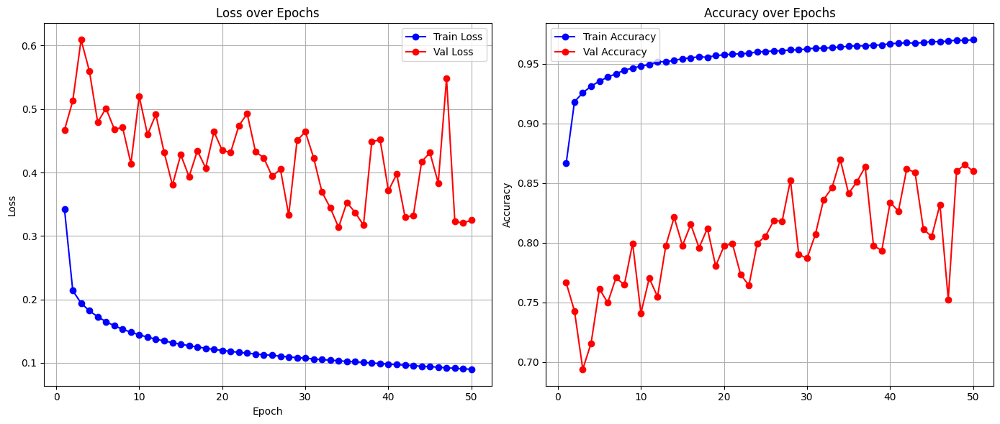

Full model built...
Total execution time: 160.20 seconds
✅ Fold 5 done: Val Loss = 0.3250, Val Acc = 0.8599
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 68/68 [00:00<00:00, 393.35it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 949.08it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 942.02it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 847.31it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 969.87it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 841.85it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 991.29it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 903.52it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 957.54it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 764.66it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 945.18it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 952.31it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 973.85it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 954.55it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 661.50it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 970.51it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 996.35it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 783.68it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 937.76it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 714.11it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1002.47it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 975.92it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 971.25it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 664.65it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 934.84it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 925.89it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 963.65it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 972.79it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 817.95it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 975.13it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 850.81it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 962.63it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 961.31it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 680.47it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 986.88it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 963.10it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 944.55it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 643.90it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 940.03it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 972.13it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 796.93it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1008.09it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 708.91it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 664.38it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 956.03it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 963.23it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 637.67it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 922.29it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 975.15it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 939.79it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


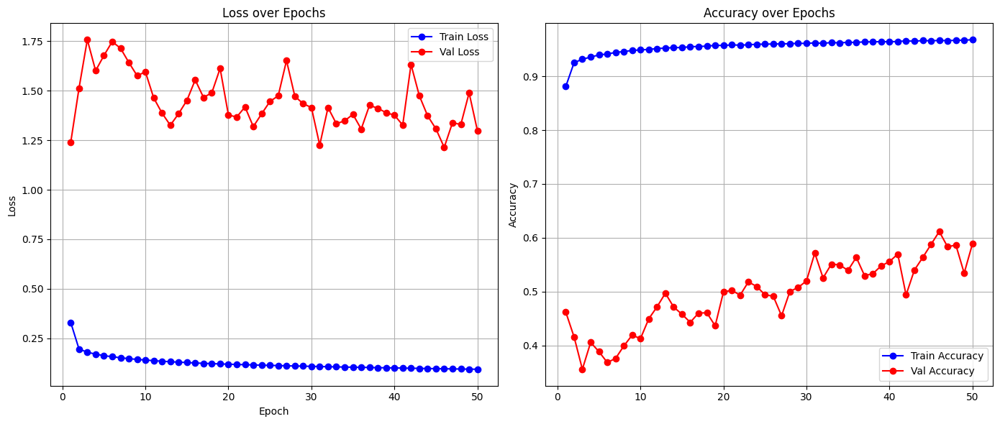

Full model built...
Total execution time: 160.56 seconds
✅ Fold 6 done: Val Loss = 1.2981, Val Acc = 0.5888
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 14/14 [00:00<00:00, 566.36it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 828.61it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 783.45it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 755.70it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 760.10it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 556.75it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 706.48it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 774.43it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 855.37it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 650.63it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 812.71it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 770.13it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 816.94it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 796.80it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 792.49it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 770.05it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 784.48it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 676.33it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 791.38it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 827.79it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 794.21it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 768.98it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 760.13it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 518.02it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 683.83it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 776.11it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 766.51it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 816.31it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 791.71it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 813.06it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 788.01it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 780.24it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 553.24it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 803.28it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 630.69it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 848.80it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 719.83it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 513.20it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 790.38it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 816.84it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 511.85it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 728.40it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 799.51it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 747.21it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 703.55it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 828.94it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 724.39it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 686.71it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 810.64it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 737.30it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


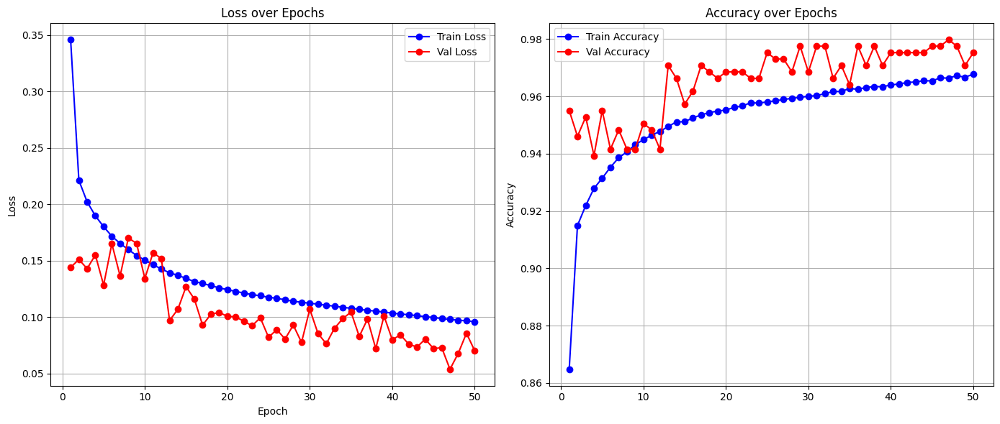

Full model built...
Total execution time: 163.22 seconds
✅ Fold 7 done: Val Loss = 0.0703, Val Acc = 0.9753
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 12/12 [00:00<00:00, 646.20it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 864.58it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 823.87it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 820.08it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 613.43it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 768.23it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 726.21it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 830.47it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 853.31it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 692.08it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 848.35it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 841.16it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 775.12it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 611.55it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 802.88it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 833.50it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 594.94it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 744.19it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 794.07it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 808.45it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 791.99it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 786.14it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 756.90it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 819.97it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 817.92it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 690.00it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 684.34it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 829.64it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 768.20it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 786.97it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 674.77it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 853.53it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 809.44it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 816.56it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 799.60it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 825.03it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 875.47it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 838.80it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 865.49it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 861.06it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 781.75it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 701.42it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 715.80it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 778.15it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 661.19it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 837.80it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 817.54it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 689.40it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 828.48it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 662.49it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


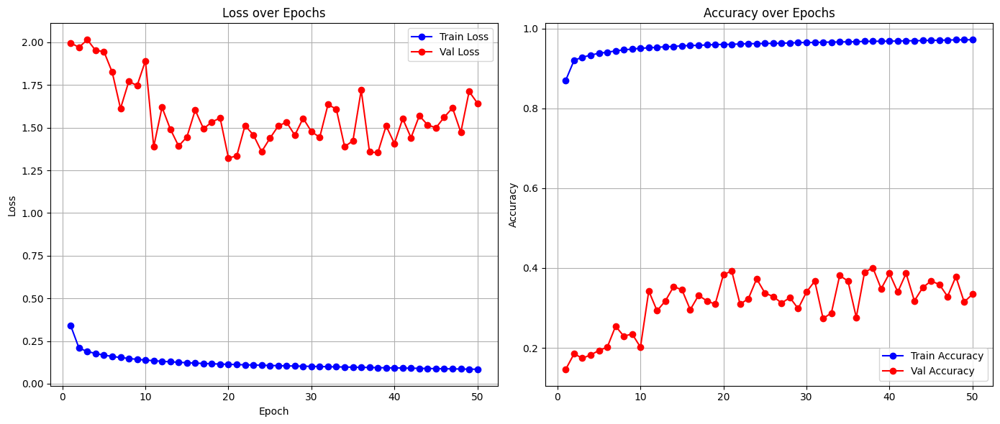

Full model built...
Total execution time: 166.48 seconds
✅ Fold 8 done: Val Loss = 1.6436, Val Acc = 0.3343
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 11/11 [00:00<00:00, 719.11it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 801.05it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 781.96it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 716.35it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 788.70it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 815.94it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 731.19it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 770.87it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 550.60it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 802.58it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 783.28it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 794.62it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 589.75it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 751.41it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 821.67it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 634.23it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 677.92it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 636.91it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 819.69it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 806.55it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 707.67it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 708.02it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 773.79it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 780.38it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 710.24it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 783.30it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 811.36it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 812.36it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 788.52it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 813.88it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 730.68it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 836.32it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 838.91it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 815.19it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 783.09it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 768.90it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 777.91it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 670.93it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 790.43it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 538.43it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 823.79it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 782.25it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 799.34it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 766.16it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 611.33it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 443.00it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 799.64it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 743.71it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 819.65it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 786.62it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


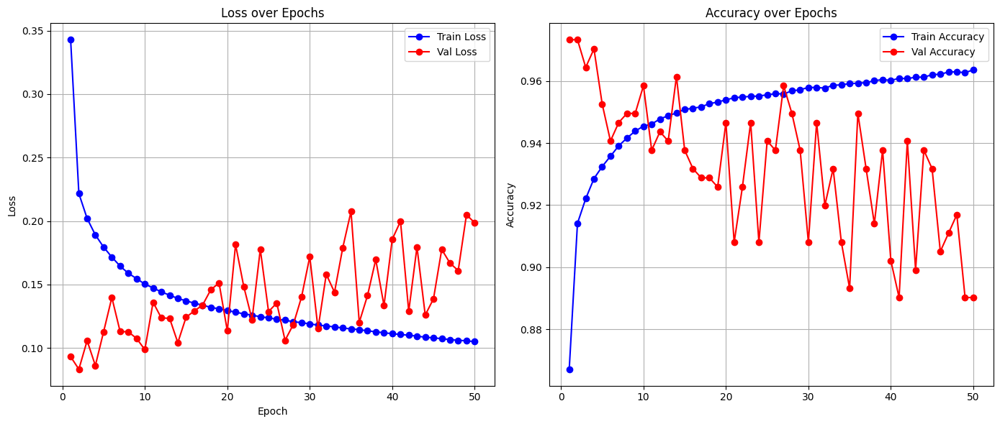

Full model built...
Total execution time: 165.26 seconds
✅ Fold 9 done: Val Loss = 0.1986, Val Acc = 0.8902
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alat

Evaluating: 100%|██████████| 8/8 [00:00<00:00, 678.29it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 760.85it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 733.72it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 724.83it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 585.23it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 755.83it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 573.14it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 709.16it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 654.84it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 804.55it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 735.04it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 762.17it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 762.46it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 509.74it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 763.89it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 758.70it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 785.08it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 680.85it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 741.83it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 643.71it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 710.49it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 840.04it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 774.84it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 820.56it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 824.70it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 738.92it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 841.32it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 741.50it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 798.88it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 835.46it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 730.43it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 850.32it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 806.69it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 768.15it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 820.38it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 723.70it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 682.71it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 826.65it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 820.62it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 738.84it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 752.88it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 633.38it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 632.27it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 824.29it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 576.08it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 774.80it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 730.81it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 809.69it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 753.32it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 508.20it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


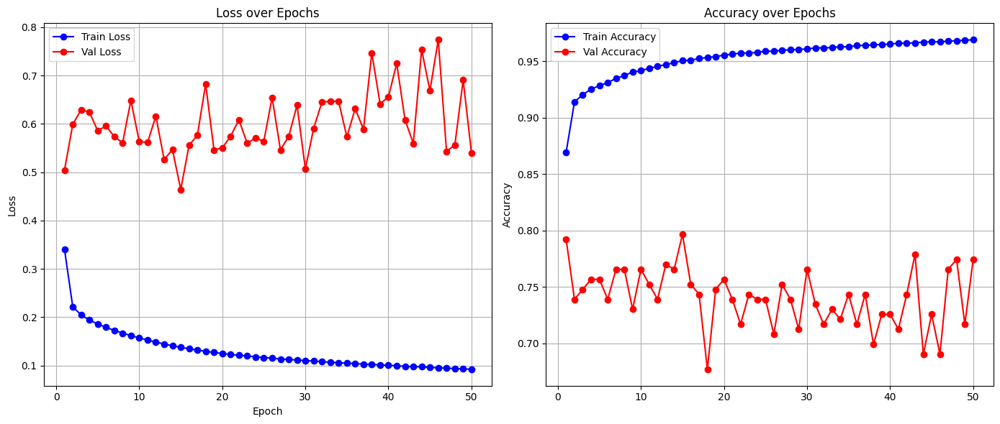

Full model built...
Total execution time: 165.92 seconds
✅ Fold 10 done: Val Loss = 0.5398, Val Acc = 0.7743
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 5/5 [00:00<00:00, 722.41it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 615.63it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 383.27it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 767.20it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 730.44it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 606.57it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 507.87it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 636.50it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 595.90it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 786.69it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 669.14it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 665.97it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 665.23it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 757.97it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 521.84it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 756.22it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 401.14it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 709.86it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 778.11it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 559.84it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 606.18it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 721.79it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 772.49it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 780.77it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 748.42it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 740.10it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 811.37it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 784.77it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 749.65it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 491.29it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 652.12it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 712.93it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 658.18it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 644.88it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 582.72it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 751.34it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 440.04it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 711.28it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 756.79it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 663.11it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 709.82it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 688.34it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 781.97it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 544.35it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 593.84it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 792.72it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 672.36it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 772.55it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 678.60it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 742.33it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


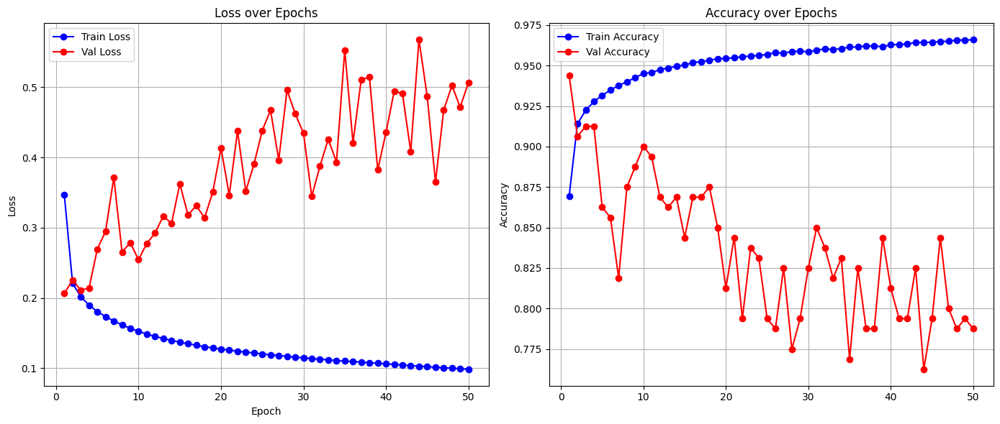

Full model built...
Total execution time: 169.35 seconds
✅ Fold 11 done: Val Loss = 0.5066, Val Acc = 0.7875
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 5/5 [00:00<00:00, 647.63it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 684.38it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 815.89it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 781.59it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 548.07it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 706.30it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 773.80it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 753.48it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 811.50it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 794.01it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 870.87it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 617.43it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 801.30it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 779.52it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 607.52it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 725.78it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 814.78it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 724.18it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 878.09it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 483.33it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 785.07it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 676.74it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 810.71it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 702.94it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 838.93it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 755.70it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 790.24it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 627.35it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 623.80it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 679.13it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 675.76it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 805.11it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 806.60it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 667.03it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 746.66it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 676.74it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 568.94it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 590.86it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 553.15it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 563.72it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 698.03it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 644.31it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 556.14it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 638.21it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 733.81it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 573.98it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 691.81it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 782.26it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 735.97it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 763.68it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


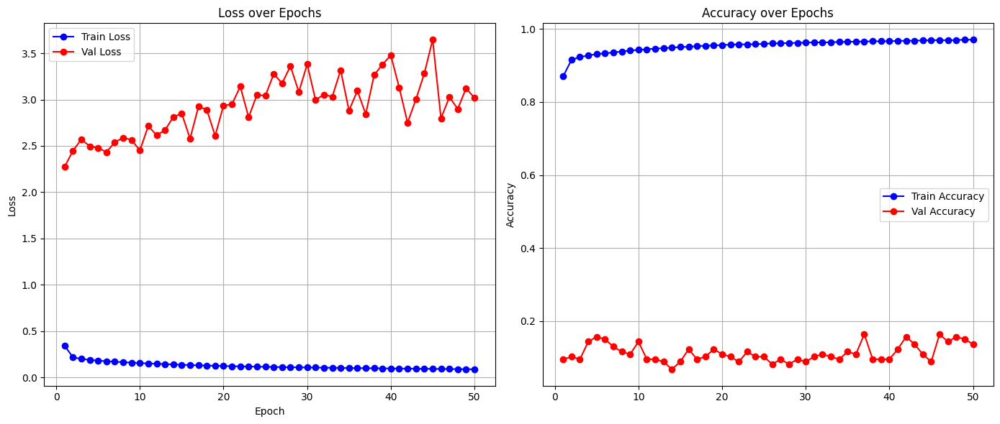

Full model built...
Total execution time: 170.25 seconds
✅ Fold 12 done: Val Loss = 3.0186, Val Acc = 0.1370
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 4/4 [00:00<00:00, 682.08it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 561.73it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 715.66it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 777.91it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 805.94it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 666.82it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 672.92it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 672.95it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 621.93it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 662.48it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 664.68it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 735.62it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 513.21it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 653.06it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 568.49it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 737.85it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 710.57it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 654.13it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 762.43it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 706.14it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 667.03it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 710.84it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 655.44it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 478.60it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 693.79it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 723.31it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 380.54it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 765.59it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 508.23it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 608.66it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 657.83it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 777.84it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 397.22it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 745.82it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 697.37it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 803.08it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 788.55it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 536.12it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 739.96it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 746.35it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 761.42it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 745.36it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 699.40it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 737.82it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 721.60it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 710.48it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 600.47it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 625.95it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 950.60it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 615.52it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


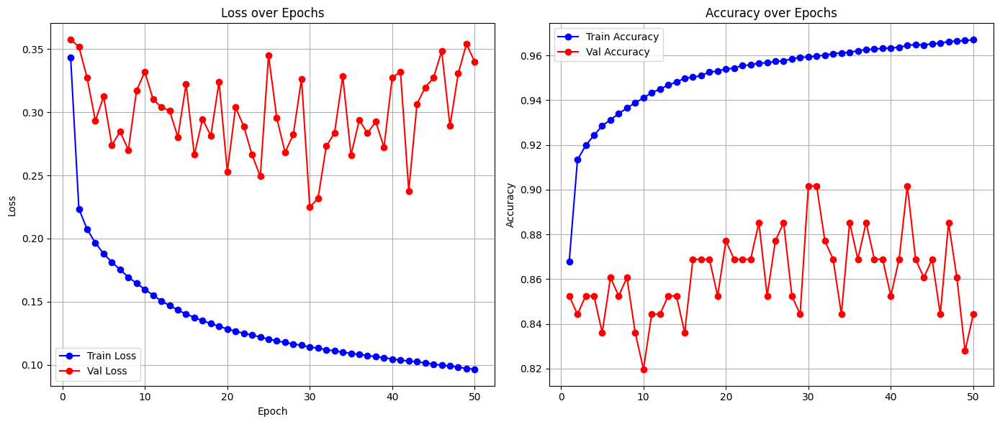

Full model built...
Total execution time: 169.06 seconds
✅ Fold 13 done: Val Loss = 0.3401, Val Acc = 0.8443
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 3/3 [00:00<00:00, 521.33it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 783.59it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 663.90it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 618.99it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 753.87it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 695.38it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 578.29it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 647.34it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 650.18it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 743.41it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 571.15it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 777.68it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 760.34it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 434.24it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 665.80it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 687.48it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 768.33it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 684.64it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 772.81it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 808.25it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 691.03it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 565.57it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 678.65it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 713.72it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 813.06it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 579.32it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 618.39it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 652.34it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 730.59it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 756.14it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 690.23it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 765.66it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 810.23it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 803.71it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 679.79it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 766.92it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 468.15it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 630.75it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 594.35it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 635.02it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 486.20it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 760.94it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 716.49it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 735.07it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 624.03it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 790.98it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 589.72it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 794.78it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 805.31it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 738.95it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


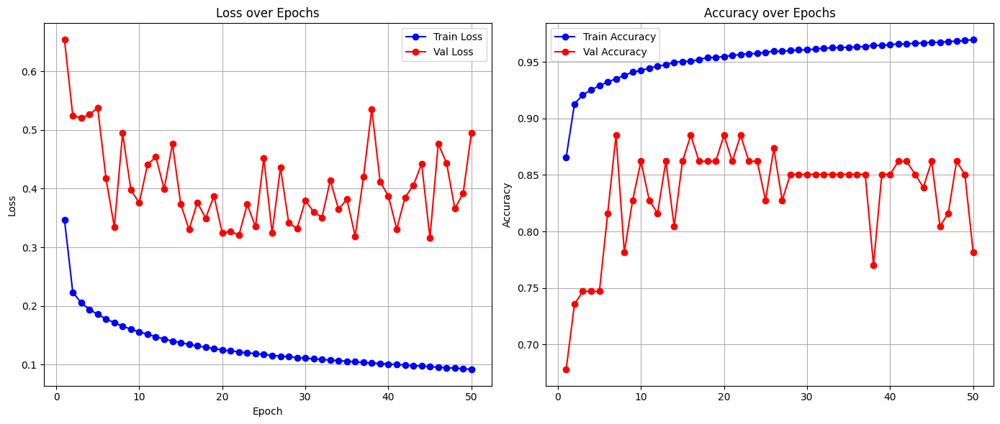

Full model built...
Total execution time: 171.12 seconds
✅ Fold 14 done: Val Loss = 0.4955, Val Acc = 0.7816
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 3/3 [00:00<00:00, 760.89it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 675.92it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 648.87it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 799.93it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 831.49it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 657.07it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 800.49it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 590.41it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 591.97it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 776.29it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 625.46it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 629.74it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 728.68it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 732.63it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 720.18it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 666.19it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 698.90it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 812.74it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 825.05it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 741.83it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 710.58it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 688.38it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 769.13it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 613.02it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 710.86it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 617.90it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 734.98it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 573.99it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 564.48it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 749.47it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 829.73it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 652.91it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 785.21it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 549.98it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 652.51it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 606.55it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 756.87it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 717.18it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 748.18it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 639.25it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 764.55it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 598.30it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 625.98it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 723.61it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 455.70it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 728.14it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 692.66it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 727.21it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 685.49it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 754.42it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


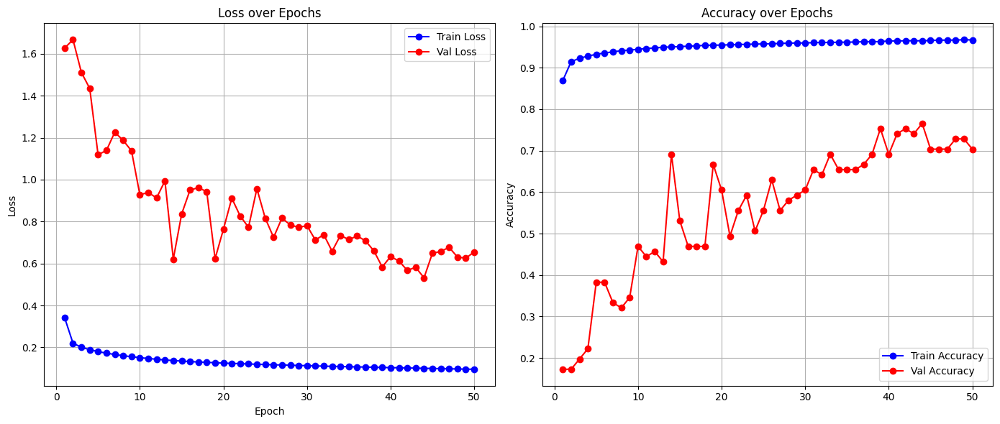

Full model built...
Total execution time: 172.96 seconds
✅ Fold 15 done: Val Loss = 0.6551, Val Acc = 0.7037
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 617.58it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 790.41it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 786.41it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 807.14it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 522.36it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 712.59it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 623.92it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 724.34it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 705.10it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 591.75it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 652.96it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 684.67it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 667.40it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 491.34it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 707.72it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 753.15it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 773.79it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 475.84it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 723.65it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 713.98it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 770.02it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 697.83it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 669.64it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 611.82it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 628.78it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 740.13it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 774.21it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 775.72it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 622.44it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 797.24it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 566.87it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 591.16it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 684.62it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 710.54it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 491.08it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 618.67it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 664.34it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 695.57it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 679.40it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 521.10it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 533.05it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 545.81it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 592.92it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 644.63it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 440.35it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 542.21it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 593.21it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 513.00it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 657.31it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 766.71it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


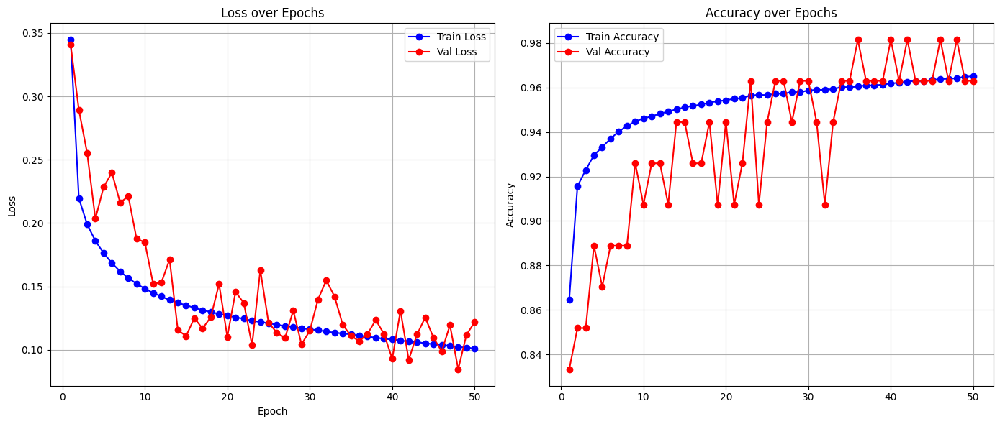

Full model built...
Total execution time: 172.43 seconds
✅ Fold 16 done: Val Loss = 0.1219, Val Acc = 0.9630
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 813.01it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 544.50it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 717.90it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 730.27it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 492.38it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 691.56it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 848.19it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 732.63it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 786.92it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 699.98it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 669.59it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 466.66it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 745.26it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 882.73it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 599.83it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 857.03it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 446.82it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 817.92it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 814.11it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 647.87it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 766.50it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 438.73it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 858.08it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 749.85it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 627.47it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 694.82it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 777.80it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 670.02it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 778.16it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 811.51it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 725.66it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 799.60it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 573.78it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 894.88it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 473.93it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 620.18it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 621.89it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 660.99it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 882.36it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 397.58it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 825.81it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 816.09it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 866.14it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 499.92it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 770.52it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 877.47it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 811.98it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 847.76it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 875.64it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 662.14it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


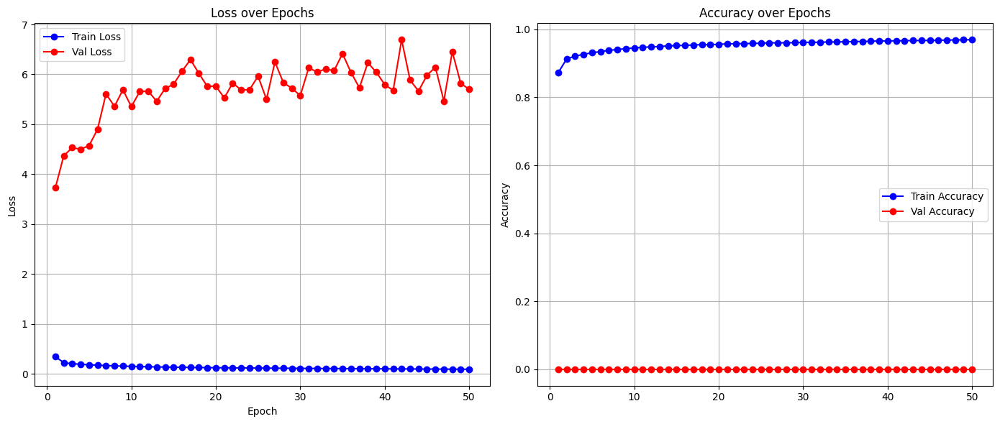

Full model built...
Total execution time: 172.05 seconds
✅ Fold 17 done: Val Loss = 5.7014, Val Acc = 0.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 436.32it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 555.54it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.42it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 527.25it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 556.50it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 567.95it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 540.57it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 706.71it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 646.07it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.33it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 705.04it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.30it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 551.74it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 535.12it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 696.50it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.74it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 607.87it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 556.20it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 563.22it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 680.56it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 546.56it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 196.31it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 638.79it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 684.34it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 591.66it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 330.96it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.45it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 701.51it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 375.67it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 547.34it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 288.82it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 496.31it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.92it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 455.51it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.98it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.85it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 551.52it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.83it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 548.42it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 620.92it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.92it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 697.89it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 556.42it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 692.70it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.53it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 561.64it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 582.62it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 452.12it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 473.24it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 600.13it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


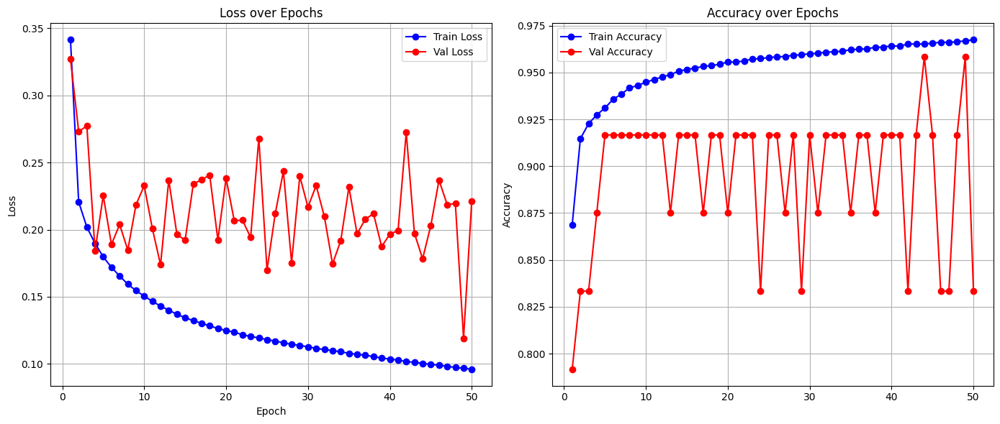

Full model built...
Total execution time: 172.23 seconds
✅ Fold 18 done: Val Loss = 0.2213, Val Acc = 0.8333
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 697.19it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.29it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.74it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.47it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.78it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.06it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.58it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 303.47it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 603.24it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.47it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.64it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 544.29it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 706.59it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 593.67it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 518.65it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 616.36it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.20it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.41it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 534.65it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.02it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.29it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 630.06it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 459.85it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 527.72it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 445.92it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 508.52it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.65it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.66it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 533.29it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 607.78it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 595.78it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 620.09it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 563.52it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 577.97it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.39it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 812.38it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 583.76it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 579.96it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 321.53it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 559.09it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 607.08it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 470.27it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 530.52it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 543.30it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 493.91it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.78it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 590.75it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 565.04it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.38it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.86it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


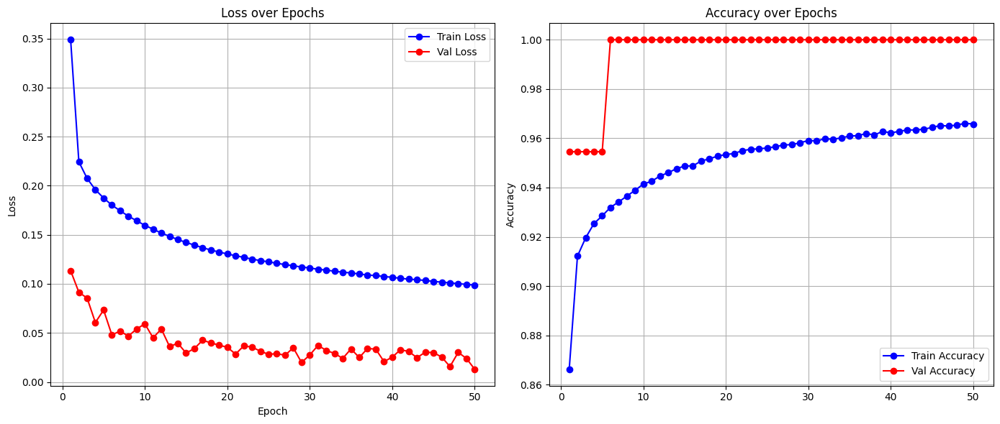

Full model built...
Total execution time: 173.37 seconds
✅ Fold 19 done: Val Loss = 0.0130, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 632.72it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.73it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 506.62it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 610.97it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 534.10it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 508.09it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 363.39it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 431.82it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 654.95it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 580.13it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 430.67it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 556.42it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.65it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.65it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.03it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.45it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 584.73it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 640.16it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 587.27it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.97it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.68it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.62it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.13it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 679.90it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 602.89it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.56it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 719.56it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.68it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 554.95it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 646.07it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 498.20it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.08it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 626.58it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 560.81it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 581.49it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 670.34it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 605.76it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.59it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 705.40it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.92it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.81it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 543.73it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 576.70it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.22it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 584.16it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 698.35it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 626.20it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 559.24it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 732.63it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.49it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


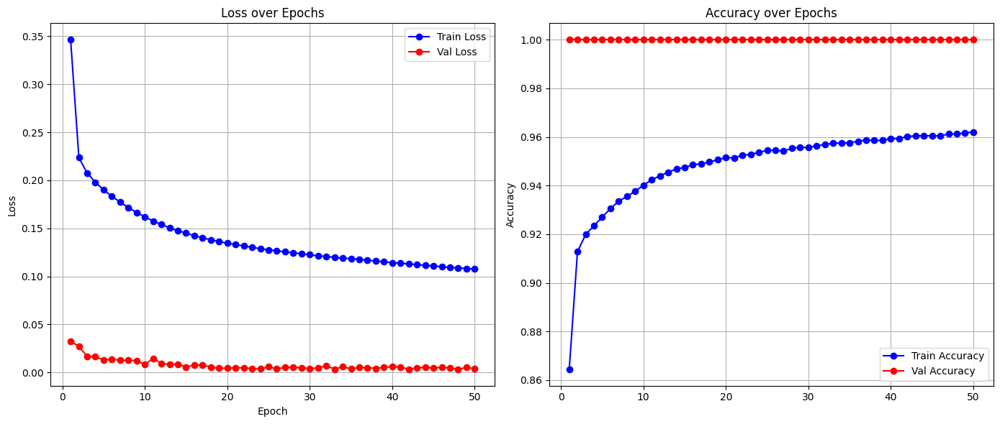

Full model built...
Total execution time: 174.75 seconds
✅ Fold 20 done: Val Loss = 0.0039, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.51it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.57it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.07it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.75it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 672.06it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.87it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 636.95it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.37it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.00it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 626.58it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 578.21it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 611.33it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 559.24it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.78it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.73it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.98it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 152.97it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 687.14it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 171.50it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.46it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 545.57it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.03it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.52it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.22it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.92it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 671.41it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.18it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.33it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 493.97it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.25it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 244.51it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.93it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 800.29it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 590.25it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 629.87it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.90it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 517.18it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 644.19it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.73it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 657.72it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 793.17it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 490.33it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 489.87it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.05it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 672.49it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.27it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 380.95it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.57it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 548.28it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.72it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


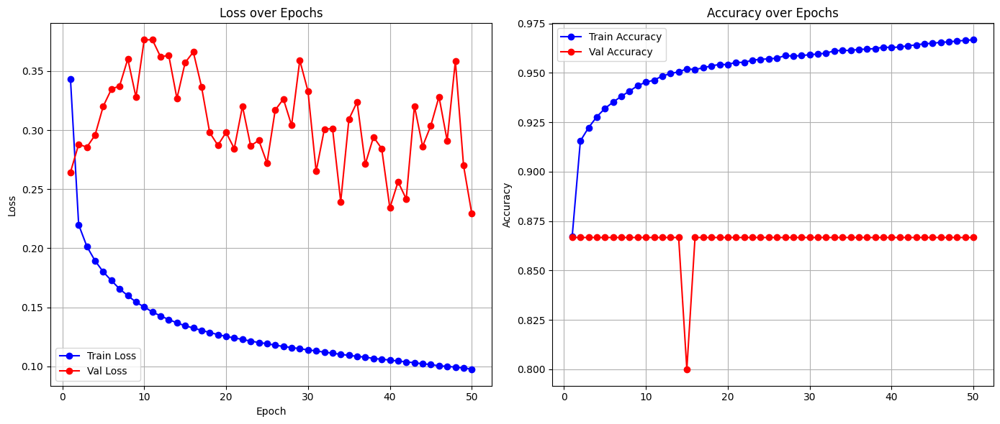

Full model built...
Total execution time: 175.67 seconds
✅ Fold 21 done: Val Loss = 0.2295, Val Acc = 0.8667
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 596.21it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.50it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.53it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 785.89it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.34it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 785.30it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 620.92it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.83it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.86it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 631.86it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.37it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.99it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 325.24it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 802.43it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 637.53it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.68it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 563.30it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 831.05it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.18it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 808.62it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 604.02it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 636.85it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 814.74it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.28it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 618.36it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 823.06it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 800.29it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.90it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 394.57it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 615.63it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 801.97it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.04it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 740.13it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 802.89it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.66it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 679.02it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.20it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 484.61it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 605.41it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.00it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.48it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 368.54it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.10it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 560.21it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 579.32it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 720.79it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.78it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 799.07it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.26it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 804.12it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


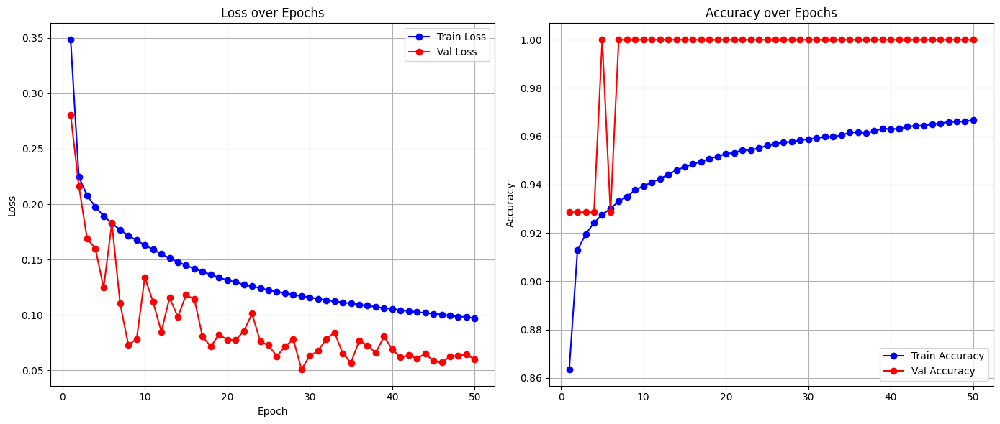

Full model built...
Total execution time: 175.64 seconds
✅ Fold 22 done: Val Loss = 0.0598, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 312.33it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 693.39it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 477.38it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.97it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 787.96it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 451.44it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 602.63it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 812.22it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.45it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 320.98it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 773.43it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 492.12it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 625.27it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.17it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 671.09it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 792.28it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 618.08it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 625.36it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 670.87it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.78it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 616.54it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.34it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 617.81it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 672.49it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 771.30it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.05it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 699.75it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 606.11it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 656.28it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.93it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 612.22it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 808.93it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 629.68it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 801.51it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 429.04it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.68it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 867.49it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.91it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 507.36it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 638.99it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.51it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 609.11it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 802.74it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 638.99it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 618.63it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 636.85it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 799.22it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 807.37it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.39it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 604.02it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


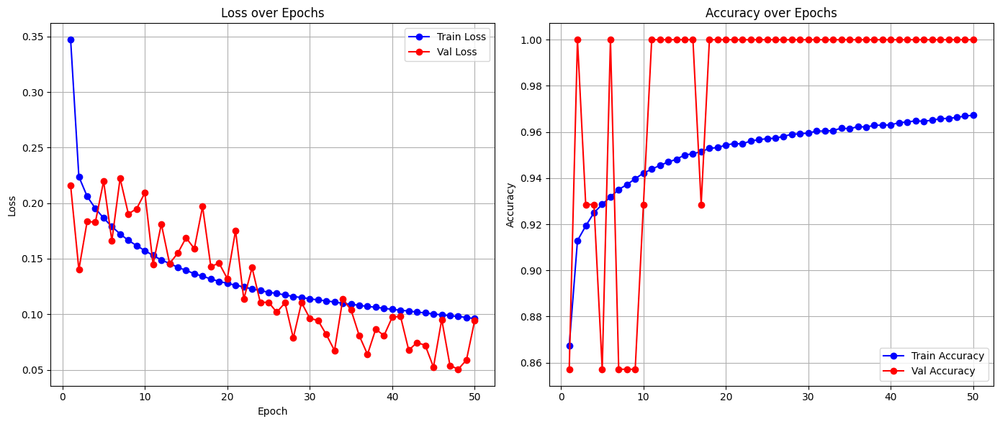

Full model built...
Total execution time: 177.39 seconds
✅ Fold 23 done: Val Loss = 0.0945, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 630.25it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 493.22it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.42it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 719.31it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 679.24it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 550.65it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.92it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 592.83it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 563.15it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 291.51it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 864.63it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 894.12it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.00it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.29it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 385.61it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 766.78it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 680.12it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.37it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 720.55it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 692.59it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 744.07it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 651.59it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 881.34it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 862.85it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 323.93it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.51it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 800.29it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.33it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 559.02it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 832.37it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 632.05it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 890.89it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 861.96it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 847.68it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 873.63it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.89it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 857.56it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 869.83it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.51it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.78it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 506.62it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 773.00it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.20it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 393.65it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 855.46it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.26it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 593.67it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 307.37it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.53it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.69it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


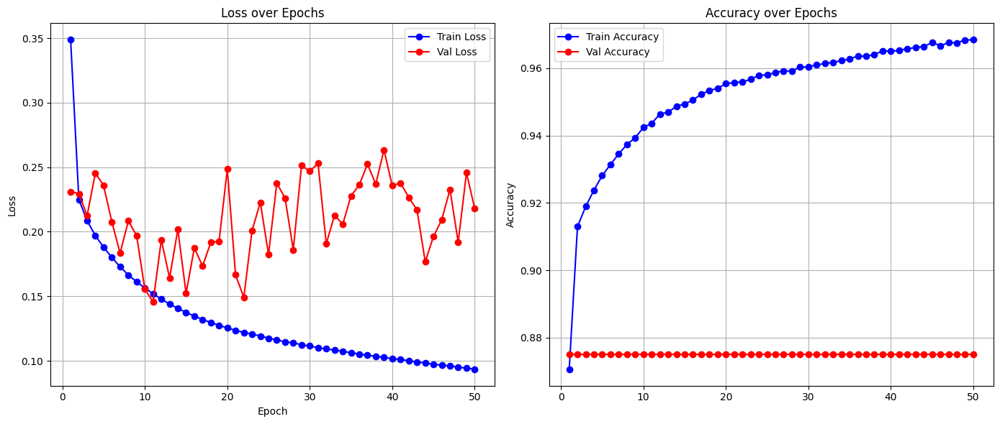

Full model built...
Total execution time: 176.53 seconds
✅ Fold 24 done: Val Loss = 0.2180, Val Acc = 0.8750
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 568.95it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 894.31it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 898.33it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 906.29it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.08it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 869.83it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 949.58it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 891.46it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 847.16it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.78it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 644.88it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.84it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.91it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 906.48it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.85it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 385.75it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.78it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 892.79it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 701.86it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 915.99it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 916.39it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.42it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.06it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 593.59it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.80it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 937.07it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 864.63it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.32it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 851.12it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 942.96it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 905.12it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.62it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 537.59it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 897.95it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 941.69it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 837.19it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 659.17it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.35it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 892.79it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 765.52it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 872.54it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 887.50it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.16it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 392.28it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 903.17it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.53it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 785.89it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.70it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 420.69it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 583.43it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


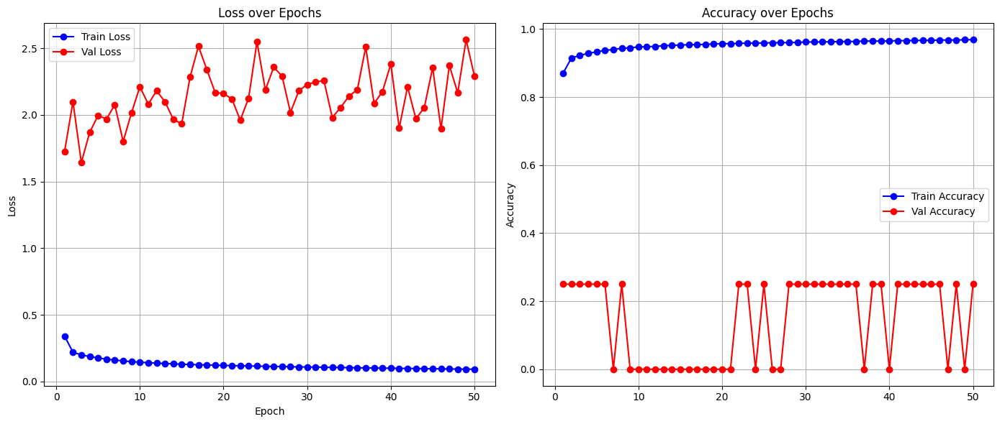

Full model built...
Total execution time: 179.39 seconds
✅ Fold 25 done: Val Loss = 2.2907, Val Acc = 0.2500
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 931.03it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 281.69it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.10it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 458.74it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 862.85it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 839.36it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 842.74it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 904.14it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 771.01it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 942.75it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 615.72it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 931.86it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.98it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 928.97it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 890.70it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 705.52it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 830.72it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.69it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 412.66it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 874.18it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 657.21it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 814.90it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 402.37it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 830.23it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.71it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.31it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.74it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.57it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 687.70it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 927.74it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 888.81it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 927.74it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 913.00it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 610.17it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.70it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 922.84it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.08it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 883.20it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 744.07it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 477.71it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 416.56it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.89it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.13it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 950.44it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 808.62it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 795.73it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 494.03it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 927.74it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 589.25it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 360.89it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


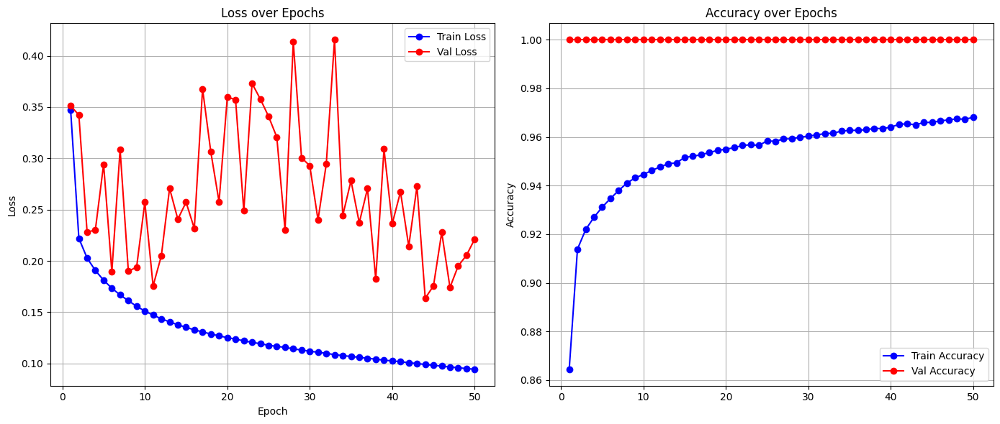

Full model built...
Total execution time: 178.09 seconds
✅ Fold 26 done: Val Loss = 0.2213, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 899.87it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.52it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 949.80it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 327.65it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 926.71it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 904.33it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 922.64it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 796.19it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 928.56it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 478.04it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 922.64it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.98it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.25it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 578.13it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 882.64it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.57it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 626.86it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.38it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 335.92it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.26it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 909.04it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 894.31it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 313.83it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 348.83it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.44it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 871.09it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 938.32it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.19it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 522.33it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 318.98it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 888.81it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 625.08it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 896.22it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 818.08it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.11it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 697.31it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 886.93it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 815.54it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.00it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 544.93it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.34it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.89it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 948.51it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 482.44it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 951.52it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.10it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 793.17it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 928.56it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 644.58it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.99it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


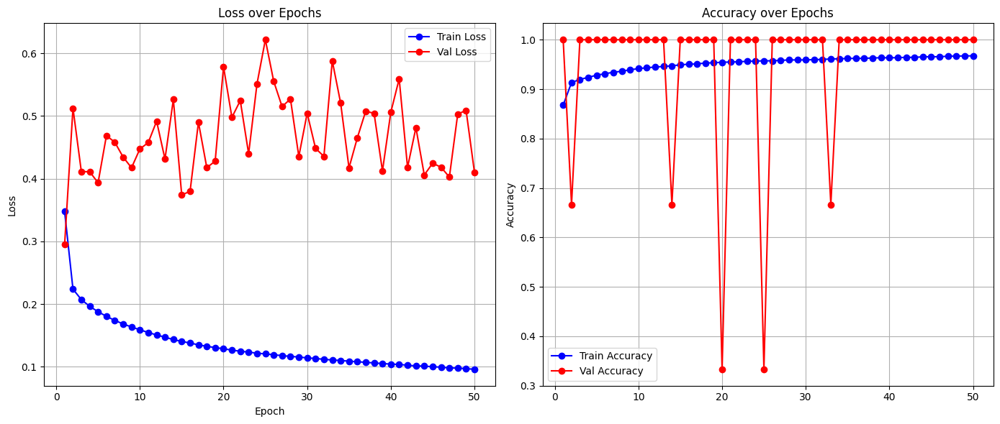

Full model built...
Total execution time: 181.38 seconds
✅ Fold 27 done: Val Loss = 0.4102, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 375.56it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 809.24it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 829.73it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 892.60it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.53it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 313.69it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 952.17it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.57it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 927.74it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.88it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 924.26it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.46it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 486.24it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 349.50it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.92it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 327.91it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 917.59it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 901.03it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 765.38it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 950.87it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 944.66it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.40it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.05it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 879.86it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 784.86it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 957.60it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 914.79it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 903.56it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.77it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 808.00it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.39it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 682.56it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.65it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 788.40it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 397.68it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 900.45it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 834.36it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 954.34it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 923.04it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 806.75it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 824.03it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 688.72it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 906.09it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.25it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.14it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 836.52it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.63it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.04it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 567.95it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 947.01it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


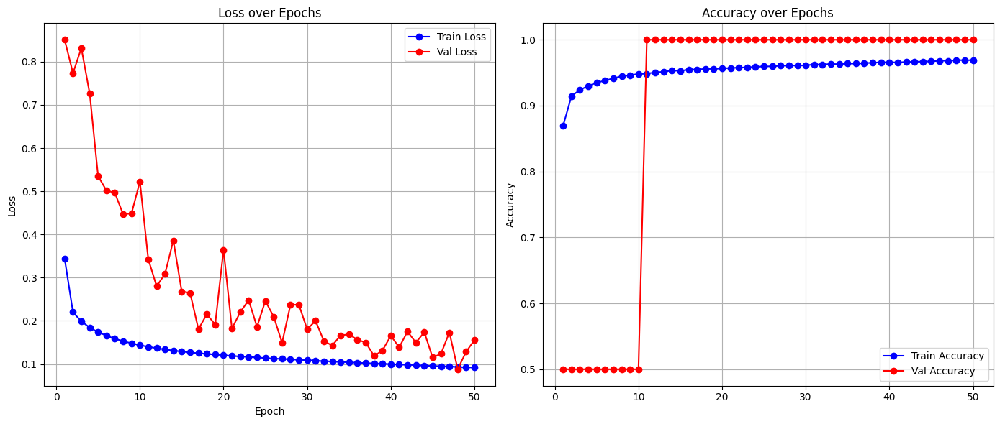

Full model built...
Total execution time: 182.39 seconds
✅ Fold 28 done: Val Loss = 0.1556, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_ala

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 798.92it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.56it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 696.03it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.38it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 898.91it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 913.79it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 767.63it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 920.61it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.57it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 883.57it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.65it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.34it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 767.48it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 913.79it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.91it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 883.38it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 917.39it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 696.84it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.52it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 554.51it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 909.43it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 930.62it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 916.59it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 692.13it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 524.68it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 864.45it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 801.82it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 903.75it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.47it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 943.81it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 456.10it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.78it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 874.91it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 469.42it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.07it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 857.38it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 373.69it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 844.77it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 547.85it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.62it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 622.85it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 265.68it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 890.32it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.69it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 752.88it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.70it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.45it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.92it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 851.98it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 911.81it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


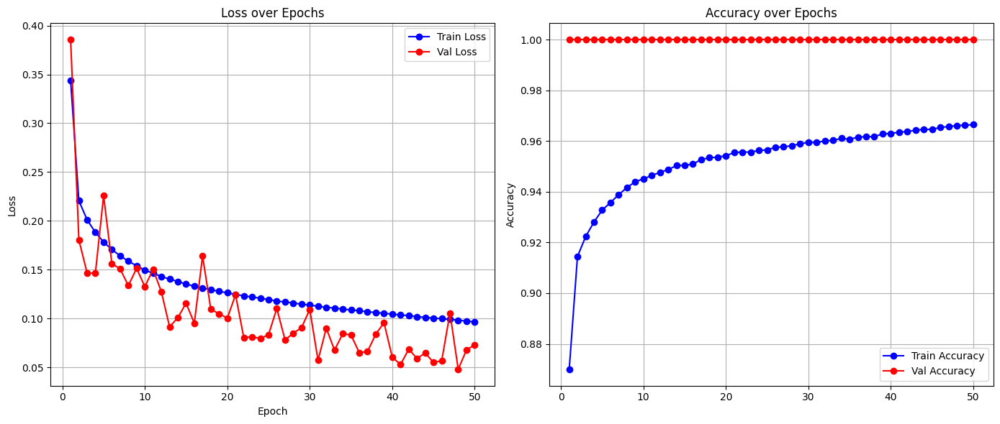

Full model built...
Total execution time: 181.77 seconds
✅ Fold 29 done: Val Loss = 0.0732, Val Acc = 1.0000

📊 Cross-validation results:
Average Validation Loss: 1.0826
Average Validation Accuracy: 0.7313
All Fold Accuracies: [0.5137733689431515, 0.8123153178915261, 0.005739330063654388, 0.31732522796352586, 0.8249896565990897, 0.8599348534201955, 0.5888111888111888, 0.9752808988764045, 0.3342541436464088, 0.8902077151335311, 0.7743362831858407, 0.7875, 0.136986301369863, 0.8442622950819673, 0.7816091954022989, 0.7037037037037037, 0.9629629629629629, 0.0, 0.8333333333333334, 1.0, 1.0, 0.8666666666666667, 1.0, 1.0, 0.875, 0.25, 1.0, 1.0, 1.0, 1.0]

📊 Cross-validation results:
Average Validation Loss (No small species): 1.3161
Average Validation Accuracy (No small species): 0.6734
All Fold Accuracies (No small species): [0.5137733689431515, 0.8123153178915261, 0.005739330063654388, 0.31732522796352586, 0.8249896565990897, 0.8599348534201955, 0.5888111888111888, 0.9752808988764045, 0.334

In [ ]:
all_val_losses = []
all_val_accuracies = []

n_splits = 30

embeddings_save_path_BC2_new = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
model_name_final = 'group_k_fold_new_embeddings'
epochs=50

for fold_idx in range(n_splits):
  val_loss, val_acc = create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=False,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name=model_name_final,
                                           save_model=False, verbose=False, embeddings_save_path=embeddings_save_path_BC2_new,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx)
  all_val_losses.append(val_loss)
  all_val_accuracies.append(val_acc)
  print(f"✅ Fold {fold_idx} done: Val Loss = {val_loss:.4f}, Val Acc = {val_acc:.4f}")


mean_loss = sum(all_val_losses) / len(all_val_losses)
mean_acc = sum(all_val_accuracies) / len(all_val_accuracies)

print("\n📊 Cross-validation results:")
print(f"Average Validation Loss: {mean_loss:.4f}")
print(f"Average Validation Accuracy: {mean_acc:.4f}")
print(f"All Fold Accuracies: {all_val_accuracies}")

mean_loss_no_small = sum(all_val_losses[:22]) / len(all_val_losses[:22])
mean_acc_no_small = sum(all_val_accuracies[:22]) / len(all_val_accuracies[:22])

print("\n📊 Cross-validation results:")
print(f"Average Validation Loss (No small species): {mean_loss_no_small:.4f}")
print(f"Average Validation Accuracy (No small species): {mean_acc_no_small:.4f}")
print(f"All Fold Accuracies (No small species): {all_val_accuracies[:22]}")

### Testing on Junceum without Hyssopifolia in the training

Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 9583}
VALIDATION - Total

Evaluating: 100%|██████████| 76/76 [00:00<00:00, 990.13it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1008.10it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 618.77it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1045.73it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 877.33it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1011.43it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1027.86it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 874.95it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 669.94it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1010.01it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1016.30it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 837.10it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 985.46it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 613.01it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1033.15it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 983.89it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 979.99it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 997.46it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 792.16it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 597.51it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1030.85it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1016.53it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1012.86it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 825.44it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 638.90it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 979.06it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1004.41it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 947.58it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 981.05it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 998.63it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 604.30it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 839.46it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 952.74it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 949.60it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 962.21it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 578.37it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 995.03it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1007.00it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 802.12it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 985.79it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 994.62it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 657.40it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1016.19it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 944.09it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 838.40it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1002.05it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 603.09it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 974.97it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1024.76it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1012.96it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


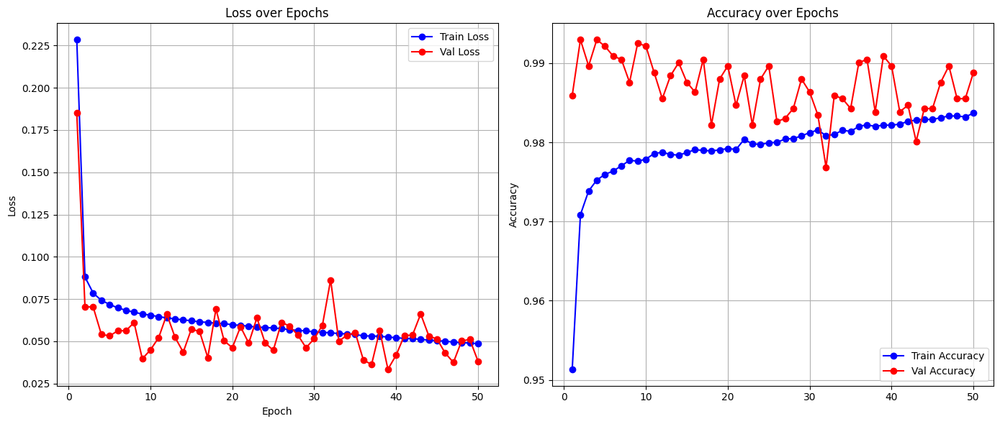

Full model built...
Total execution time: 136.97 seconds


(0.038278548208011, 0.9888291270169631)

In [ ]:
embeddings_save_path = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
epochs=50
n_splits=25
fold_idx=3

create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=False,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name='test',
                                           save_model=False, verbose=False, embeddings_save_path=embeddings_save_path,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx)

### Testing on Hyssopifolia without Junceum and Portula in the training
#### Junceum and Portula have embeddings close to the Hyssopifolia, but different class

Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 1418/1418 [36:46<00:00,  1.56s/it]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in original embeddings: 45361
📊 Total unique groups: 30
📊 Total augmented samples (class 1 only): 45361
📊 Augmented class distribution: {np.int64(1): 20528, np.int64(0): 24833}

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
VALIDATION - Total samples: 13105
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
TRAINING (original) - Total samples: 32256
TRAINING (with augmentation) - Class distribution: {np.int64(1): 41056, np.int64(0): 36561}
TRAINING (with augmentation) - Total samples: 77617
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
VALIDATION - Total samples: 10491
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
TRAINING (original) - Total samples: 34870
TRAINING (with augmentation) - Class distribution: {np.

Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1101.96it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1054.71it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 817.03it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1046.21it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1117.77it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1077.85it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1067.95it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 795.68it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1074.35it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1109.76it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1065.83it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1111.20it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 810.04it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1106.31it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1135.83it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1099.20it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1130.75it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 770.98it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1096.77it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1095.55it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1122.36it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1116.35it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 798.86it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1059.83it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1125.86it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1084.53it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1127.36it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 762.66it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1103.61it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1111.06it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1014.77it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1093.61it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 740.30it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1067.91it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1092.41it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1118.48it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1042.66it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 707.25it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1098.25it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1094.48it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1091.94it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1111.93it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 765.33it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1109.99it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1119.00it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1093.78it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1088.52it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 772.05it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1108.31it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1141.44it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


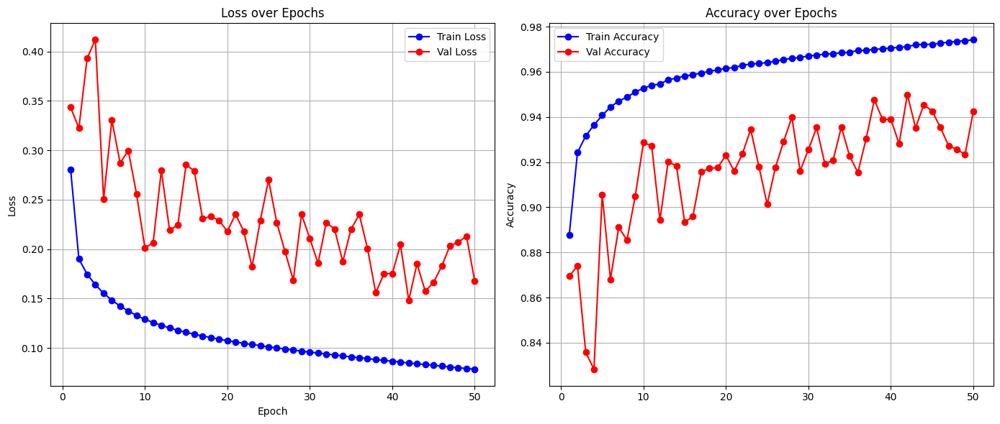

Full model built...
Total execution time: 2494.10 seconds


(0.16780490444458615, 0.9423979964520505)

In [ ]:
embeddings_save_path = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
epochs=50
n_splits=25
fold_idx=2

create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=True, augmentation_factor=2,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name='test',
                                           save_model=False, verbose=False, embeddings_save_path=embeddings_save_path,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx)

#Slight improvement, not significative.
#Starting from 0.005
#Without Junceum accuracy goes to 0.008, without both Junceum and Portula it goes to 0.014
#Loss is constantly increasing so incresing the training length does not help

#without Junceum and Portula, with augmentation x2, it reaches a 0.942 accuracy with diminishing loss!

### Testing Group K Fold without Hyssopifolia

Updating files: 100% (45444/45444), done.
Already on 'clean-barbara'
Your branch is up to date with 'origin/clean-barbara'.
Using device: cuda
BioCLIP 2!


open_clip_config.json:   0%|          | 0.00/534 [00:00<?, ?B/s]

open_clip_model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_junceum')]

📂 Fold 3: 1 validation groups
VALIDATION - Class distribution:

Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1070.28it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1078.64it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1085.89it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1062.61it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1079.20it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1054.67it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1058.00it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1077.04it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1069.61it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1050.34it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1059.70it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1054.88it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1068.45it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1064.94it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1050.31it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1077.18it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 994.39it/s] 



🔁 Epoch 18/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1046.14it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1075.24it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1073.74it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1060.24it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1060.11it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1066.75it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1042.13it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1042.01it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1063.89it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1063.74it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1064.20it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1056.44it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1063.02it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1074.61it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1044.25it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1067.71it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1067.36it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1060.09it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1054.72it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1057.00it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1066.36it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1053.76it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1073.76it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1066.97it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1071.29it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1070.51it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1075.81it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1056.82it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1070.99it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1055.88it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1056.56it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1083.37it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1062.98it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


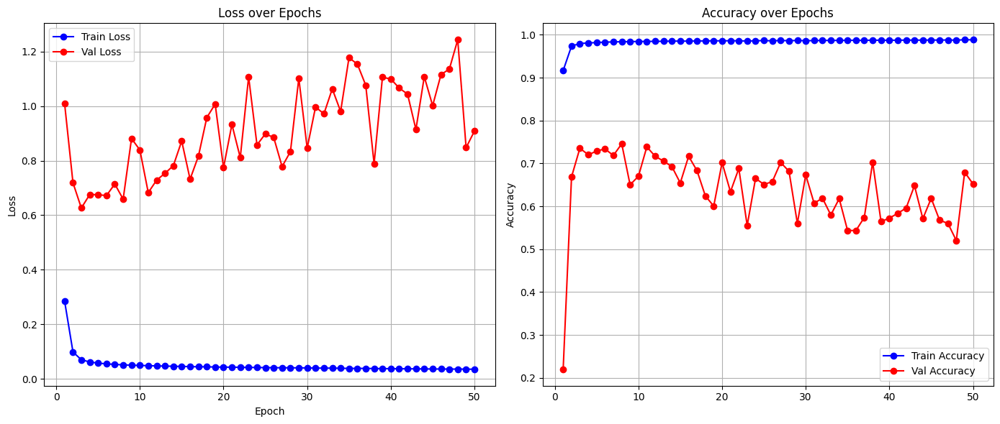

Full model built...
Total execution time: 143.52 seconds
✅ Fold 0 done: Val Loss = 0.9085, Val Acc = 0.6520
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1067.15it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1048.43it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1079.72it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1068.57it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1052.68it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1059.10it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1047.89it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1060.60it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1066.19it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1055.51it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1056.93it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1061.16it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1040.64it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1054.83it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1050.30it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1034.04it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1046.73it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1052.14it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1046.85it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1064.72it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1066.67it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1066.22it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1044.44it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1034.75it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1075.66it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1070.66it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1066.74it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1075.75it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1073.38it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1074.96it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1062.24it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1085.80it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1042.65it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1055.65it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1046.03it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1049.99it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1064.18it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1057.65it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1042.28it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1033.64it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1062.02it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1050.78it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1018.36it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1038.83it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1027.20it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1055.54it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1046.05it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1050.74it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1034.80it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1045.81it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


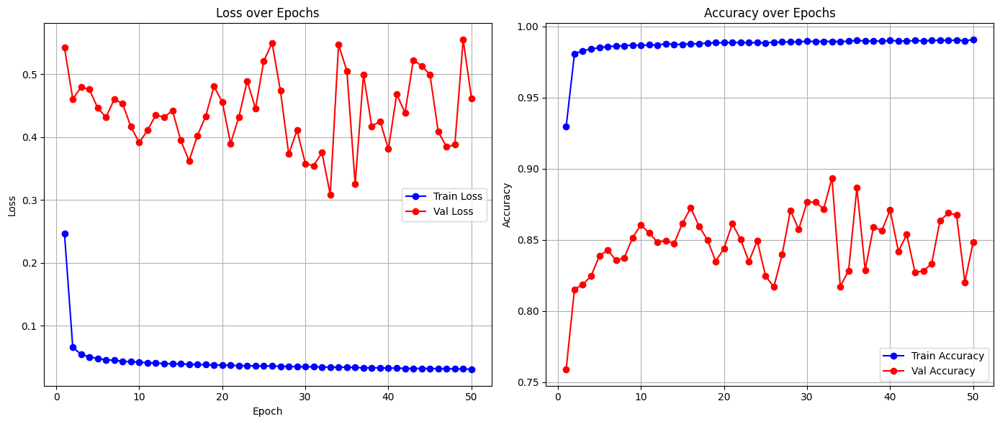

Full model built...
Total execution time: 100.30 seconds
✅ Fold 1 done: Val Loss = 0.4620, Val Acc = 0.8485
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1048.66it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1066.61it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1064.10it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1065.16it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1053.67it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1077.65it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1055.04it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1053.99it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1065.69it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1064.40it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1068.32it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 970.45it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1068.29it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1063.49it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1056.00it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1065.57it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1017.03it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1045.15it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1072.38it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1054.22it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1060.77it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1051.82it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1068.17it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1072.01it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1077.14it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1075.95it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1078.77it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1065.47it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1060.70it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1044.76it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1061.91it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1057.48it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1020.20it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1039.76it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1016.00it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1068.15it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1062.22it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1042.77it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1075.71it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1016.58it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1049.56it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1040.64it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1058.90it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1040.01it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1060.75it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1038.40it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1073.51it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1048.59it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1007.94it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1060.51it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


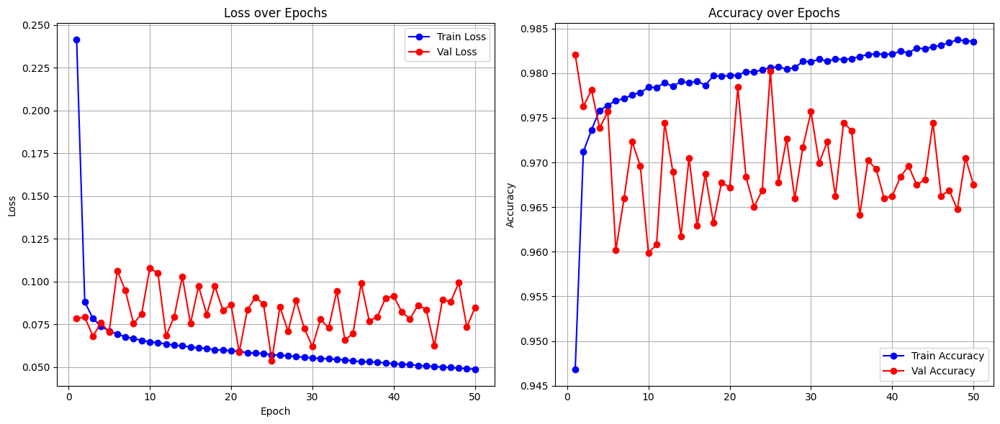

Full model built...
Total execution time: 110.36 seconds
✅ Fold 2 done: Val Loss = 0.0847, Val Acc = 0.9675
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 76/76 [00:00<00:00, 994.80it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1068.69it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1060.55it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1075.20it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1015.28it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1063.26it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1046.70it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 985.38it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1025.98it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1044.95it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1049.51it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1040.98it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1056.65it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1053.18it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1028.19it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1046.34it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1022.85it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1079.15it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1042.04it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1036.89it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 993.92it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1043.99it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1025.01it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1036.60it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1017.24it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1047.02it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1006.87it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1048.95it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1018.82it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1037.68it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1046.54it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1034.48it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1002.20it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1026.17it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 910.89it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1038.78it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1004.66it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1028.25it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1056.34it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1045.71it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 997.77it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1021.03it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1033.12it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1007.04it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1038.16it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1017.02it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1064.43it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1033.54it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1052.09it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1038.52it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


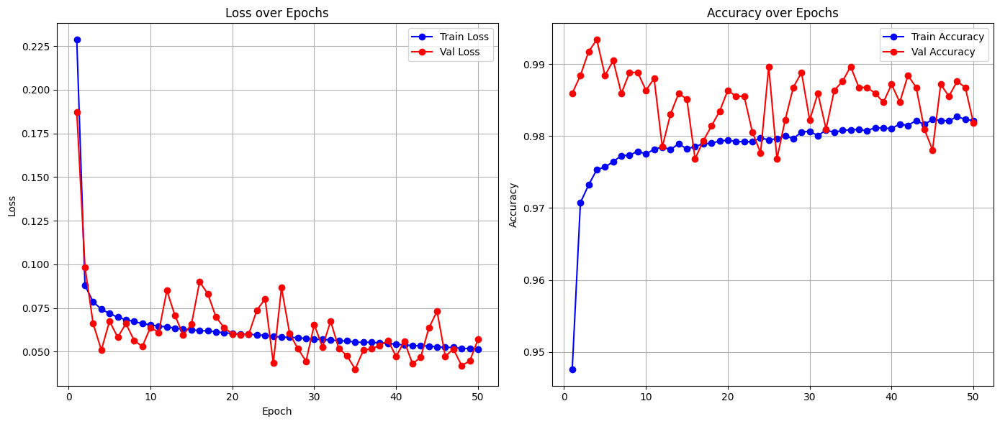

Full model built...
Total execution time: 112.38 seconds
✅ Fold 3 done: Val Loss = 0.0570, Val Acc = 0.9818
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1040.19it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1070.47it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1073.20it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1058.77it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1056.54it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1060.94it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1067.37it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1023.71it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1057.29it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1063.79it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1036.78it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1062.93it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1064.71it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1058.31it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1071.86it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1041.08it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 941.67it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1019.47it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1048.72it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1078.72it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1075.93it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1061.39it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1067.52it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1082.19it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1088.61it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1068.99it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1004.14it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1076.94it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1035.64it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 938.88it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1040.41it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1056.68it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1036.20it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 990.74it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1080.61it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 949.98it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1079.65it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1063.33it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1084.35it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1036.65it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1024.73it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1049.25it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1060.94it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1083.58it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1027.15it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1037.09it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1047.67it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1054.62it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1038.72it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1076.00it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


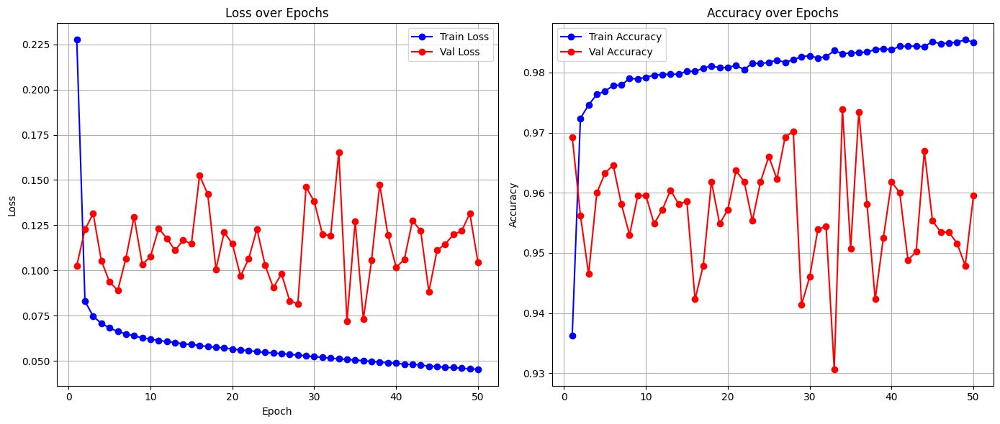

Full model built...
Total execution time: 111.71 seconds
✅ Fold 4 done: Val Loss = 0.1045, Val Acc = 0.9595
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 68/68 [00:00<00:00, 974.20it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1056.15it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1084.04it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1056.10it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1060.38it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1058.48it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1040.04it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1008.12it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1074.84it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1050.09it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1048.37it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1056.52it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1053.92it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1058.00it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1058.08it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1066.22it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1044.46it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1061.98it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1063.02it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1009.61it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1023.83it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1040.16it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1032.15it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1049.20it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 984.10it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1008.66it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1037.04it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 994.77it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1055.61it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1038.76it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1046.22it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 952.25it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1042.91it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 933.79it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1047.58it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1058.50it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1072.09it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1085.00it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1018.31it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 980.93it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1046.97it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 993.64it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1051.89it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 946.26it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1054.49it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 917.95it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1025.65it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 950.08it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1047.46it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1050.31it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


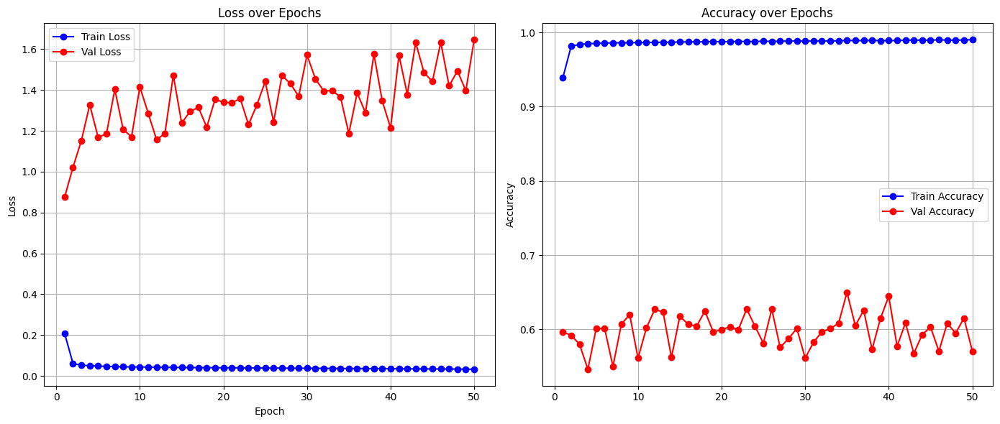

Full model built...
Total execution time: 113.02 seconds
✅ Fold 5 done: Val Loss = 1.6464, Val Acc = 0.5706
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1001.78it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 984.50it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 802.94it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 957.46it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 963.32it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1023.16it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 983.39it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1006.71it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 954.58it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 941.01it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 747.65it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 915.20it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 965.22it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 996.54it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 976.08it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1014.34it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1014.15it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 949.55it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1013.34it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 969.65it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 960.34it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1023.34it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 884.01it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 988.97it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 996.22it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1006.52it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1032.44it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1014.32it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1040.53it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1012.72it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 986.20it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1018.83it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1014.64it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 987.61it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1007.50it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 990.57it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 980.93it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1028.79it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 992.60it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 989.42it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 969.38it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1007.19it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 975.08it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 997.51it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1040.94it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 966.13it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 981.57it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 983.24it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1016.57it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1036.51it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


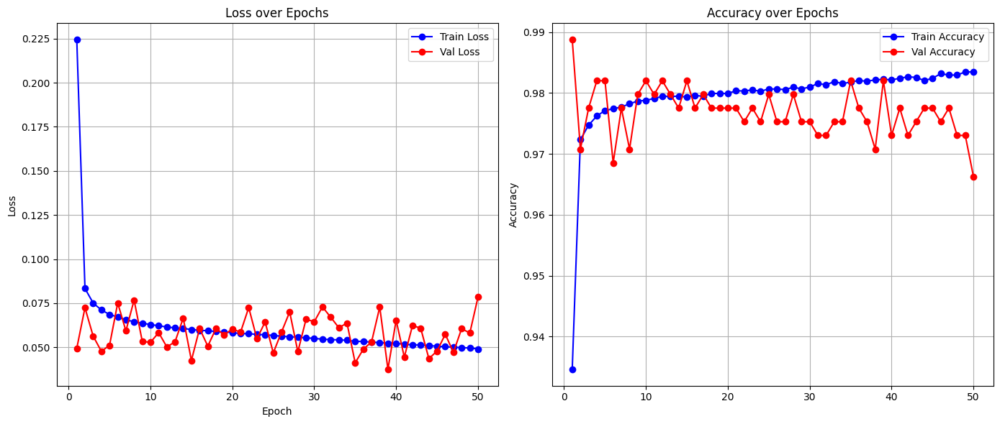

Full model built...
Total execution time: 114.80 seconds
✅ Fold 6 done: Val Loss = 0.0784, Val Acc = 0.9663
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1034.03it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1035.74it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1024.15it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1014.28it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1022.05it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 744.45it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1000.59it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 990.12it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1012.42it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 736.98it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1057.88it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1031.58it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 763.50it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1030.31it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1031.96it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1016.37it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1024.69it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 964.52it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1032.80it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1038.13it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 986.22it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 961.11it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1010.64it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 999.77it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1035.23it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1065.31it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1013.87it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1012.00it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1036.27it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 966.45it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 720.87it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1032.87it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 945.00it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1029.47it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 991.56it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1021.28it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 959.78it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1006.83it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 988.33it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1026.40it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1010.72it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 987.81it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 967.17it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 913.69it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1011.04it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1013.85it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1017.44it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1064.77it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 954.35it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 916.15it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


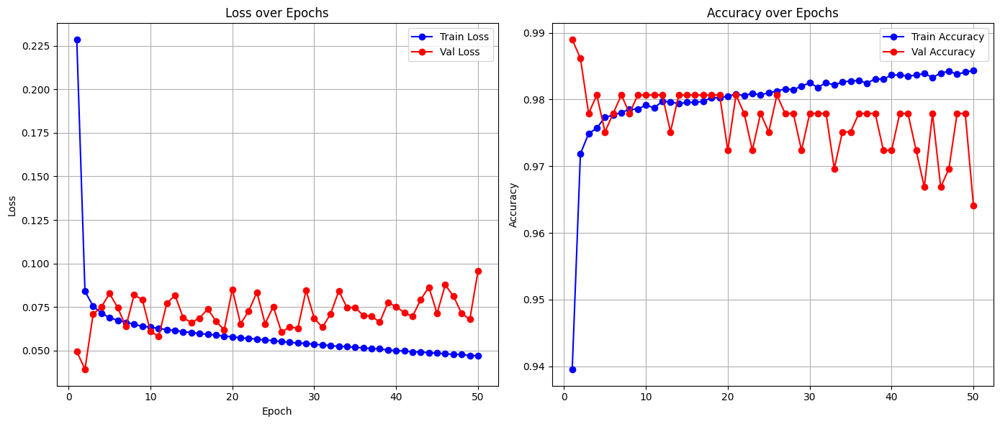

Full model built...
Total execution time: 115.16 seconds
✅ Fold 7 done: Val Loss = 0.0956, Val Acc = 0.9641
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1007.43it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1030.01it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1030.40it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1025.62it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1020.40it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 982.21it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 845.84it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1016.67it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 978.56it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 735.06it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 762.42it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 993.31it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1021.75it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 748.27it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1055.87it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 989.88it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 732.12it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 798.51it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 929.72it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 740.77it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1029.83it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1023.07it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1024.14it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 733.13it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 888.03it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 985.78it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1059.46it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1010.37it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1015.61it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1034.47it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 995.50it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 759.86it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 999.53it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 919.49it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 993.80it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1062.14it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 740.27it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1015.93it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1017.65it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1001.18it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1008.55it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 838.25it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1005.98it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 955.26it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1044.56it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1023.55it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 954.32it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 999.18it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1012.49it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 731.17it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


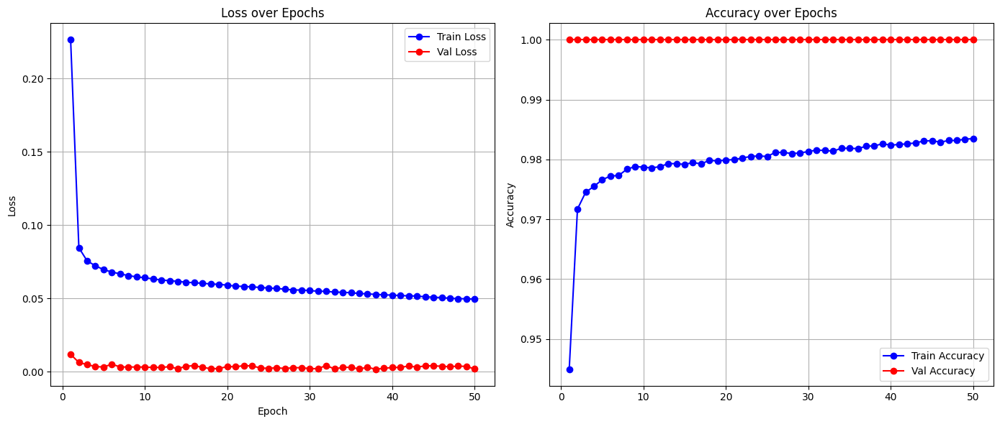

Full model built...
Total execution time: 115.27 seconds
✅ Fold 8 done: Val Loss = 0.0018, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 8/8 [00:00<00:00, 999.06it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 975.53it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1012.05it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 736.54it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 961.45it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1016.77it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 993.00it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1039.77it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 988.09it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1022.00it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 930.21it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1002.52it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1003.30it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 969.14it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 959.71it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1020.39it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1001.21it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 963.63it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 981.15it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 979.52it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 995.12it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 990.16it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1001.27it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 997.72it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 986.46it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 989.08it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1005.44it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1012.20it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1053.22it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 971.89it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1006.61it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 907.20it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 745.01it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1002.13it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 983.71it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1012.57it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 755.00it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 973.69it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1023.84it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1054.54it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 956.78it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1002.13it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 995.00it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 945.04it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 973.13it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 918.65it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1009.37it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1051.73it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 985.47it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 958.67it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


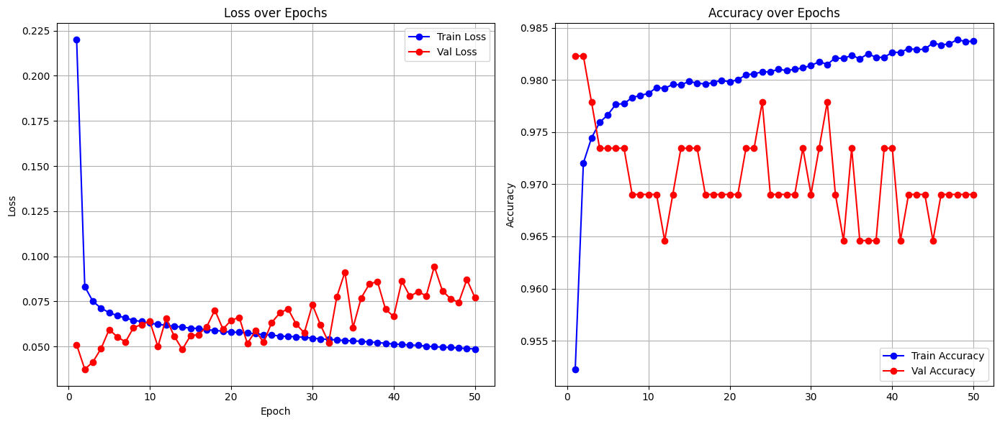

Full model built...
Total execution time: 115.21 seconds
✅ Fold 9 done: Val Loss = 0.0770, Val Acc = 0.9690
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, np

Evaluating: 100%|██████████| 5/5 [00:00<00:00, 758.11it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 920.65it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 958.04it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 894.46it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 961.16it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 893.62it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 689.78it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 915.43it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 914.67it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 889.11it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 917.03it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 935.69it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 872.83it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 905.86it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 839.00it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 876.88it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 680.65it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 667.59it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 948.42it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 959.22it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 696.03it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 910.93it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 962.92it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 860.79it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 925.28it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 993.49it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 937.23it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 893.96it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 895.87it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 911.45it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 692.50it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 842.47it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 932.36it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 941.69it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 968.97it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 885.29it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 891.80it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 892.22it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 898.75it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 825.78it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 863.95it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 923.69it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 929.75it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 899.29it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 890.21it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 938.03it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 736.98it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 936.10it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 903.52it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 896.49it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


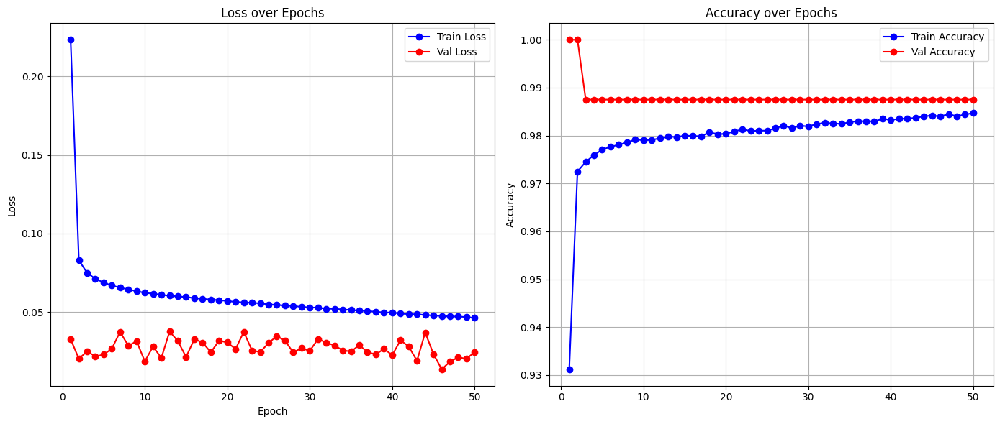

Full model built...
Total execution time: 115.00 seconds
✅ Fold 10 done: Val Loss = 0.0244, Val Acc = 0.9875
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 5/5 [00:00<00:00, 936.27it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 979.11it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 705.02it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 869.18it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 979.93it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 968.66it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 996.27it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 961.91it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 738.98it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 739.68it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 955.94it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 950.01it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 894.19it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 931.36it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 936.56it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 769.15it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 842.40it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 941.82it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 898.68it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 934.02it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 905.70it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 969.06it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 784.83it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 978.24it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 987.41it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 805.88it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 864.34it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 975.28it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 920.05it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 727.27it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 923.73it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 986.01it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 931.57it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 795.10it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 917.67it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 730.36it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 819.62it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 705.61it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 733.68it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 958.87it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 902.89it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 786.13it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 930.17it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 932.86it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 958.17it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 970.14it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 969.83it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 954.12it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 925.36it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 925.81it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


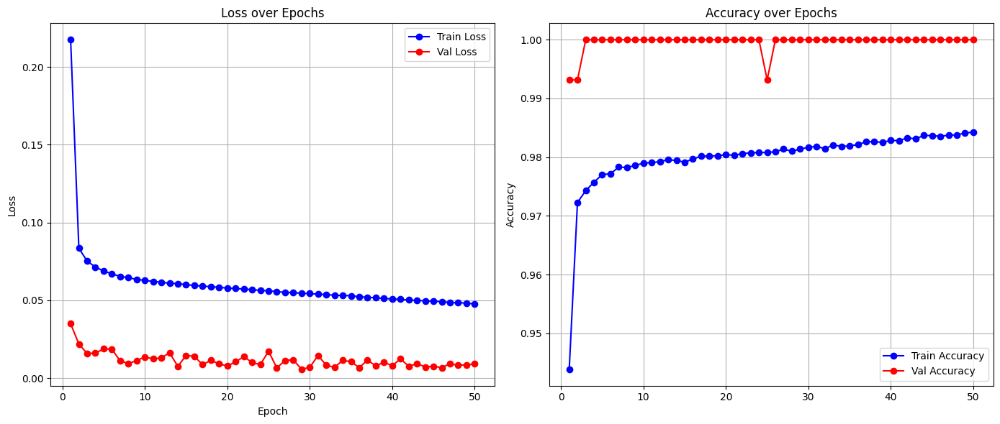

Full model built...
Total execution time: 116.43 seconds
✅ Fold 11 done: Val Loss = 0.0090, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 4/4 [00:00<00:00, 882.31it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 936.33it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 850.81it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 698.29it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 913.05it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 799.11it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 714.56it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 981.30it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 916.29it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 912.15it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 900.74it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 920.36it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 888.95it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 963.16it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 928.82it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 908.40it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 819.64it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 701.42it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 684.45it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 695.63it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 899.05it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 921.12it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 847.03it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 703.42it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 887.59it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 911.56it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 951.57it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 945.51it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 887.12it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 908.84it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 765.45it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 933.57it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 952.66it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 855.11it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 892.79it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 863.69it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 908.64it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 929.85it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 700.45it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 716.94it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 896.79it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 970.96it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 911.76it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 923.91it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 914.34it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 928.25it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 891.84it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 943.44it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 933.99it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 844.39it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


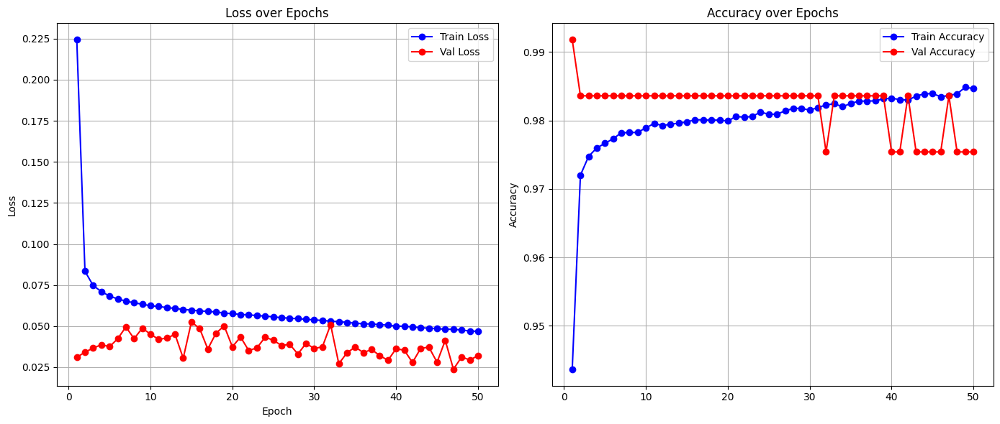

Full model built...
Total execution time: 115.40 seconds
✅ Fold 12 done: Val Loss = 0.0320, Val Acc = 0.9754
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 3/3 [00:00<00:00, 816.54it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 873.45it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 822.25it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 804.07it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 931.31it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 867.85it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 917.46it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 675.88it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 876.19it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 896.15it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 694.65it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 912.93it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 874.18it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 902.84it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 892.53it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 822.74it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 961.19it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 822.36it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 864.69it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 843.36it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 850.77it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 884.19it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 907.40it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 878.27it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 899.68it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 794.83it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 726.08it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 894.50it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 880.72it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 870.37it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 886.62it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 911.01it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 852.21it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 680.16it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 887.31it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 868.39it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 879.92it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 815.54it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 872.36it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 932.76it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 843.13it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 906.68it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 886.81it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 843.75it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 852.44it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 851.12it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 920.54it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 707.82it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 838.64it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 867.55it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


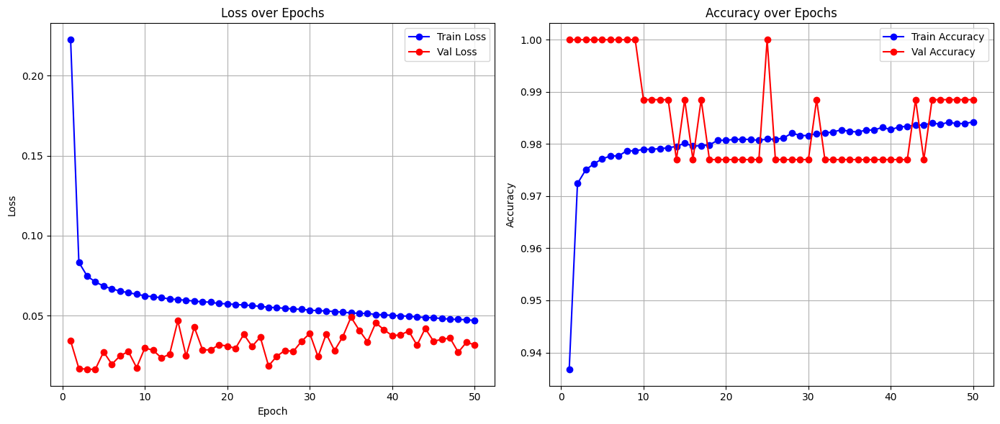

Full model built...
Total execution time: 116.13 seconds
✅ Fold 13 done: Val Loss = 0.0317, Val Acc = 0.9885
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 3/3 [00:00<00:00, 837.13it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 807.22it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 690.23it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 813.22it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 859.20it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 903.36it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 857.20it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 675.19it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 943.67it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 927.74it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 808.20it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 817.34it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 928.56it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 864.75it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 754.37it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 920.81it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 718.08it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 899.81it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 837.97it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 865.16it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 737.78it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 861.90it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 943.03it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 886.50it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 897.11it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 867.31it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 857.96it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 895.64it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 696.19it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 711.62it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 625.95it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 942.26it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 881.40it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 660.76it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 860.37it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 829.19it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 693.92it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 862.02it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 662.01it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 846.71it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 700.10it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 862.32it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 929.93it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 911.28it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 690.76it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 935.39it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 668.73it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 847.33it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 882.02it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 854.99it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


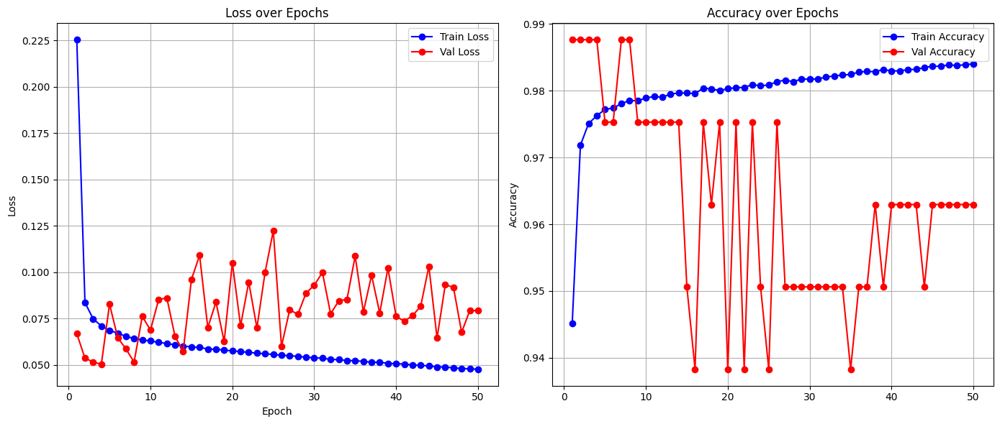

Full model built...
Total execution time: 116.07 seconds
✅ Fold 14 done: Val Loss = 0.0792, Val Acc = 0.9630
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 755.53it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 662.50it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 843.25it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 650.94it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 809.32it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 720.49it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 783.18it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 659.59it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 732.25it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 769.10it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 771.58it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 841.72it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 703.98it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 813.64it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 700.51it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 803.04it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 810.18it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 839.36it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 832.78it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 773.00it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 882.08it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 697.13it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 853.80it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 627.37it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 680.95it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 798.31it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 712.53it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 816.81it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 849.74it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 809.09it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 880.60it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 825.00it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 857.38it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 782.74it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 818.40it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 657.36it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 728.68it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 782.37it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 767.55it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 705.52it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 648.57it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 898.52it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 804.66it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 805.90it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 738.63it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 787.66it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 765.45it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 692.93it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 894.21it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 826.14it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


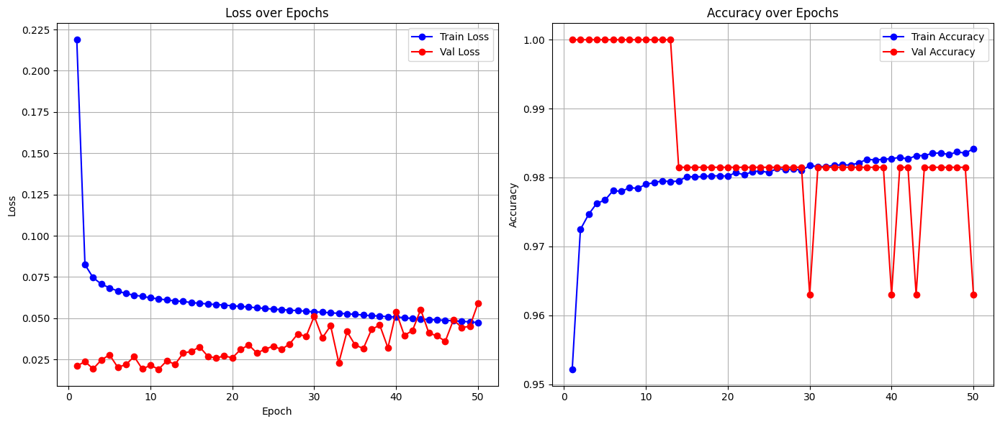

Full model built...
Total execution time: 116.87 seconds
✅ Fold 15 done: Val Loss = 0.0591, Val Acc = 0.9630
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 870.46it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 894.88it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 899.68it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 820.72it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 477.00it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 899.58it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 923.96it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 847.68it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 693.16it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 878.57it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 1000.43it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 940.43it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 851.20it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 936.02it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 916.29it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 901.71it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 761.42it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 786.33it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 897.47it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 872.99it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 777.51it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 956.84it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 823.06it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 746.58it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 935.60it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 956.40it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 712.77it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 957.71it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 966.21it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 882.27it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 804.51it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 593.76it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 938.11it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 904.92it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 697.66it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 985.62it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 778.60it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 885.34it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 903.07it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 794.60it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 715.14it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 687.87it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 817.05it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 839.36it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 901.32it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 896.22it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 760.04it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 866.50it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 848.11it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 899.10it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


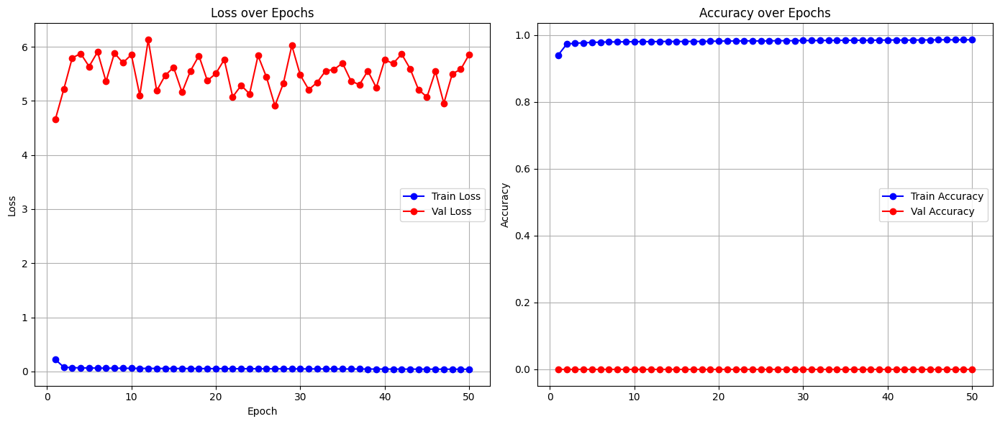

Full model built...
Total execution time: 115.98 seconds
✅ Fold 16 done: Val Loss = 5.8595, Val Acc = 0.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 604.54it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 635.89it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.33it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.45it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.61it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.15it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.66it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 616.81it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.10it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.34it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 732.50it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 585.47it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 610.08it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.91it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.14it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.57it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 662.40it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.59it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 557.31it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 598.25it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 679.13it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 630.63it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 559.99it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 622.39it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 592.67it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 746.85it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 722.41it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 612.66it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 668.10it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 605.94it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 621.75it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.94it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.51it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 572.05it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.58it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 688.72it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 548.78it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.06it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.69it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 638.69it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 763.71it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 515.71it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 603.67it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 635.31it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.73it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.06it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 577.73it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 657.00it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.81it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.86it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


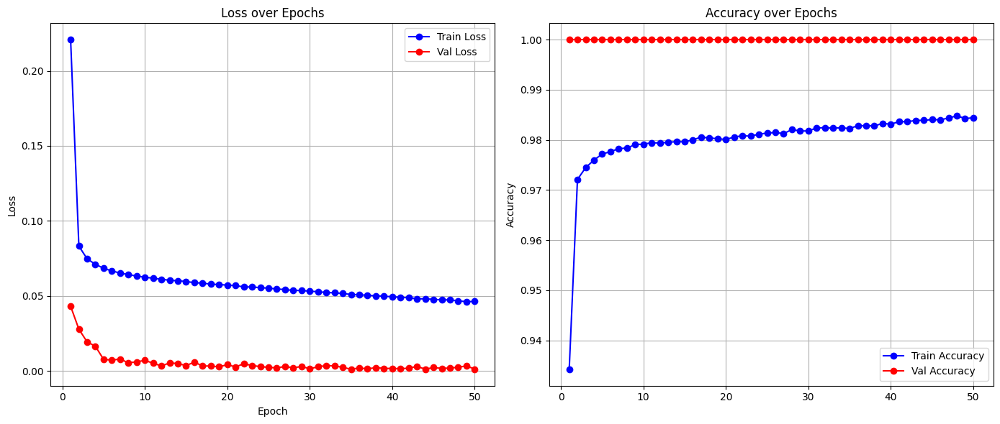

Full model built...
Total execution time: 116.62 seconds
✅ Fold 17 done: Val Loss = 0.0012, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 701.04it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 672.16it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.41it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 652.91it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.22it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 509.33it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 820.64it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.41it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 614.37it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.28it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.73it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.78it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 598.84it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.73it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 549.86it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 570.89it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.02it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.03it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 652.71it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 646.07it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 699.87it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 699.98it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.55it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.82it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.81it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 624.52it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.86it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.61it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.56it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.99it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 847.51it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 763.99it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 752.34it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 629.96it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 823.70it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.46it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.82it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 618.36it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 381.65it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.87it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.80it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 606.03it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.41it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.23it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 664.92it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.36it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.75it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.09it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.78it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 697.54it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


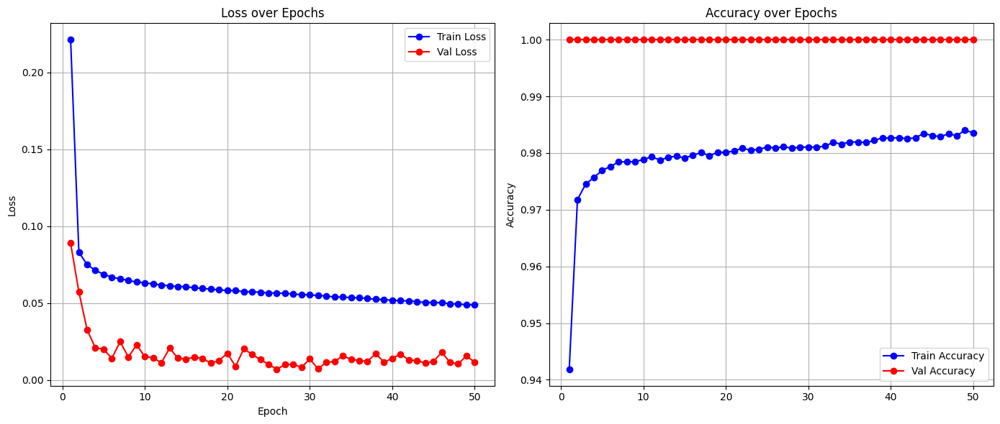

Full model built...
Total execution time: 116.07 seconds
✅ Fold 18 done: Val Loss = 0.0114, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 592.92it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.19it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 618.54it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 608.84it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.81it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 632.15it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 630.06it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.55it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.92it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.54it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 693.85it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 626.58it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 615.27it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 744.99it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 664.60it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.21it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 616.36it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 668.63it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 706.59it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 648.57it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 565.96it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.43it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.18it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.11it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.54it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 613.56it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.08it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 584.73it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 627.80it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.57it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 814.11it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.32it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 611.59it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 781.94it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 851.29it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.62it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 682.56it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.46it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 774.57it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 763.57it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.65it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 607.87it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.10it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.65it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.45it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 628.08it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 604.54it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 664.81it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 593.67it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 609.81it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


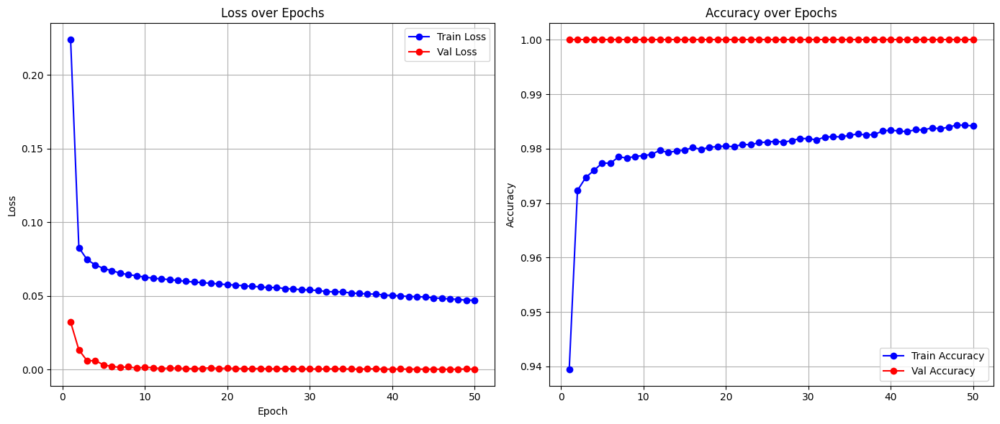

Full model built...
Total execution time: 117.23 seconds
✅ Fold 19 done: Val Loss = 0.0002, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 609.11it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 698.82it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 619.91it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.90it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.62it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 560.06it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 609.99it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 626.67it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 615.27it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 659.17it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 830.56it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 591.83it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 630.72it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 593.93it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.28it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.03it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.49it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.94it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 706.23it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.22it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 627.61it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.53it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 618.99it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 701.98it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 583.43it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.67it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.15it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.05it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 765.94it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.14it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 627.04it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 807.84it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 734.55it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 602.46it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 631.96it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 680.12it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.53it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.48it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.54it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 571.82it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 657.11it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 829.57it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 858.43it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 719.31it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 656.59it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.08it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.34it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.01it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.98it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 549.42it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


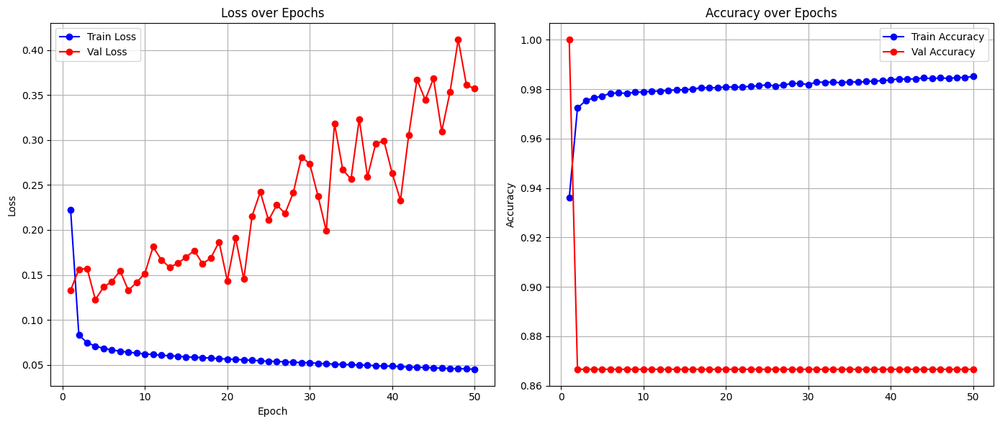

Full model built...
Total execution time: 115.84 seconds
✅ Fold 20 done: Val Loss = 0.3569, Val Acc = 0.8667
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 590.91it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 862.49it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.52it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.46it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 593.51it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.29it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 671.84it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.31it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 638.60it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 734.43it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 532.07it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.10it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.80it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.99it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.76it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 556.64it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 533.42it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 662.40it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.11it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 592.25it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.50it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.10it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 597.48it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.67it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.74it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 528.45it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 550.07it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 776.29it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 575.35it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 722.16it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 615.63it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 670.66it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.56it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.48it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 639.96it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 687.25it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.12it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.05it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 549.35it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.76it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 586.94it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 652.30it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.13it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.25it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 619.63it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 651.09it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.87it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.18it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 730.46it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 615.54it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


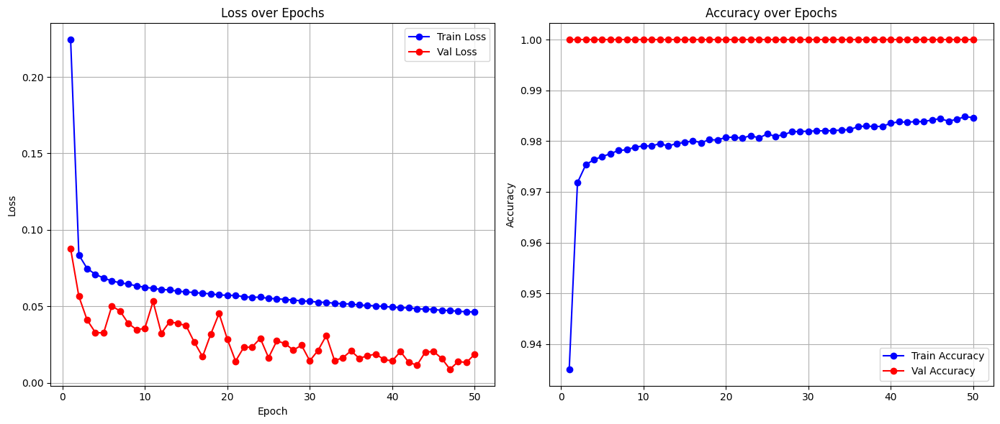

Full model built...
Total execution time: 116.60 seconds
✅ Fold 21 done: Val Loss = 0.0187, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 550.94it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.68it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.83it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.77it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.38it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 609.28it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 549.42it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.65it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 625.08it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 611.50it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 895.84it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 622.30it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 575.82it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 553.85it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 670.98it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 627.33it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.88it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.68it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 771.15it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 584.00it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.61it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.96it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.12it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.50it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.10it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 856.85it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.36it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 692.36it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 680.23it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 617.63it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.08it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.01it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 927.53it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 639.38it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 631.01it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.76it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.01it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 719.19it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.02it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.70it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.98it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 688.95it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.13it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.04it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.00it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.39it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.92it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.05it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.35it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 899.29it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


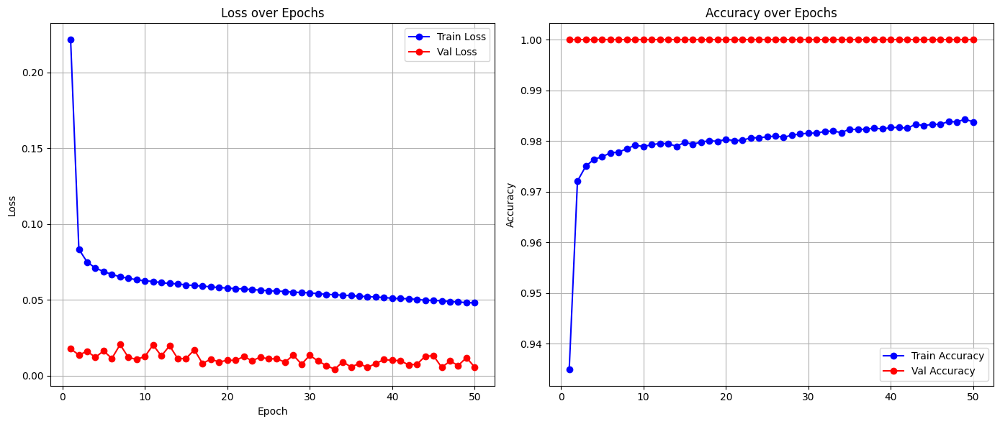

Full model built...
Total execution time: 116.90 seconds
✅ Fold 22 done: Val Loss = 0.0056, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.78it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 943.81it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 579.40it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.23it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.25it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 651.39it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 746.18it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.87it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 670.98it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.03it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 684.00it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.83it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 796.03it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 712.59it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.03it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 504.79it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.36it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.13it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.30it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.92it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.94it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.08it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.56it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.49it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.62it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 551.52it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 611.50it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.38it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.94it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.59it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.82it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.56it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.17it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.74it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.35it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 612.40it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 596.37it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.06it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 631.77it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 630.72it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.68it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.62it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 787.37it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.92it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.46it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 627.33it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 807.53it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 569.11it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 838.69it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 784.72it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


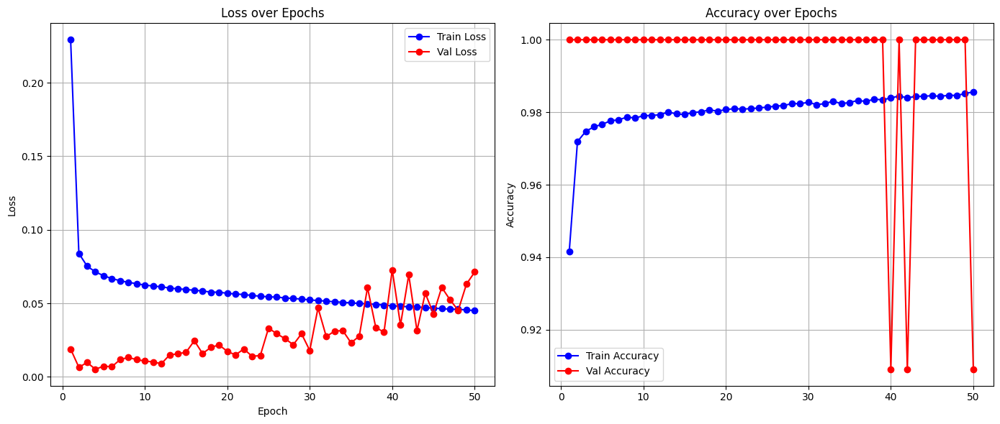

Full model built...
Total execution time: 117.17 seconds
✅ Fold 23 done: Val Loss = 0.0713, Val Acc = 0.9091
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 2145}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 3290}
TRAINING (original) - Class distribution: {np.int64(1): 17238, n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.08it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.04it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.09it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 585.47it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.03it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 899.29it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 774.14it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 772.15it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1011.65it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.42it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 693.16it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 705.99it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.63it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 617.08it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.56it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 682.78it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.02it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.19it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.70it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 831.54it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 622.30it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 839.53it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.05it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.34it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.80it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 908.25it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 809.24it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.10it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.44it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 688.83it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 829.41it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 720.30it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.25it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 744.73it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 671.30it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 552.54it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.58it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.48it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 659.90it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 524.81it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 616.90it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 819.84it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.91it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.33it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 862.85it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.71it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.48it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.24it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.08it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.27it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


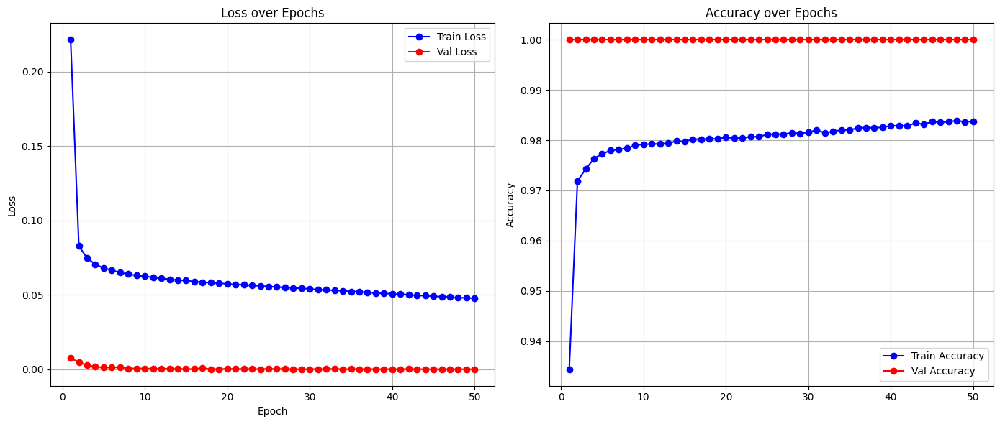

Full model built...
Total execution time: 116.28 seconds
✅ Fold 24 done: Val Loss = 0.0001, Val Acc = 1.0000

📊 Cross-validation results:
Average Validation Loss: 0.4031
Average Validation Accuracy: 0.9013
All Fold Accuracies: [0.651964898893552, 0.8485368411018969, 0.9674772036474164, 0.9817956143980141, 0.9595160539785947, 0.5706293706293706, 0.9662921348314607, 0.9640883977900553, 1.0, 0.9690265486725663, 0.9875, 1.0, 0.9754098360655737, 0.9885057471264368, 0.9629629629629629, 0.9629629629629629, 0.0, 1.0, 1.0, 1.0, 0.8666666666666667, 1.0, 1.0, 0.9090909090909091, 1.0]


In [ ]:
all_val_losses = []
all_val_accuracies = []

remove_species=['lythrum_hyssopifolia']

n_splits = 25

embeddings_save_path_BC2_new = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
model_name_final = 'group_k_fold_new_embeddings'
epochs=50

for fold_idx in range(n_splits):
  val_loss, val_acc = create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=False, augmentation_factor=2,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name=model_name_final,
                                           save_model=False, verbose=False, embeddings_save_path=embeddings_save_path_BC2_new,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx, remove_species=remove_species)
  all_val_losses.append(val_loss)
  all_val_accuracies.append(val_acc)
  print(f"✅ Fold {fold_idx} done: Val Loss = {val_loss:.4f}, Val Acc = {val_acc:.4f}")


mean_loss = sum(all_val_losses) / len(all_val_losses)
mean_acc = sum(all_val_accuracies) / len(all_val_accuracies)

print("\n📊 Cross-validation results:")
print(f"Average Validation Loss: {mean_loss:.4f}")
print(f"Average Validation Accuracy: {mean_acc:.4f}")
print(f"All Fold Accuracies: {all_val_accuracies}")

Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 1418/1418 [18:45<00:00,  1.26it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 39654
📊 Total unique groups: 28
📊 Total augmented samples (filtered): 39654
📊 Augmented class distribution: {np.int64(1): 14821, np.int64(0): 24833}

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 14821, np.int64(0): 11728}
TRAINING (with augmentation) - Class distribution: {np.int64(1): 29642, np.int64(0): 36561}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 4330, np.int64(0): 24833}
TRAINING (with augmentation) - Class distribution: {np.int64(1): 19151, np.int64(0): 49666}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 9583}
TRAINING (original) - Class distri

Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1040.25it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1002.22it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1024.01it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1040.87it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1049.74it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 943.70it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1070.24it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 957.53it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1018.86it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1067.06it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1067.59it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1043.16it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1043.03it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1070.30it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1057.35it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 996.91it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1075.00it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1055.62it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1078.11it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 986.48it/s] 



🔁 Epoch 21/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1056.57it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 976.13it/s] 



🔁 Epoch 23/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1015.60it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1003.96it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1017.93it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1051.14it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1045.64it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1063.80it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1036.65it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1066.37it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1074.10it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1057.90it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1061.37it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1078.26it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 969.56it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1051.64it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1037.82it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1050.52it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1066.72it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1042.52it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1039.42it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1066.98it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 980.72it/s] 



🔁 Epoch 44/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1002.63it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1043.37it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1056.31it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1064.37it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1036.71it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1034.00it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1044.29it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


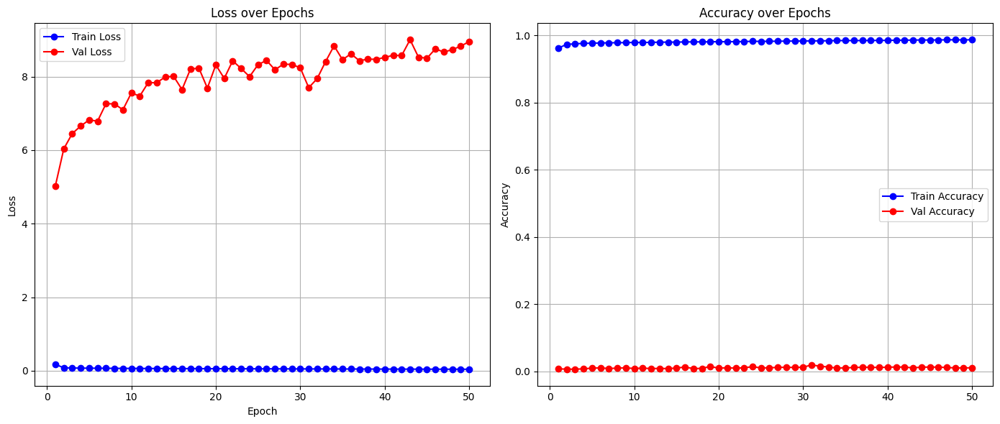

Full model built...
Total execution time: 1333.00 seconds


(8.952324200184052, 0.010539497025983512)

In [ ]:
embeddings_save_path = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
epochs=50
n_splits=25
fold_idx=2
remove_species = ['lythrum_junceum', 'lythrum_portula']

create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=True, augmentation_factor=2,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name='test',
                                           save_model=False, verbose=False, embeddings_save_path=embeddings_save_path,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx,
                                              remove_species=remove_species)

### Experimenting on predictions on Lythrum Salicaria (without Hyssopifolia)

In [ ]:
#Lythrum Salicaria without Hyssopifolia has an accuracy of 0.65 (compared to 0.51 with Hyssopifolia in the training)
#A possible reason for the accuracy being this low (despite not terrible) is the imbalance in the training set, with 20k samples of class "Non-Invasive" and only 2k samples
#of Invasive plants (only Lythrum Virgatum).
#The fact that Lythrum Virgatum embeddings are quite close to Salicaria helps with the prediction accuracy.

#We test what happens when we try to mitigate the imbalance by augmenting the samples for Lythrum Virgatum

Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:52<00:00,  1.29it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1039.47it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1047.10it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1061.56it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1050.64it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1042.52it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1024.13it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1028.91it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1052.36it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1036.34it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1061.25it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1019.59it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1054.89it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1021.67it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1052.11it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1031.23it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1044.29it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1036.47it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1035.42it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1024.36it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 990.74it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1044.74it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1034.82it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1031.93it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1038.21it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1025.60it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1016.41it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1020.46it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1040.80it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1028.61it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1008.61it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1016.65it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 928.63it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1036.45it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1030.68it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1039.63it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1028.90it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1037.99it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 977.22it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1038.97it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1024.34it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1041.62it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1033.48it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 989.25it/s] 



🔁 Epoch 44/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1028.09it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1024.78it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1045.62it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1039.95it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1031.24it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1043.44it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1040.31it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


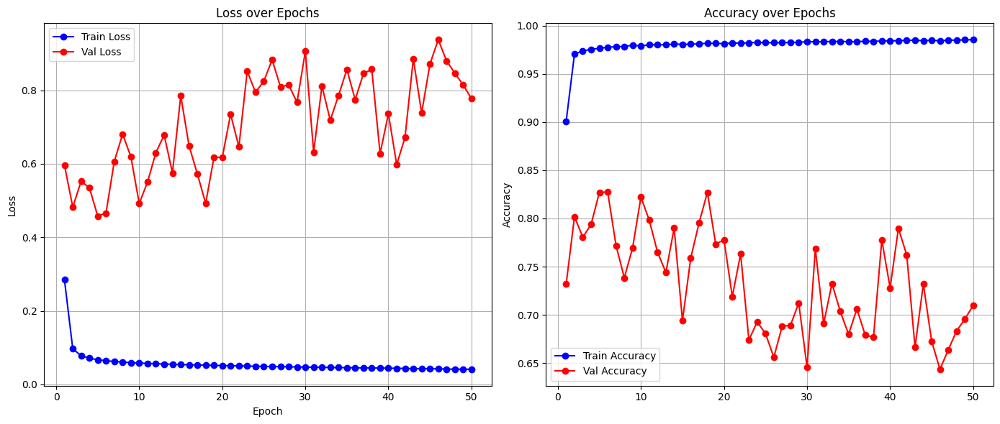

Full model built...
Total execution time: 160.40 seconds


(0.7774929238475492, 0.7097291110263259)

In [ ]:
embeddings_save_path = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
epochs=50
n_splits=25
fold_idx=0
remove_species = ['lythrum_hyssopifolia']

create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=True, augmentation_factor=2,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name='test',
                                           save_model=False, verbose=False, embeddings_save_path=embeddings_save_path,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx, remove_species=remove_species)

#salicaria without hyssopifolia augmenting virgatum x2 : (0.7744535112371885, 0.7128576879053796) (loss, accuracy)
#salicaria without hyssopifolia augmenting virgatum x3 : (0.6239106544962552, 0.7851964898893552)


## **Testing with Hyssopifolia** (with more determinism than before)


Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...
🔍 Inspecting 30-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 45361
📊 Total unique groups: 30

📂 Fold 0: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 13105}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 11728}
Species in validation fold: [np.str_('lythrum_salicaria')]

📂 Fold 1: 1 validation groups
VALIDATION - Class distribution: {np.int64(1): 10491}
TRAINING (original) - Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
Species in validation fold: [np.str_('lythrum_alatum')]

📂 Fold 2: 1 validation groups
VALIDATION - Class distribution: {np.int64(0): 9583}
TRAINING (original) - Class distribution: {np.int64(1): 20528, np.int64(0): 15250}
Species in validation fold: [np.str_('lythrum_hyssopifolia')]

📂 Fold 3: 1 validation gro

Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1126.55it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1102.18it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1133.69it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1125.07it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1138.82it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1127.53it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1133.69it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1137.75it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1133.20it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1148.40it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1142.68it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1124.81it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1098.03it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1128.18it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1118.85it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1125.95it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1132.30it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1105.10it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1126.13it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1125.82it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1130.49it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1129.57it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1134.35it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1121.77it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1132.31it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1135.10it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1111.31it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1127.85it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1138.01it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1129.58it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 29
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


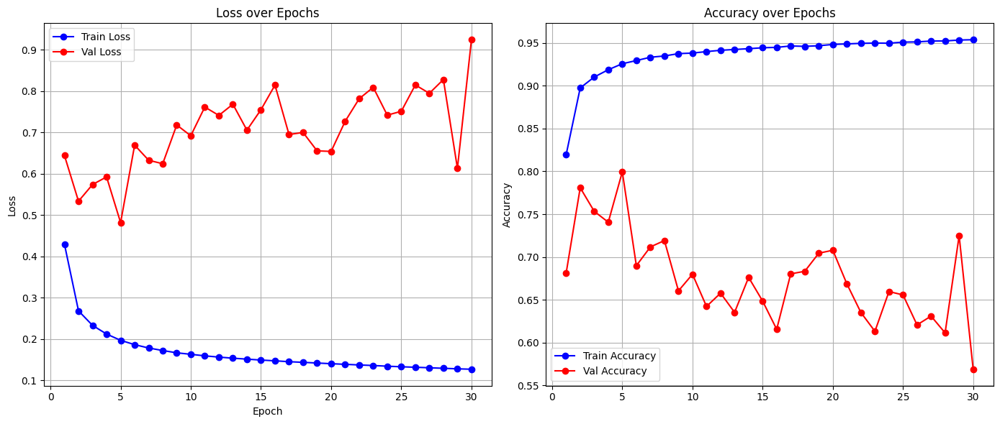

Full model built...
Total execution time: 79.31 seconds
✅ Fold 0 done (lythrum_salicaria): Val Loss = 0.9242, Val Acc = 0.5690
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 1 (lythrum_alatum):
VALIDATION SET:
  Size: 10491
  Class distribution: {np.int64(1): 10491}
  Unique groups: [np.str_('lythrum_alatum')]
TRAINING SET (original):
  Size: 34870
  Class distribution: {np.int64(1): 10037, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'),

Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1130.64it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1145.52it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1130.77it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1128.13it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1110.33it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1143.66it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1126.05it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1125.01it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1144.50it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1115.13it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1126.82it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1139.35it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1130.88it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1127.78it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1142.76it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1133.01it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1140.81it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1134.96it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1133.84it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1135.12it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1134.33it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1133.96it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1130.89it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1127.90it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1134.67it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1133.18it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1109.03it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1124.16it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1084.39it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1113.99it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1125.95it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1129.34it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1120.74it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1129.66it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1143.62it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1134.26it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1134.01it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1125.34it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1119.12it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1128.44it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1122.43it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1126.33it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1120.02it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1129.77it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1123.21it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1139.89it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1139.85it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1075.54it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1113.96it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1139.95it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1125.59it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1127.44it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1125.67it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1111.89it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1127.88it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1126.14it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1125.06it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1114.70it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 57
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


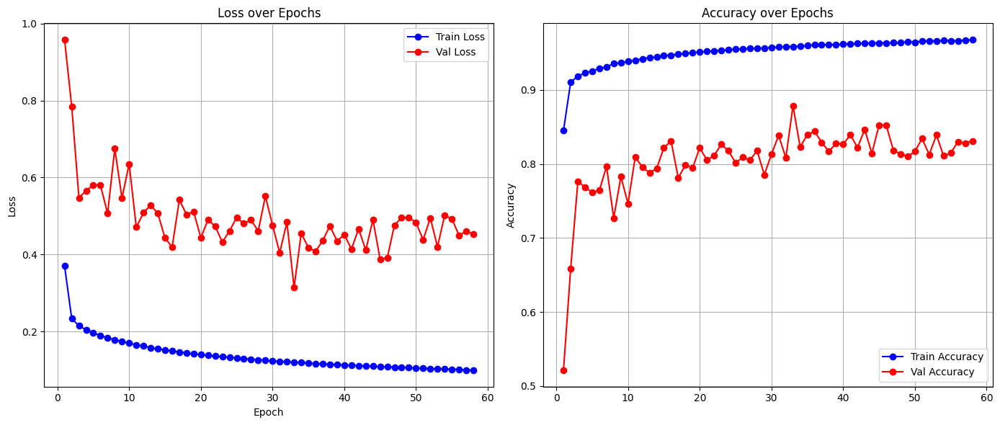

Full model built...
Total execution time: 141.98 seconds
✅ Fold 1 done (lythrum_alatum): Val Loss = 0.4535, Val Acc = 0.8313
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 2 (lythrum_hyssopifolia):
VALIDATION SET:
  Size: 9583
  Class distribution: {np.int64(0): 9583}
  Unique groups: [np.str_('lythrum_hyssopifolia')]
TRAINING SET (original):
  Size: 35778
  Class distribution: {np.int64(1): 20528, np.int64(0): 15250}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'

Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1100.02it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1120.34it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1127.92it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1117.02it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1107.12it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1088.40it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1136.35it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1128.95it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1116.10it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1122.15it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1113.80it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1126.50it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1125.20it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1126.79it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1112.57it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1112.07it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1131.56it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1110.12it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1133.68it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1118.10it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1130.34it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1100.51it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1104.04it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1116.92it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1110.13it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 300/300 [00:00<00:00, 1114.39it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 25
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


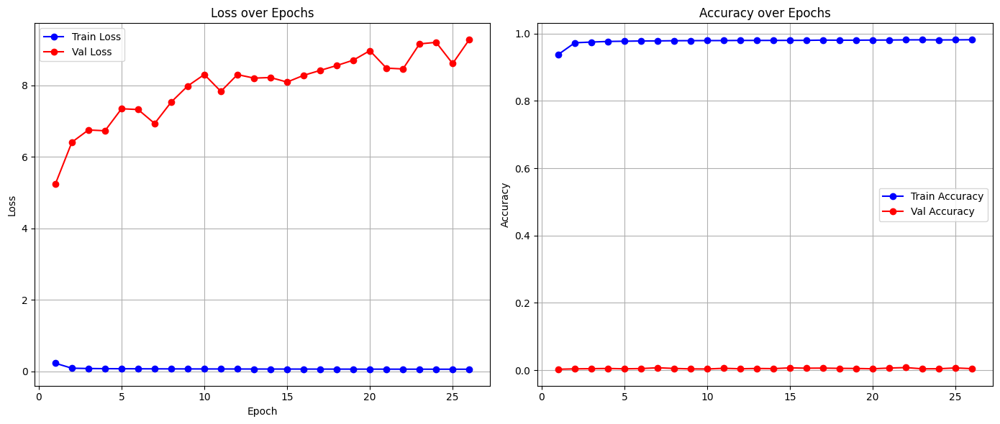

Full model built...
Total execution time: 71.36 seconds
✅ Fold 2 done (lythrum_hyssopifolia): Val Loss = 9.2787, Val Acc = 0.0046
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 3 (lythrum_junceum):
VALIDATION SET:
  Size: 3290
  Class distribution: {np.int64(1): 3290}
  Unique groups: [np.str_('lythrum_junceum')]
TRAINING SET (original):
  Size: 42071
  Class distribution: {np.int64(1): 17238, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_lineare'

Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1110.64it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1100.76it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1140.59it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1119.42it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1124.10it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1125.97it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1126.46it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1079.80it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1125.06it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1118.32it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1143.38it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 978.09it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1132.35it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1119.37it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1115.87it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1123.93it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1076.55it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1128.63it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1120.77it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1116.11it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1112.86it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1133.50it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1154.10it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1111.07it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1137.88it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1096.66it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 25
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


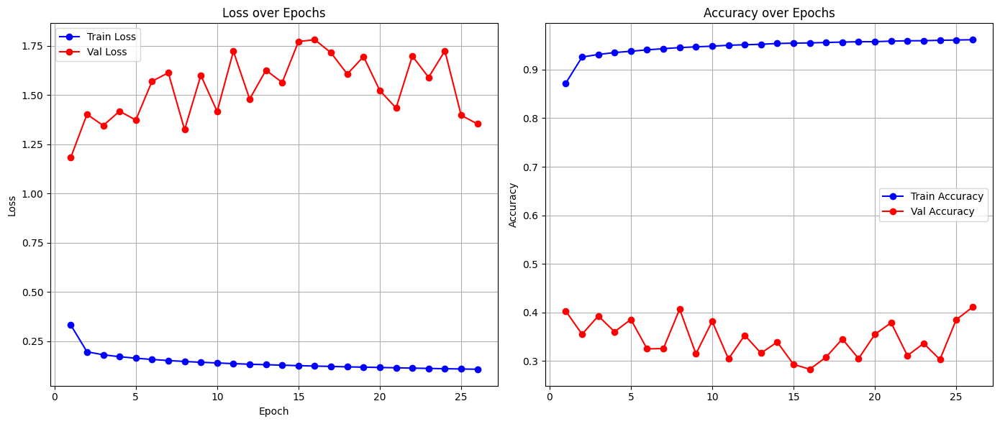

Full model built...
Total execution time: 75.46 seconds
✅ Fold 3 done (lythrum_junceum): Val Loss = 1.3525, Val Acc = 0.4109
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 4 (lythrum_portula):
VALIDATION SET:
  Size: 2417
  Class distribution: {np.int64(1): 2417}
  Unique groups: [np.str_('lythrum_portula')]
TRAINING SET (original):
  Size: 42944
  Class distribution: {np.int64(1): 18111, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np

Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1132.62it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1123.69it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1107.17it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1140.94it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1111.05it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1106.87it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1092.57it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1134.12it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1087.23it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1120.59it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1116.34it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1044.39it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1120.43it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1110.50it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1114.80it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1090.70it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1130.04it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1125.70it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1135.76it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1115.60it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1112.37it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1119.69it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1146.17it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1113.92it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1117.73it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1091.62it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1106.37it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1112.30it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1126.04it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1109.85it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1135.59it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1124.58it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1127.23it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1113.18it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1109.74it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1125.65it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1088.66it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1120.36it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1110.39it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1098.15it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1120.30it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1059.83it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1119.24it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1128.28it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1107.63it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1058.59it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1138.89it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1090.16it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1143.68it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1084.59it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1042.57it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1126.02it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1106.81it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1115.28it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1148.47it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1099.60it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1137.26it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1122.35it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1113.41it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1078.23it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1108.71it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1029.57it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1102.57it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1114.99it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1103.06it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1110.83it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1093.54it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1108.47it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1132.53it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1054.40it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1120.62it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1135.74it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1123.67it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1109.58it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1067.95it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1117.61it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1108.74it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1133.58it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1127.81it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1012.07it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1099.17it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1105.49it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1117.02it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 82
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


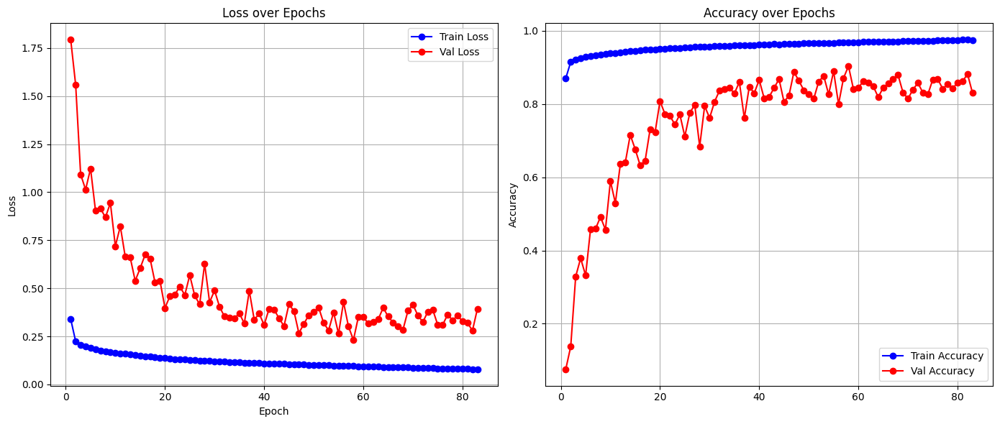

Full model built...
Total execution time: 216.38 seconds
✅ Fold 4 done (lythrum_portula): Val Loss = 0.3936, Val Acc = 0.8304
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 5 (lythrum_californicum):
VALIDATION SET:
  Size: 2149
  Class distribution: {np.int64(1): 2149}
  Unique groups: [np.str_('lythrum_californicum')]
TRAINING SET (original):
  Size: 43212
  Class distribution: {np.int64(1): 18379, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare

Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1117.21it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1034.86it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1117.09it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 998.07it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1122.36it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1046.07it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1115.71it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1136.45it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1136.10it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1137.03it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1068.41it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1135.36it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1119.64it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1121.07it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1134.44it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1032.68it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1127.59it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1134.58it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1143.00it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1109.86it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1141.86it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1147.76it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1142.46it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1120.63it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1111.53it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1134.51it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1089.34it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1130.80it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1128.03it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1129.52it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1123.33it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1131.08it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1113.00it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1065.03it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1095.65it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1064.64it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1095.01it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1123.17it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1083.43it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1119.95it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1108.92it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1130.25it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1130.70it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1129.86it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1136.79it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1113.56it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 993.87it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1057.46it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1097.38it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1113.06it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1121.49it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1073.12it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1117.22it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1110.53it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1138.78it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1123.54it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1131.70it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1130.71it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1074.34it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1118.35it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1100.84it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1107.72it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1128.60it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1128.68it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1130.66it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1071.87it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1138.04it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1117.64it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1106.05it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1112.39it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1098.19it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1125.26it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1134.46it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1123.43it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1131.85it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1091.25it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1105.77it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1139.65it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1135.63it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 78
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


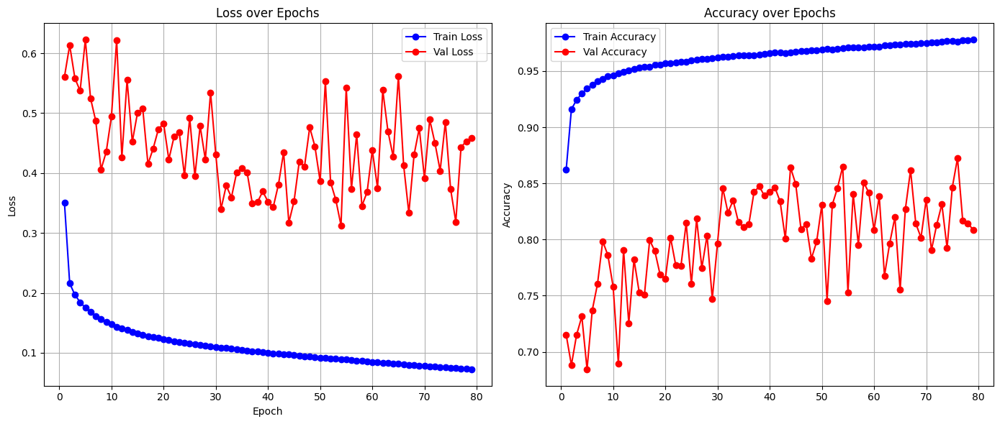

Full model built...
Total execution time: 207.46 seconds
✅ Fold 5 done (lythrum_californicum): Val Loss = 0.4586, Val Acc = 0.8087
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 6 (lythrum_virgatum):
VALIDATION SET:
  Size: 2145
  Class distribution: {np.int64(0): 2145}
  Unique groups: [np.str_('lythrum_virgatum')]
TRAINING SET (original):
  Size: 43216
  Class distribution: {np.int64(1): 20528, np.int64(0): 22688}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junce

Evaluating: 100%|██████████| 68/68 [00:00<00:00, 732.55it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1103.61it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1033.42it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 969.46it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1023.18it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1116.00it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 979.98it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1015.20it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1139.62it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1133.21it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1137.61it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1138.50it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1137.08it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1124.97it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1111.21it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1077.88it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1094.52it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1119.36it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1140.06it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1127.07it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1113.22it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1138.48it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1113.06it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1134.55it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1135.83it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1130.66it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 25
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


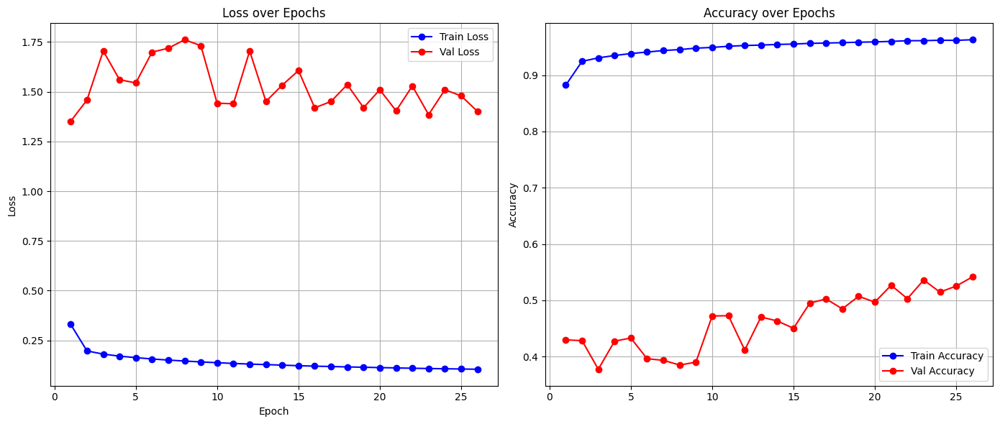

Full model built...
Total execution time: 75.92 seconds
✅ Fold 6 done (lythrum_virgatum): Val Loss = 1.4012, Val Acc = 0.5417
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 7 (lythrum_lineare):
VALIDATION SET:
  Size: 445
  Class distribution: {np.int64(1): 445}
  Unique groups: [np.str_('lythrum_lineare')]
TRAINING SET (original):
  Size: 44916
  Class distribution: {np.int64(1): 20083, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.

Evaluating: 100%|██████████| 14/14 [00:00<00:00, 983.95it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1049.06it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1047.75it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1049.68it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1075.76it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1047.64it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1081.34it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 898.67it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1059.34it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1035.05it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1008.85it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1065.95it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1067.85it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1060.74it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1065.32it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1089.81it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 800.27it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1080.83it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 782.82it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1062.19it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 963.86it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1055.44it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1060.07it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1086.53it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1052.64it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1069.33it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1062.41it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 982.12it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1042.23it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 788.10it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1058.54it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 825.71it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1034.41it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 913.75it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1021.51it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1051.67it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1033.24it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1069.88it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 763.32it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 808.02it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 788.73it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 992.43it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1069.02it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1086.21it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 859.01it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1054.89it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1090.22it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1025.95it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1015.52it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1063.37it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1061.54it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1059.72it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1075.46it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 967.10it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1060.72it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 991.76it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1084.28it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 863.88it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 996.46it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 776.77it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1070.50it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1018.09it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1047.98it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1100.99it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 980.16it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1069.80it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1067.80it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 954.99it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1081.13it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1048.09it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 975.10it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1021.63it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1067.49it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1054.47it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1033.99it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1086.23it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1065.86it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1026.95it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1033.84it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1058.42it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 785.47it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1068.75it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1068.73it/s]



🔁 Epoch 84/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1072.07it/s]



🔁 Epoch 85/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 876.68it/s]



🔁 Epoch 86/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 788.24it/s]



🔁 Epoch 87/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1051.66it/s]



🔁 Epoch 88/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1072.85it/s]



🔁 Epoch 89/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1082.38it/s]



🔁 Epoch 90/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1018.23it/s]



🔁 Epoch 91/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1091.43it/s]



🔁 Epoch 92/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1059.99it/s]



🔁 Epoch 93/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1037.61it/s]



🔁 Epoch 94/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1085.84it/s]



🔁 Epoch 95/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1084.06it/s]



🔁 Epoch 96/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 960.89it/s]



🔁 Epoch 97/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 979.24it/s]



🔁 Epoch 98/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1043.10it/s]



🔁 Epoch 99/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1030.51it/s]



🔁 Epoch 100/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1080.39it/s]



🔁 Epoch 101/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1045.10it/s]



🔁 Epoch 102/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1071.36it/s]



🔁 Epoch 103/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1058.00it/s]



🔁 Epoch 104/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1035.61it/s]



🔁 Epoch 105/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1044.75it/s]



🔁 Epoch 106/200


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 931.23it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 105
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


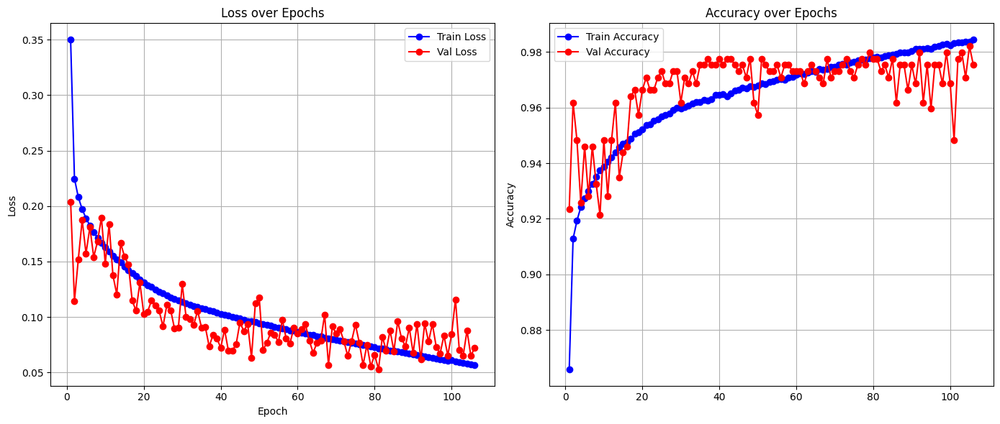

Full model built...
Total execution time: 278.76 seconds
✅ Fold 7 done (lythrum_lineare): Val Loss = 0.0725, Val Acc = 0.9753
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 8 (lythrum_tribracteatum):
VALIDATION SET:
  Size: 362
  Class distribution: {np.int64(1): 362}
  Unique groups: [np.str_('lythrum_tribracteatum')]
TRAINING SET (original):
  Size: 44999
  Class distribution: {np.int64(1): 20166, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_ju

Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1037.77it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 973.95it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1088.18it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 963.71it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1083.26it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 971.65it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1030.29it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1080.66it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1030.12it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1069.34it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 802.43it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1114.69it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1075.00it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 980.36it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 949.53it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 957.13it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1122.17it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1101.61it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1093.43it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1066.53it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 803.42it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1071.16it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1074.22it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1033.93it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1038.02it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1055.55it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1072.19it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1034.16it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1098.56it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1089.10it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1079.45it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1077.83it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1041.57it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1059.08it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1054.82it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1093.33it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1087.29it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1086.58it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1087.45it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1066.35it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 813.20it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 941.50it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1089.45it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1112.99it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1063.85it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1049.78it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 892.29it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1078.44it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1050.55it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1112.15it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 972.48it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1072.44it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 990.08it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1063.49it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1062.59it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1083.99it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1021.98it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 818.37it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1019.42it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1077.19it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 59
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


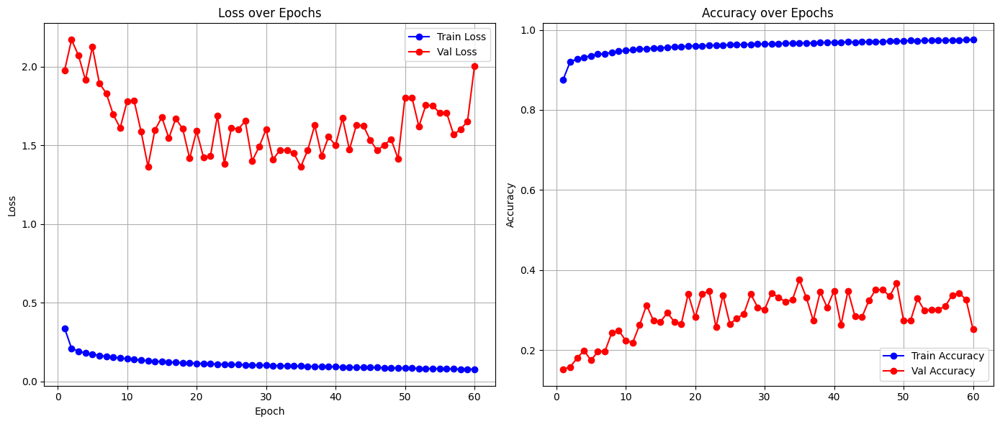

Full model built...
Total execution time: 162.50 seconds
✅ Fold 8 done (lythrum_tribracteatum): Val Loss = 2.0014, Val Acc = 0.2514
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 9 (lythrum_flagellare):
VALIDATION SET:
  Size: 337
  Class distribution: {np.int64(1): 337}
  Unique groups: [np.str_('lythrum_flagellare')]
TRAINING SET (original):
  Size: 45024
  Class distribution: {np.int64(1): 20191, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_linea

Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1068.91it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1062.14it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1083.44it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1058.44it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1075.19it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1107.69it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 948.22it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1087.38it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 879.23it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1080.68it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1076.62it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1064.35it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1075.51it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1060.90it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 798.06it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1092.03it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1079.41it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1099.71it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1024.80it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 962.80it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 959.44it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 932.80it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 992.99it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 957.96it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1071.57it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 959.50it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1071.96it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 26
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


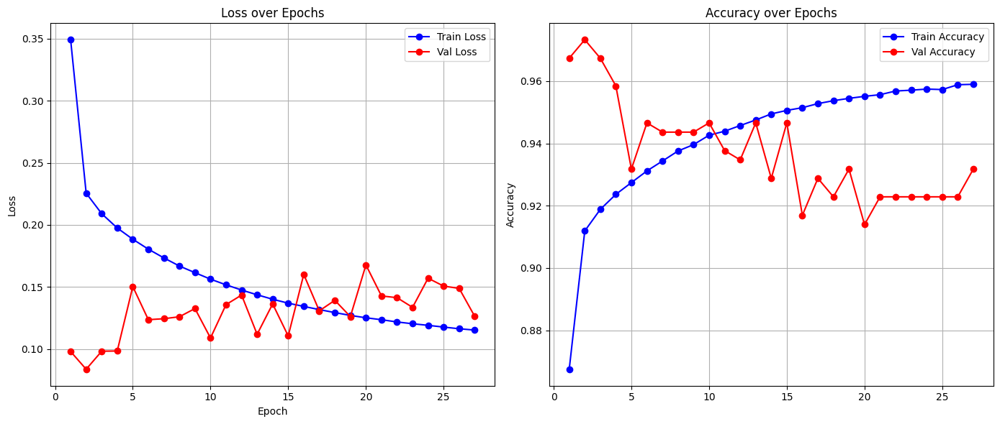

Full model built...
Total execution time: 80.27 seconds
✅ Fold 9 done (lythrum_flagellare): Val Loss = 0.1264, Val Acc = 0.9318
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 10 (lythrum_maritimum):
VALIDATION SET:
  Size: 226
  Class distribution: {np.int64(1): 226}
  Unique groups: [np.str_('lythrum_maritimum')]
TRAINING SET (original):
  Size: 45135
  Class distribution: {np.int64(1): 20302, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum

Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1053.94it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1099.64it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 799.75it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1078.78it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 918.80it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1072.33it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1006.13it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1059.80it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1071.79it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 922.36it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1029.31it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1053.85it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1067.08it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 970.74it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1100.15it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1082.82it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1092.76it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1048.74it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1038.32it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 887.19it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1050.55it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1043.10it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1110.67it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1076.60it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1076.67it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 938.93it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1052.26it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1024.34it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 819.44it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1084.61it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1037.91it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1090.21it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1091.13it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1060.04it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 998.26it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 759.85it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 796.54it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 36
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


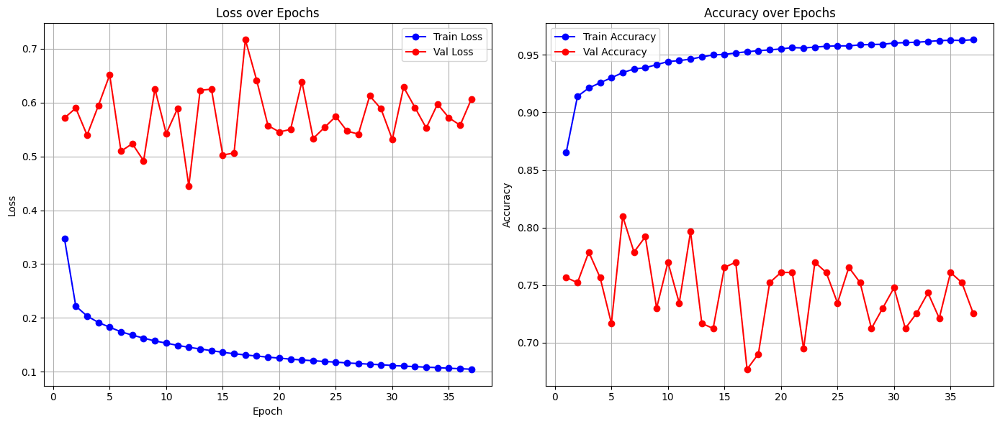

Full model built...
Total execution time: 105.14 seconds
✅ Fold 10 done (lythrum_maritimum): Val Loss = 0.6067, Val Acc = 0.7257
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 11 (lythrum_ovalifolium):
VALIDATION SET:
  Size: 160
  Class distribution: {np.int64(1): 160}
  Unique groups: [np.str_('lythrum_ovalifolium')]
TRAINING SET (original):
  Size: 45201
  Class distribution: {np.int64(1): 20368, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_ju

Evaluating: 100%|██████████| 5/5 [00:00<00:00, 990.20it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 932.19it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 909.04it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 907.11it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 958.04it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 993.11it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 961.78it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 942.50it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 995.66it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 955.34it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 981.26it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 962.66it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 984.76it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 788.79it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 998.55it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 989.74it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 740.91it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 993.06it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 972.16it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1029.23it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 962.35it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 888.28it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 985.74it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 852.78it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 988.80it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 929.92it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1010.48it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 933.85it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 27
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


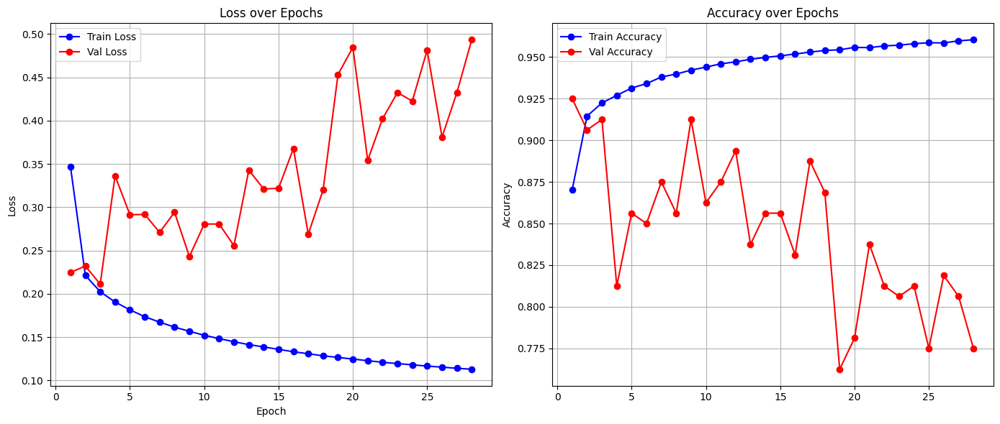

Full model built...
Total execution time: 82.72 seconds
✅ Fold 11 done (lythrum_ovalifolium): Val Loss = 0.4934, Val Acc = 0.7750
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 12 (lythrum_thymifolia):
VALIDATION SET:
  Size: 146
  Class distribution: {np.int64(1): 146}
  Unique groups: [np.str_('lythrum_thymifolia')]
TRAINING SET (original):
  Size: 45215
  Class distribution: {np.int64(1): 20382, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_jun

Evaluating: 100%|██████████| 5/5 [00:00<00:00, 959.84it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1050.62it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1023.95it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 990.72it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 769.06it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 987.45it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1000.93it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1022.75it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 771.55it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1010.09it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 783.75it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 998.22it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 975.06it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 972.84it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 825.62it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 849.36it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1023.90it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 789.35it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 969.60it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 983.10it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1073.98it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 996.08it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 996.70it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 989.83it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 991.23it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 981.31it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 25
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


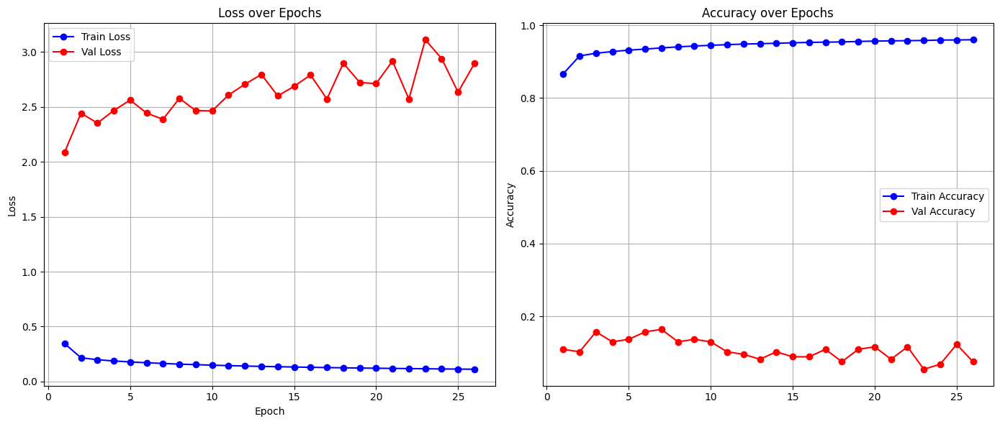

Full model built...
Total execution time: 76.60 seconds
✅ Fold 12 done (lythrum_thymifolia): Val Loss = 2.8934, Val Acc = 0.0753
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 13 (lythrum_gracile):
VALIDATION SET:
  Size: 122
  Class distribution: {np.int64(1): 122}
  Unique groups: [np.str_('lythrum_gracile')]
TRAINING SET (original):
  Size: 45239
  Class distribution: {np.int64(1): 20406, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'),

Evaluating: 100%|██████████| 4/4 [00:00<00:00, 934.82it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 909.78it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 972.93it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 949.31it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 753.83it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 941.91it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 739.44it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 819.36it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 734.84it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 975.76it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 1006.98it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 887.21it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 929.90it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 1013.61it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 969.95it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 922.48it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 1000.79it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 963.65it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 954.28it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 755.46it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 945.14it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 936.28it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 755.87it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 923.30it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 947.97it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 1000.13it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 951.04it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 936.75it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 1005.11it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 883.34it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 987.01it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 995.68it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 786.15it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 770.34it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 965.82it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 870.23it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 917.59it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 945.73it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 948.62it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 953.14it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 976.84it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 1016.31it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 902.68it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 942.01it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 901.86it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 725.56it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 931.34it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 749.85it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 787.03it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 957.11it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 1007.34it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 790.11it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 943.55it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 855.15it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 719.19it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 731.32it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 849.78it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 56
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


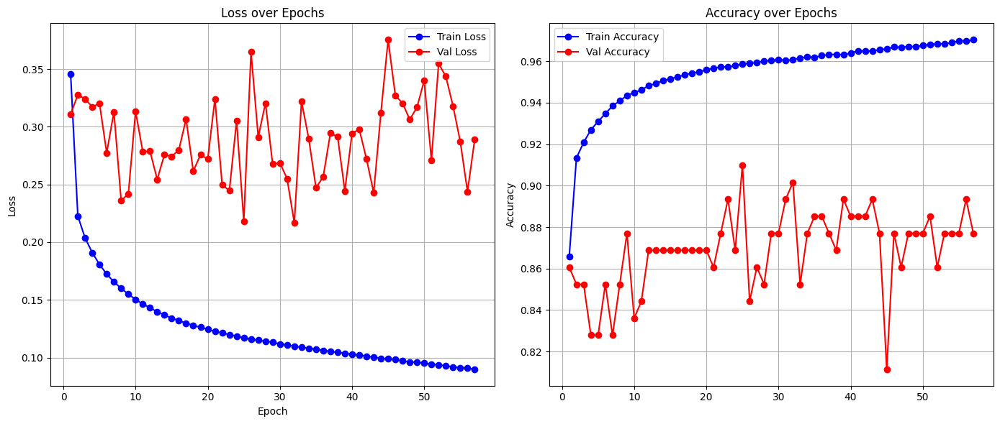

Full model built...
Total execution time: 157.72 seconds
✅ Fold 13 done (lythrum_gracile): Val Loss = 0.2891, Val Acc = 0.8770
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 14 (lythrum_borysthenicum):
VALIDATION SET:
  Size: 87
  Class distribution: {np.int64(1): 87}
  Unique groups: [np.str_('lythrum_borysthenicum')]
TRAINING SET (original):
  Size: 45274
  Class distribution: {np.int64(1): 20441, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'

Evaluating: 100%|██████████| 3/3 [00:00<00:00, 894.12it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 758.14it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 884.69it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 919.20it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 870.37it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 946.58it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 742.92it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 867.31it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 916.59it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 912.00it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 911.67it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 888.00it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 880.54it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 897.24it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 852.33it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 878.51it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 830.12it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 727.63it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 978.30it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 886.25it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 967.99it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 900.39it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 715.22it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 916.32it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 912.47it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 908.97it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 723.03it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 905.83it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 895.58it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 980.97it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 729.95it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 882.76it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 911.01it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 659.52it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 894.75it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 716.65it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 958.92it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 721.79it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 913.79it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 904.59it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 823.92it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 891.14it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 806.96it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 717.06it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 949.15it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 1005.11it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 695.23it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 912.07it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 935.67it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 889.38it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 918.59it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 922.50it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 898.14it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 927.40it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 946.65it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 903.23it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 943.18it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 994.38it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 936.79it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 904.07it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 917.12it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 60
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


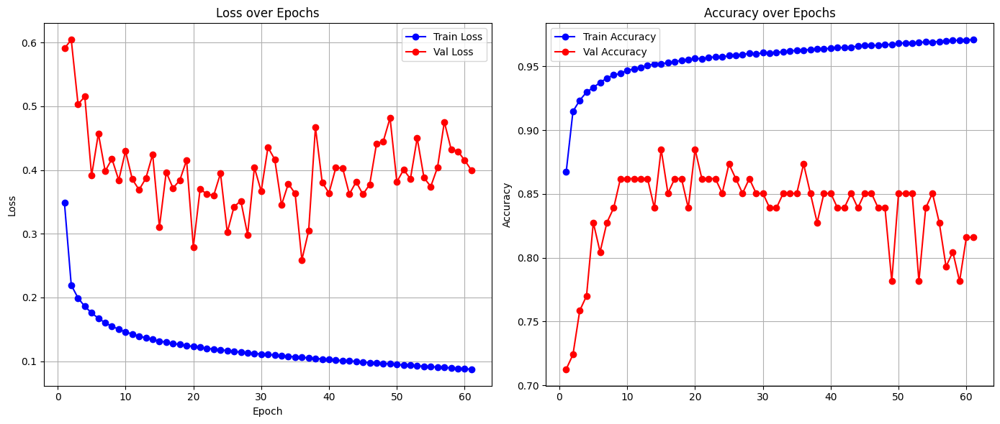

Full model built...
Total execution time: 165.57 seconds
✅ Fold 14 done (lythrum_borysthenicum): Val Loss = 0.3996, Val Acc = 0.8161
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 15 (lythrum_volgense):
VALIDATION SET:
  Size: 81
  Class distribution: {np.int64(1): 81}
  Unique groups: [np.str_('lythrum_volgense')]
TRAINING SET (original):
  Size: 45280
  Class distribution: {np.int64(1): 20447, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceu

Evaluating: 100%|██████████| 3/3 [00:00<00:00, 924.94it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 967.77it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 920.21it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 905.05it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 719.43it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 898.46it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 887.81it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 678.03it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 751.76it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 944.66it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 927.46it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 939.58it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 935.46it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 900.13it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 874.12it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 907.53it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 723.86it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 890.01it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 913.86it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 870.31it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 867.37it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 877.71it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 868.63it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 935.60it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 850.37it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 929.66it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 893.80it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 937.48it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 930.14it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 965.84it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 934.56it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 934.21it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 798.61it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 896.28it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 872.18it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 936.93it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 848.76it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 916.05it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 1053.67it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 964.13it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 835.19it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 950.73it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 1009.05it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 981.89it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 902.32it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 745.83it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 793.67it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 888.50it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 735.97it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 936.02it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 838.64it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 729.95it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 846.08it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 854.06it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 876.19it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 907.33it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 774.00it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 56
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


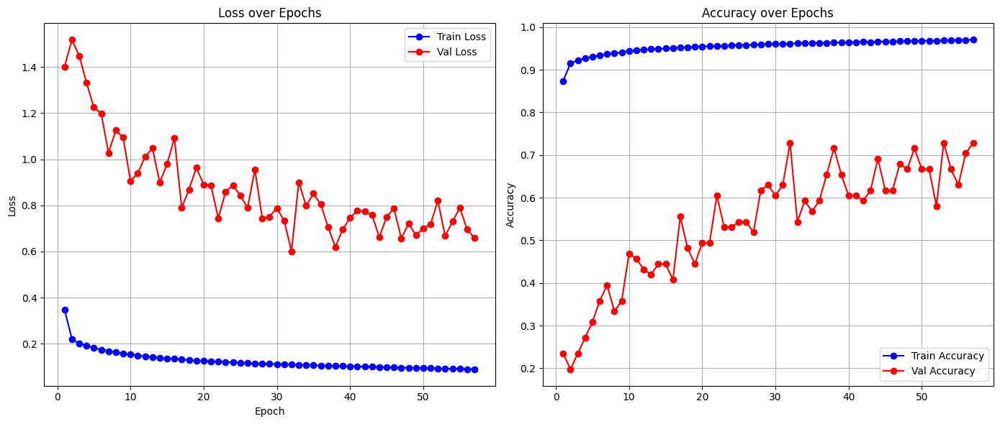

Full model built...
Total execution time: 157.76 seconds
✅ Fold 15 done (lythrum_volgense): Val Loss = 0.6587, Val Acc = 0.7284
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 16 (lythrum_flexuosum):
VALIDATION SET:
  Size: 54
  Class distribution: {np.int64(1): 54}
  Unique groups: [np.str_('lythrum_flexuosum')]
TRAINING SET (original):
  Size: 45307
  Class distribution: {np.int64(1): 20474, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), 

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 1009.82it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 705.46it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 836.52it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 899.00it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 860.72it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 958.70it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 886.65it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 864.00it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 824.27it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 852.76it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 852.59it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 811.98it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 891.36it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 747.85it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 829.82it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 695.98it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 903.17it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 673.89it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 721.79it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 671.14it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 683.61it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 882.83it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 698.53it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 738.04it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 849.74it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 828.34it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 681.95it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 885.62it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 799.91it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 661.46it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 671.46it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 902.87it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 911.31it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 631.01it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 890.13it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 896.89it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 700.33it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 900.94it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 872.72it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 811.36it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 833.20it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 776.36it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 859.05it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 837.77it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 884.41it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 863.29it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 862.58it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 812.77it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 935.60it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 851.38it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 808.93it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 775.14it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 842.23it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 870.37it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 845.80it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 888.34it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 889.00it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 693.10it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 837.86it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 808.54it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 796.11it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 764.76it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 674.27it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 889.09it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 870.46it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 864.45it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 834.44it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 887.12it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 843.16it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 836.94it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 703.57it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 872.09it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 733.98it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 679.57it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 853.37it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 852.41it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 797.32it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 708.56it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 844.01it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 869.38it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 867.22it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 860.37it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 856.24it/s]



🔁 Epoch 84/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 879.40it/s]



🔁 Epoch 85/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 676.99it/s]



🔁 Epoch 86/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 923.04it/s]



🔁 Epoch 87/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 801.43it/s]



🔁 Epoch 88/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 937.80it/s]



🔁 Epoch 89/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 679.73it/s]



🔁 Epoch 90/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 872.27it/s]



🔁 Epoch 91/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 829.16it/s]



🔁 Epoch 92/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 948.08it/s]



🔁 Epoch 93/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 891.74it/s]



🔁 Epoch 94/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 899.49it/s]



🔁 Epoch 95/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 787.59it/s]



🔁 Epoch 96/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 876.00it/s]



🔁 Epoch 97/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 902.49it/s]



🔁 Epoch 98/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 794.15it/s]



🔁 Epoch 99/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 803.81it/s]



🔁 Epoch 100/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 828.42it/s]



🔁 Epoch 101/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 842.82it/s]



🔁 Epoch 102/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 878.02it/s]



🔁 Epoch 103/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 835.77it/s]



🔁 Epoch 104/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 824.27it/s]



🔁 Epoch 105/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 893.74it/s]



🔁 Epoch 106/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 690.48it/s]



🔁 Epoch 107/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 924.47it/s]



🔁 Epoch 108/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 879.68it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 107
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


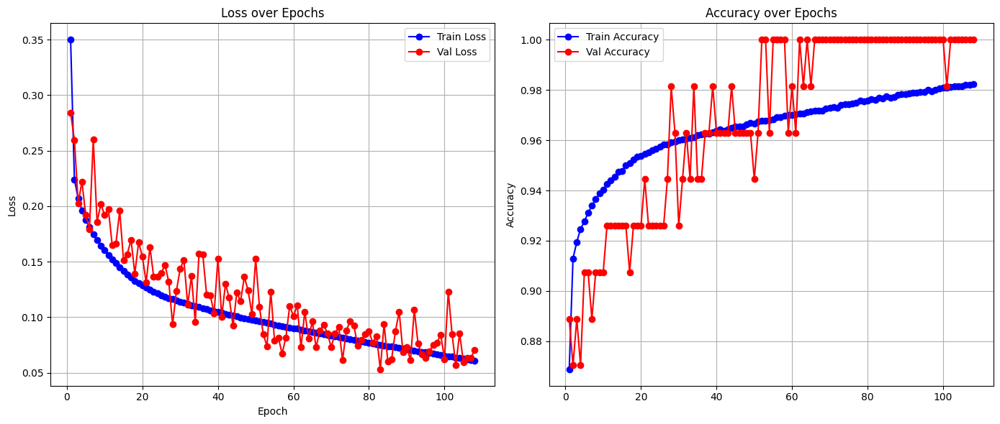

Full model built...
Total execution time: 285.25 seconds
✅ Fold 16 done (lythrum_flexuosum): Val Loss = 0.0707, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 17 (lythrum_intermedium):
VALIDATION SET:
  Size: 33
  Class distribution: {np.int64(1): 33}
  Unique groups: [np.str_('lythrum_intermedium')]
TRAINING SET (original):
  Size: 45328
  Class distribution: {np.int64(1): 20495, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 850.34it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 887.87it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 771.15it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 946.26it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 890.60it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 874.18it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 914.99it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 873.18it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 1031.56it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 880.23it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 739.74it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 830.47it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 693.79it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 875.64it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 925.49it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 759.29it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 875.36it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 716.73it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 999.48it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 906.58it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 880.60it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 1042.71it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 825.33it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 736.04it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 865.25it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 898.14it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 25
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


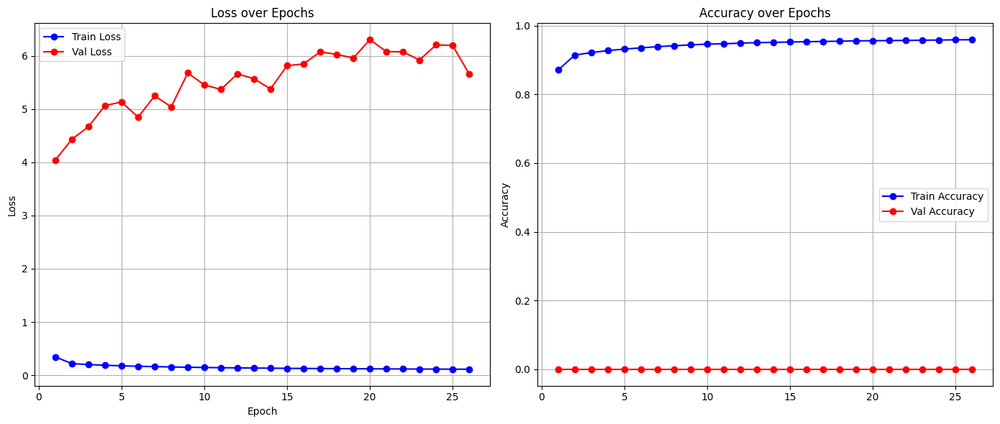

Full model built...
Total execution time: 78.70 seconds
✅ Fold 17 done (lythrum_intermedium): Val Loss = 5.6573, Val Acc = 0.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 18 (lythrum_acutangulum):
VALIDATION SET:
  Size: 24
  Class distribution: {np.int64(1): 24}
  Unique groups: [np.str_('lythrum_acutangulum')]
TRAINING SET (original):
  Size: 45337
  Class distribution: {np.int64(1): 20504, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.66it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.14it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.92it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 652.00it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.99it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.78it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 721.79it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.07it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.64it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.44it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 624.15it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 697.66it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 611.68it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.91it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 632.05it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 808.15it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.29it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 583.51it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.19it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 597.56it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.98it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.00it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 640.74it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.47it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.34it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 632.05it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 545.28it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.17it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 627.33it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 617.81it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 856.33it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.00it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.50it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.38it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.73it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 592.50it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 752.07it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 659.48it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 679.24it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 651.19it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.55it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.94it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.01it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.10it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 693.85it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 590.75it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 616.63it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.12it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.92it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.98it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.65it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 551.01it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.66it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.36it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.62it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.86it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 680.78it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.68it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.52it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.08it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.82it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 774.43it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 644.09it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.53it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.52it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 722.53it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 623.22it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.79it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 680.89it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.05it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 69
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


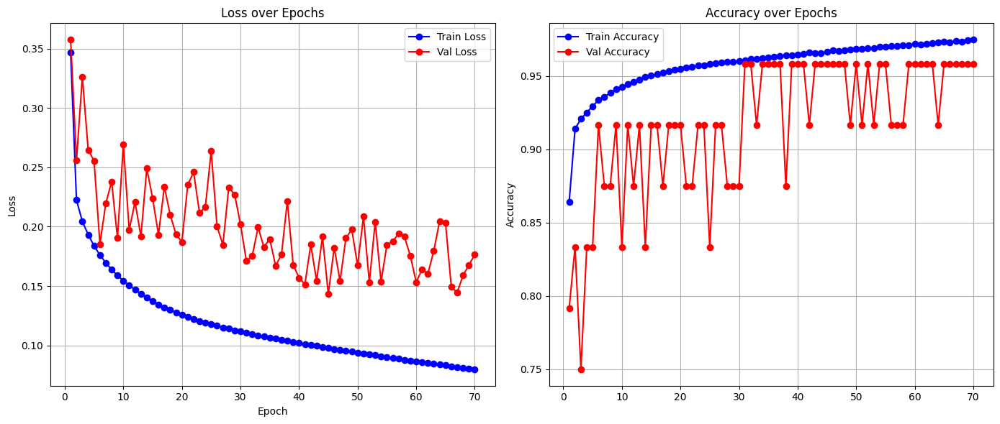

Full model built...
Total execution time: 190.39 seconds
✅ Fold 18 done (lythrum_acutangulum): Val Loss = 0.1764, Val Acc = 0.9583
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 19 (lythrum_vulneraria):
VALIDATION SET:
  Size: 22
  Class distribution: {np.int64(1): 22}
  Unique groups: [np.str_('lythrum_vulneraria')]
TRAINING SET (original):
  Size: 45339
  Class distribution: {np.int64(1): 20506, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junc

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.33it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 587.93it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.03it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 767.77it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.62it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.90it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 696.73it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 535.06it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 774.57it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 830.88it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.97it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.03it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 639.08it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.65it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 636.66it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.36it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.17it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 767.06it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 622.49it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.82it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 635.50it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.55it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 682.22it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.98it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 696.84it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 732.25it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.27it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.58it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 671.73it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 806.13it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 886.00it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.31it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 688.04it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 636.85it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 617.90it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.04it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 712.35it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.37it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 624.99it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 699.75it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.69it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 575.51it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.87it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.30it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 648.87it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.61it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 734.43it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.82it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.96it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.16it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.35it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.16it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.10it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 622.49it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 628.27it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.33it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.56it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.89it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 687.14it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 583.60it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 646.87it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 740.00it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 757.78it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 585.39it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.90it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 614.91it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 632.91it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 698.47it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 638.21it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.18it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 775.57it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.11it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 844.60it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 527.12it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 801.66it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.69it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.10it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.18it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 568.49it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.46it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.78it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 591.16it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.63it/s]



🔁 Epoch 84/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 638.31it/s]



🔁 Epoch 85/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 638.60it/s]



🔁 Epoch 86/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.04it/s]



🔁 Epoch 87/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 646.37it/s]



🔁 Epoch 88/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.73it/s]



🔁 Epoch 89/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 648.37it/s]



🔁 Epoch 90/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.42it/s]



🔁 Epoch 91/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.22it/s]



🔁 Epoch 92/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.29it/s]



🔁 Epoch 93/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 671.41it/s]



🔁 Epoch 94/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 824.03it/s]



🔁 Epoch 95/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.31it/s]



🔁 Epoch 96/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.41it/s]



🔁 Epoch 97/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.03it/s]



🔁 Epoch 98/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 688.15it/s]



🔁 Epoch 99/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.25it/s]



🔁 Epoch 100/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 608.31it/s]



🔁 Epoch 101/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 814.27it/s]



🔁 Epoch 102/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.66it/s]



🔁 Epoch 103/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.99it/s]



🔁 Epoch 104/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.74it/s]



🔁 Epoch 105/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.10it/s]



🔁 Epoch 106/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.05it/s]



🔁 Epoch 107/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 593.00it/s]



🔁 Epoch 108/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.93it/s]



🔁 Epoch 109/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.06it/s]



🔁 Epoch 110/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 614.64it/s]



🔁 Epoch 111/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 659.07it/s]



🔁 Epoch 112/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 762.05it/s]



🔁 Epoch 113/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 729.19it/s]



🔁 Epoch 114/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.00it/s]



🔁 Epoch 115/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.46it/s]



🔁 Epoch 116/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.52it/s]



🔁 Epoch 117/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 573.46it/s]



🔁 Epoch 118/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.52it/s]



🔁 Epoch 119/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.10it/s]



🔁 Epoch 120/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 644.39it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 119
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


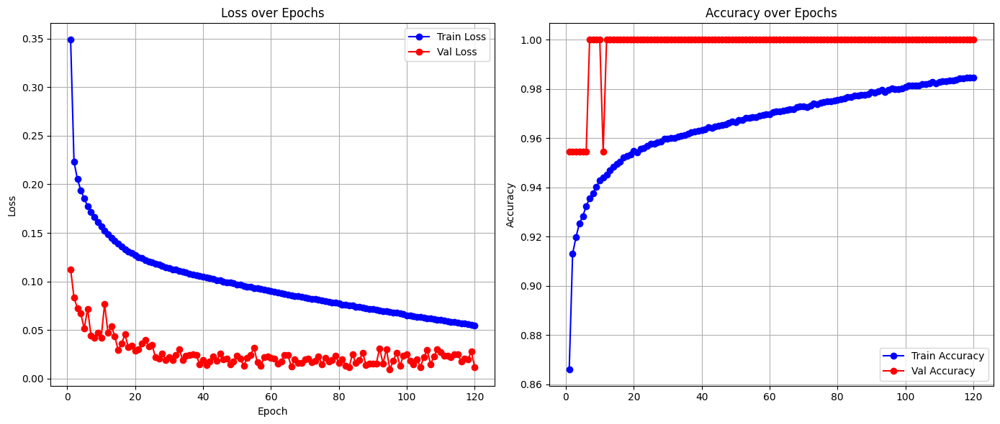

Full model built...
Total execution time: 317.50 seconds
✅ Fold 19 done (lythrum_vulneraria): Val Loss = 0.0114, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 20 (lythrum_album):
VALIDATION SET:
  Size: 18
  Class distribution: {np.int64(1): 18}
  Unique groups: [np.str_('lythrum_album')]
TRAINING SET (original):
  Size: 45343
  Class distribution: {np.int64(1): 20510, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 773.14it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 620.09it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.33it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.11it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.46it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.70it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.07it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 668.84it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 659.07it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.10it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.54it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.17it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.48it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 730.71it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.45it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.78it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 631.58it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.07it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 552.90it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.52it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.02it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.61it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.31it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 606.81it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.78it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 569.49it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.19it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.41it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.74it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.81it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 604.28it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.14it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.97it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 567.87it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.80it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.38it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.18it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 631.86it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.12it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 619.18it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 890.32it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 657.00it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 608.31it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.33it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 527.19it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.62it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 719.06it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 46
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


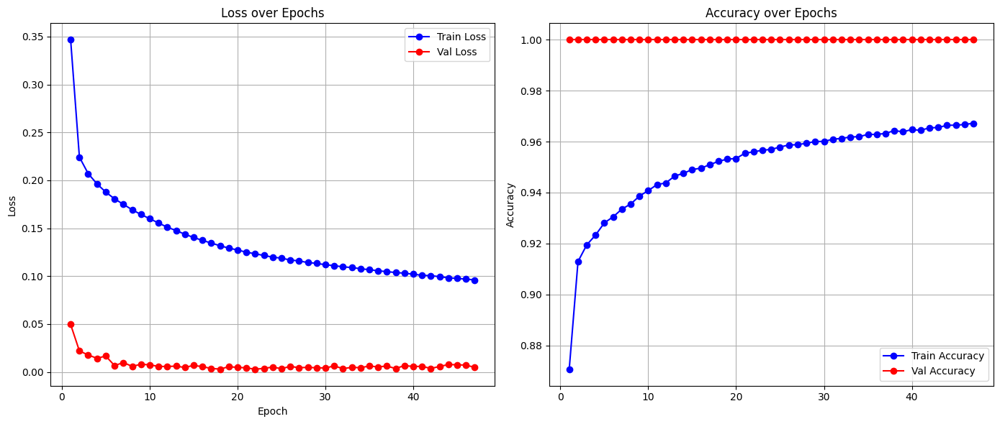

Full model built...
Total execution time: 131.23 seconds
✅ Fold 20 done (lythrum_album): Val Loss = 0.0048, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 21 (lythrum_curtissii):
VALIDATION SET:
  Size: 15
  Class distribution: {np.int64(1): 15}
  Unique groups: [np.str_('lythrum_curtissii')]
TRAINING SET (original):
  Size: 45346
  Class distribution: {np.int64(1): 20513, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np.

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 887.31it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 792.42it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 806.13it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.93it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.93it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.22it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 652.00it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.29it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.91it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 672.38it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 820.80it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 721.54it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 671.30it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 611.06it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.96it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.96it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.21it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 617.17it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 672.16it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 610.08it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 580.77it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.03it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 757.37it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 682.33it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 734.04it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.10it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 705.87it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 802.28it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.85it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 630.34it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 858.08it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 838.53it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.52it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.66it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 538.08it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.02it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 612.13it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.87it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 771.01it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.11it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 762.74it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 651.39it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.15it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.32it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 596.97it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 652.91it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.22it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 46
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


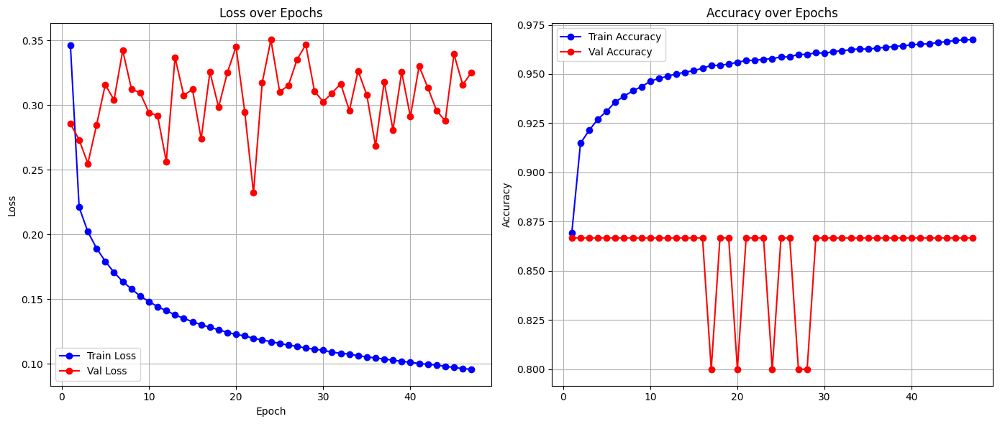

Full model built...
Total execution time: 130.77 seconds
✅ Fold 21 done (lythrum_curtissii): Val Loss = 0.3252, Val Acc = 0.8667
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 22 (lythrum_bryantii):
VALIDATION SET:
  Size: 14
  Class distribution: {np.int64(1): 14}
  Unique groups: [np.str_('lythrum_bryantii')]
TRAINING SET (original):
  Size: 45347
  Class distribution: {np.int64(1): 20514, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), 

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 658.55it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.65it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.73it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.34it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 834.02it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.97it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.59it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 679.79it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.73it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 780.63it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.65it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 684.56it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.52it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.57it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.97it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.09it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.64it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.34it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 721.04it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.10it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.96it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.07it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.26it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.83it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.14it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 766.92it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 792.42it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 952.17it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.22it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.30it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 834.36it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 792.57it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 948.51it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 699.63it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.62it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.02it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 575.43it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.98it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 772.29it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.18it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 730.59it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.67it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.03it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.29it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.59it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.50it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 706.59it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.48it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.04it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.28it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.61it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 856.16it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 813.64it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.56it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.70it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.62it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.46it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.35it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 830.72it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.35it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 766.78it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 680.45it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.01it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.39it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.77it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 706.71it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 799.07it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.99it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.02it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.88it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.76it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 818.24it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.23it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.68it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 831.54it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.48it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 808.62it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.34it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 670.34it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 812.22it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 751.40it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 648.57it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 838.36it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 82
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


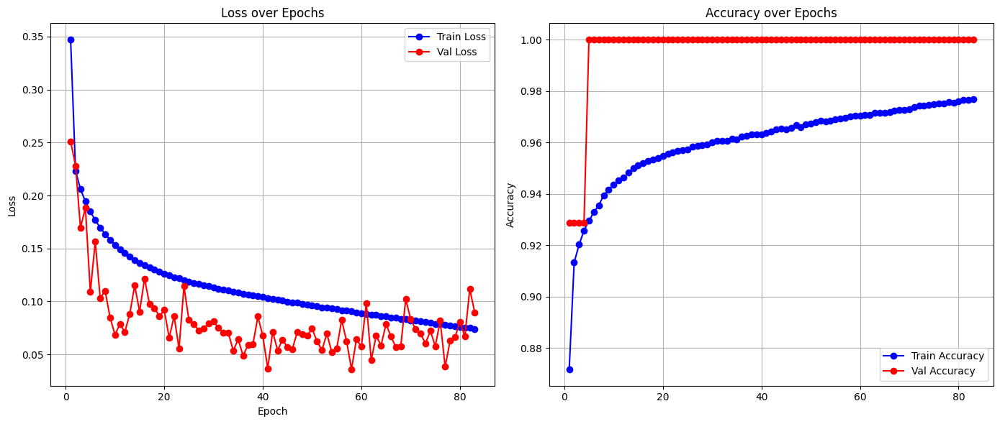

Full model built...
Total execution time: 223.72 seconds
✅ Fold 22 done (lythrum_bryantii): Val Loss = 0.0896, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 23 (lythrum_rotundifolium):
VALIDATION SET:
  Size: 14
  Class distribution: {np.int64(1): 14}
  Unique groups: [np.str_('lythrum_rotundifolium')]
TRAINING SET (original):
  Size: 45347
  Class distribution: {np.int64(1): 20514, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_j

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.74it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 607.43it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.28it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 744.33it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 809.55it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 952.39it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 813.64it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.29it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.63it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 778.89it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.93it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 823.22it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 819.84it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 812.53it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 812.38it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.58it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 819.20it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.50it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 699.63it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.59it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.42it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 594.09it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 921.02it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.73it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 662.92it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.42it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.53it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.04it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 732.89it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 639.47it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 867.49it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.30it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 765.38it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.71it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.10it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 788.55it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.88it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.43it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.45it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.08it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.20it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 793.77it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.96it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 775.72it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.36it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.03it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.78it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.93it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 873.45it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 837.35it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 785.74it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.80it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.19it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.81it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 781.21it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 582.54it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 831.05it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.04it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 659.48it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.03it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 773.57it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 698.35it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 899.10it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.63it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.44it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.15it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.03it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.65it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.30it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.13it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.05it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.71it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.91it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 802.43it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.57it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 772.01it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.80it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.22it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.08it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.45it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.67it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 912.00it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 795.88it/s]



🔁 Epoch 84/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.34it/s]



🔁 Epoch 85/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 793.92it/s]



🔁 Epoch 86/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 825.49it/s]



🔁 Epoch 87/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 656.39it/s]



🔁 Epoch 88/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 593.00it/s]



🔁 Epoch 89/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 863.56it/s]



🔁 Epoch 90/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 802.12it/s]



🔁 Epoch 91/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 773.14it/s]



🔁 Epoch 92/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.77it/s]



🔁 Epoch 93/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 888.81it/s]



🔁 Epoch 94/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 886.18it/s]



🔁 Epoch 95/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.88it/s]



🔁 Epoch 96/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.89it/s]



🔁 Epoch 97/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.46it/s]



🔁 Epoch 98/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 773.71it/s]



🔁 Epoch 99/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.48it/s]



🔁 Epoch 100/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 698.00it/s]



🔁 Epoch 101/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.75it/s]



🔁 Epoch 102/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 729.70it/s]



🔁 Epoch 103/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 628.93it/s]



🔁 Epoch 104/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.33it/s]



🔁 Epoch 105/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.25it/s]



🔁 Epoch 106/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.26it/s]



🔁 Epoch 107/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.20it/s]



🔁 Epoch 108/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 701.51it/s]



🔁 Epoch 109/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 772.86it/s]



🔁 Epoch 110/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 611.68it/s]



🔁 Epoch 111/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.81it/s]



🔁 Epoch 112/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.59it/s]



🔁 Epoch 113/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.15it/s]



🔁 Epoch 114/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 890.13it/s]



🔁 Epoch 115/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.34it/s]



🔁 Epoch 116/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.41it/s]



🔁 Epoch 117/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 788.11it/s]



🔁 Epoch 118/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.48it/s]



🔁 Epoch 119/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.18it/s]



🔁 Epoch 120/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.33it/s]



🔁 Epoch 121/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 687.25it/s]



🔁 Epoch 122/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 671.30it/s]



🔁 Epoch 123/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 572.91it/s]



🔁 Epoch 124/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 919.80it/s]



🔁 Epoch 125/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.54it/s]



🔁 Epoch 126/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.23it/s]



🔁 Epoch 127/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.17it/s]



🔁 Epoch 128/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.22it/s]



🔁 Epoch 129/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.45it/s]



🔁 Epoch 130/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 798.46it/s]



🔁 Epoch 131/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.40it/s]



🔁 Epoch 132/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.34it/s]



🔁 Epoch 133/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.92it/s]



🔁 Epoch 134/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.56it/s]



🔁 Epoch 135/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 684.67it/s]



🔁 Epoch 136/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.51it/s]



🔁 Epoch 137/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 644.58it/s]



🔁 Epoch 138/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.88it/s]



🔁 Epoch 139/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.35it/s]



🔁 Epoch 140/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 740.78it/s]



🔁 Epoch 141/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.01it/s]



🔁 Epoch 142/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.34it/s]



🔁 Epoch 143/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 829.57it/s]



🔁 Epoch 144/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 785.30it/s]



🔁 Epoch 145/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.46it/s]



🔁 Epoch 146/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.18it/s]



🔁 Epoch 147/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.11it/s]



🔁 Epoch 148/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.59it/s]



🔁 Epoch 149/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.21it/s]



🔁 Epoch 150/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 824.84it/s]



🔁 Epoch 151/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 895.64it/s]



🔁 Epoch 152/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 720.30it/s]



🔁 Epoch 153/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 719.43it/s]



🔁 Epoch 154/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.33it/s]



🔁 Epoch 155/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 626.39it/s]



🔁 Epoch 156/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.26it/s]



🔁 Epoch 157/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.69it/s]



🔁 Epoch 158/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 752.61it/s]



🔁 Epoch 159/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.80it/s]



🔁 Epoch 160/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.77it/s]



🔁 Epoch 161/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.57it/s]



🔁 Epoch 162/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 829.57it/s]



🔁 Epoch 163/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 771.30it/s]



🔁 Epoch 164/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.25it/s]



🔁 Epoch 165/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 688.38it/s]



🔁 Epoch 166/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.12it/s]



🔁 Epoch 167/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.34it/s]



🔁 Epoch 168/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 705.87it/s]



🔁 Epoch 169/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 640.45it/s]



🔁 Epoch 170/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.90it/s]



🔁 Epoch 171/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.55it/s]



🔁 Epoch 172/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.05it/s]



🔁 Epoch 173/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.06it/s]



🔁 Epoch 174/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.97it/s]



🔁 Epoch 175/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.44it/s]



🔁 Epoch 176/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.39it/s]



🔁 Epoch 177/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.57it/s]



🔁 Epoch 178/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 914.39it/s]



🔁 Epoch 179/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.17it/s]



🔁 Epoch 180/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.46it/s]



🔁 Epoch 181/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.20it/s]



🔁 Epoch 182/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 807.84it/s]



🔁 Epoch 183/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.02it/s]



🔁 Epoch 184/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 740.39it/s]



🔁 Epoch 185/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 822.41it/s]



🔁 Epoch 186/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.08it/s]



🔁 Epoch 187/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.44it/s]



🔁 Epoch 188/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.47it/s]



🔁 Epoch 189/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 824.03it/s]



🔁 Epoch 190/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 929.18it/s]



🔁 Epoch 191/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 863.74it/s]



🔁 Epoch 192/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.91it/s]



🔁 Epoch 193/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 775.00it/s]



🔁 Epoch 194/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 788.55it/s]



🔁 Epoch 195/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 814.11it/s]



🔁 Epoch 196/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.03it/s]



🔁 Epoch 197/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.00it/s]



🔁 Epoch 198/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 837.35it/s]



🔁 Epoch 199/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.51it/s]



🔁 Epoch 200/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 656.18it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


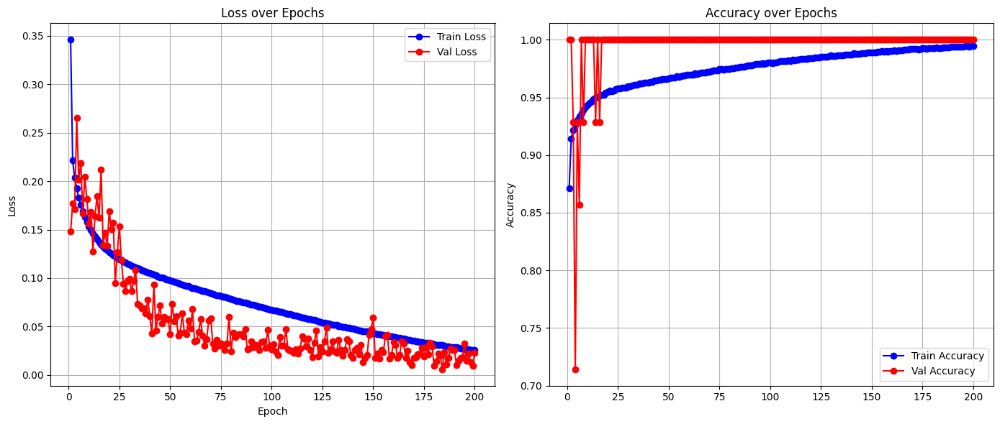

Full model built...
Total execution time: 517.83 seconds
✅ Fold 23 done (lythrum_rotundifolium): Val Loss = 0.0231, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 24 (lythrum_paradoxum):
VALIDATION SET:
  Size: 8
  Class distribution: {np.int64(1): 8}
  Unique groups: [np.str_('lythrum_paradoxum')]
TRAINING SET (original):
  Size: 45353
  Class distribution: {np.int64(1): 20520, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceu

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.54it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.04it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.97it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 617.63it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.27it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.90it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 819.84it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.59it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.65it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.82it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 785.60it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.47it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.54it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.40it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.84it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.02it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.99it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 696.38it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.78it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 684.45it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1048.05it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 732.12it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.01it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 772.15it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 815.54it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.92it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 765.80it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.07it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 781.64it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.26it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 904.92it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.02it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 712.23it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 832.20it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 734.04it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 797.09it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.98it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.11it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.92it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 791.83it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 775.86it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 796.94it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 824.68it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.56it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 804.59it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.27it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 796.79it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.99it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.19it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.89it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 776.58it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 828.91it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.74it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 767.48it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 883.76it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 827.44it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.59it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 746.72it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 701.86it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.98it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 720.42it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 896.60it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 802.74it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 874.18it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.91it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 844.77it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 845.63it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 926.10it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 830.06it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.69it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.44it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 841.38it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 648.27it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.77it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 831.05it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.30it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.83it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 845.46it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 798.00it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 806.75it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.34it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 977.69it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 771.30it/s]



🔁 Epoch 84/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 603.15it/s]



🔁 Epoch 85/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 662.71it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 84
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


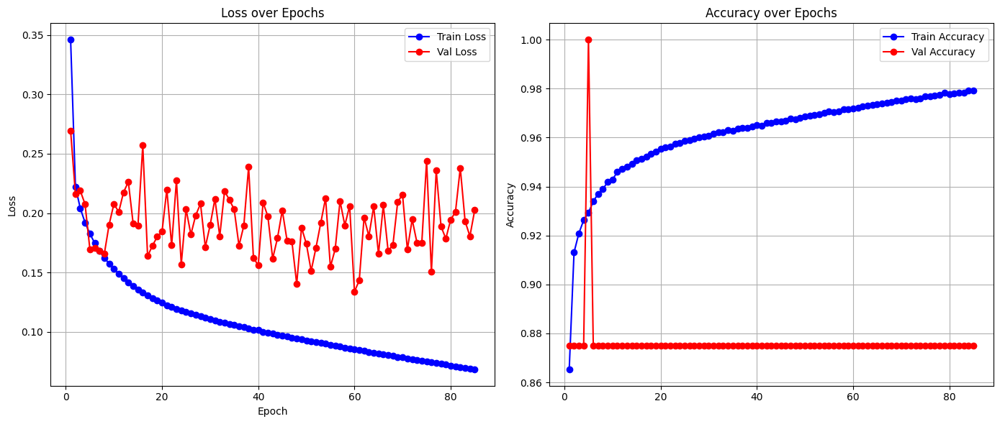

Full model built...
Total execution time: 228.35 seconds
✅ Fold 24 done (lythrum_paradoxum): Val Loss = 0.2025, Val Acc = 0.8750
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 25 (lythrum_wilsonii):
VALIDATION SET:
  Size: 4
  Class distribution: {np.int64(1): 4}
  Unique groups: [np.str_('lythrum_wilsonii')]
TRAINING SET (original):
  Size: 45357
  Class distribution: {np.int64(1): 20524, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), n

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 620.73it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.14it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.46it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 946.15it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 849.39it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.68it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 712.23it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 857.56it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.40it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.48it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 832.37it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1015.82it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 875.45it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.01it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 862.49it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.42it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 820.32it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 888.06it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 817.13it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 722.66it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 859.14it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1031.05it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 884.50it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 886.18it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 818.08it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 705.16it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 834.02it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 832.37it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.53it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.98it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 840.37it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 828.91it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 900.65it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 751.26it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 812.85it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 34
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


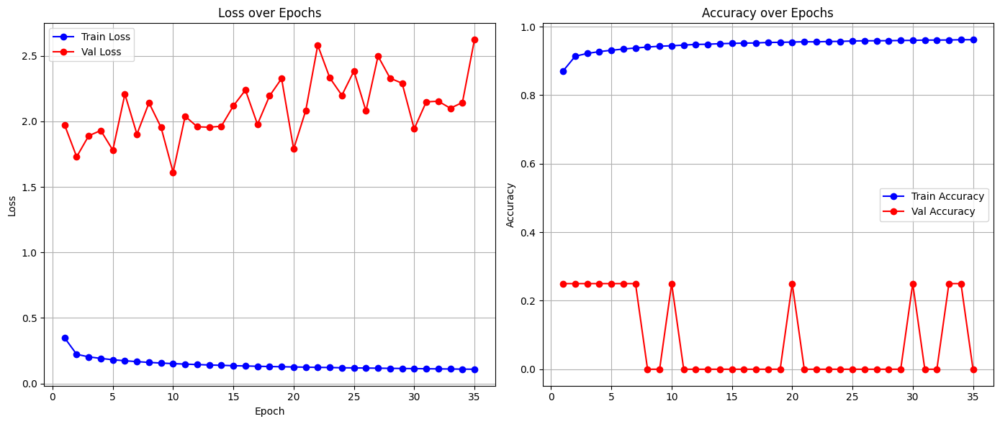

Full model built...
Total execution time: 101.71 seconds
✅ Fold 25 done (lythrum_wilsonii): Val Loss = 2.6230, Val Acc = 0.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 26 (lythrum_netofa):
VALIDATION SET:
  Size: 3
  Class distribution: {np.int64(1): 3}
  Unique groups: [np.str_('lythrum_netofa')]
TRAINING SET (original):
  Size: 45358
  Class distribution: {np.int64(1): 20525, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 896.03it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 780.77it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 945.09it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 820.64it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.05it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 815.38it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 930.00it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 852.33it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 894.12it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 913.39it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 846.82it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 687.93it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 813.80it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.01it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 898.14it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.31it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 687.25it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.56it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 684.78it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 829.41it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 851.12it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.95it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 817.44it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.17it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.91it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.21it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 827.28it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 814.59it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 27
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


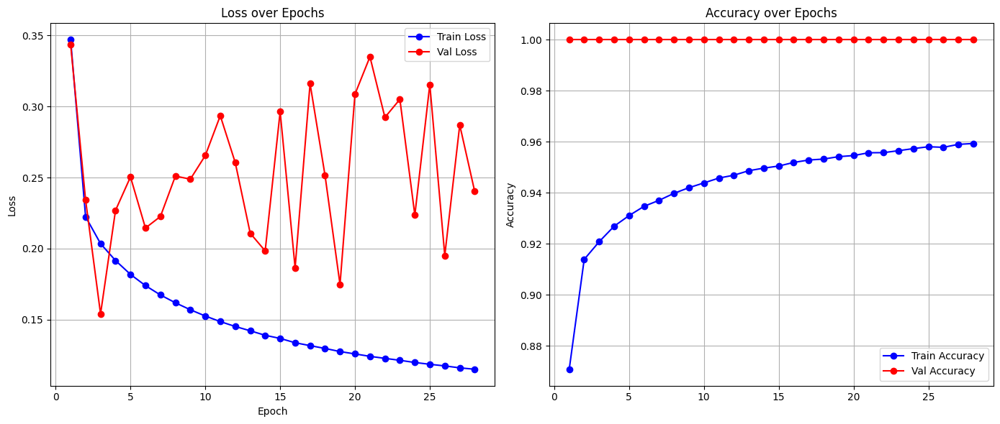

Full model built...
Total execution time: 83.04 seconds
✅ Fold 26 done (lythrum_netofa): Val Loss = 0.2402, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 27 (lythrum_baeticum):
VALIDATION SET:
  Size: 3
  Class distribution: {np.int64(1): 3}
  Unique groups: [np.str_('lythrum_baeticum')]
TRAINING SET (original):
  Size: 45358
  Class distribution: {np.int64(1): 20525, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np.str

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 858.78it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 895.26it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1190.21it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 997.22it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 866.77it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 847.33it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 822.09it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.83it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 812.53it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 787.37it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 905.51it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 886.75it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1053.05it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 955.42it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 915.79it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 852.50it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 868.39it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 837.35it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 886.37it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 824.68it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 919.80it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 912.80it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 804.43it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 872.00it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 924.67it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 969.11it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 793.47it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 917.79it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 27
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


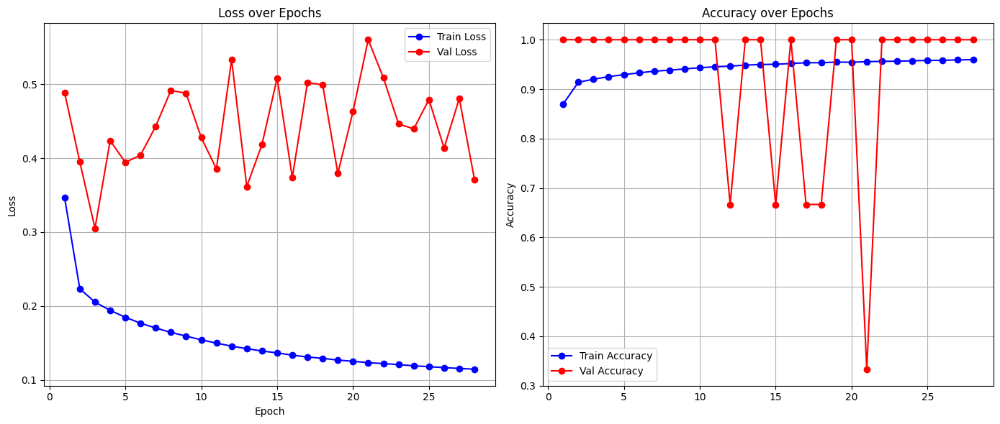

Full model built...
Total execution time: 82.36 seconds
✅ Fold 27 done (lythrum_baeticum): Val Loss = 0.3713, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 28 (lythrum_silenoides):
VALIDATION SET:
  Size: 2
  Class distribution: {np.int64(1): 2}
  Unique groups: [np.str_('lythrum_silenoides')]
TRAINING SET (original):
  Size: 45359
  Class distribution: {np.int64(1): 20526, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'),

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 921.02it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.80it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 851.12it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 891.46it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 905.12it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 871.27it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 859.31it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 913.00it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 913.39it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 822.90it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 986.43it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 877.65it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.92it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 841.89it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 950.01it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.72it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 955.42it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 854.76it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 877.29it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.84it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 729.19it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 887.68it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.67it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 538.70it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 774.43it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.46it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 901.81it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 918.39it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 905.90it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 826.46it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 825.33it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.85it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 927.74it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 951.74it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 823.22it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 859.31it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 826.30it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 806.29it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.73it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 825.49it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.04it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 762.05it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 808.62it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 976.33it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 946.15it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 963.10it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 780.48it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 880.97it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 867.67it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 966.43it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 801.36it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 908.05it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.69it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1058.90it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 813.95it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 936.65it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 909.83it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 896.41it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 852.85it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 819.36it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 828.75it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 885.62it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 845.80it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.55it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 947.65it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.02it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 752.88it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 852.15it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 864.09it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 797.70it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 822.25it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 860.02it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.65it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 834.52it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1179.83it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 787.66it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.35it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 948.94it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 874.72it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 912.00it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.00it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 836.19it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 880.60it/s]



🔁 Epoch 84/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 845.63it/s]



🔁 Epoch 85/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.43it/s]



🔁 Epoch 86/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 916.59it/s]



🔁 Epoch 87/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 817.13it/s]



🔁 Epoch 88/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 799.22it/s]



🔁 Epoch 89/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 827.44it/s]



🔁 Epoch 90/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 915.39it/s]



🔁 Epoch 91/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 852.67it/s]



🔁 Epoch 92/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 906.09it/s]



🔁 Epoch 93/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 954.55it/s]



🔁 Epoch 94/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 864.45it/s]



🔁 Epoch 95/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 870.01it/s]



🔁 Epoch 96/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.55it/s]



🔁 Epoch 97/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 800.13it/s]



🔁 Epoch 98/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.61it/s]



🔁 Epoch 99/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.33it/s]



🔁 Epoch 100/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 858.78it/s]



🔁 Epoch 101/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 916.19it/s]



🔁 Epoch 102/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.98it/s]



🔁 Epoch 103/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 827.44it/s]



🔁 Epoch 104/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.31it/s]



🔁 Epoch 105/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 843.92it/s]



🔁 Epoch 106/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.29it/s]



🔁 Epoch 107/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 919.80it/s]



🔁 Epoch 108/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 825.16it/s]



🔁 Epoch 109/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.78it/s]



🔁 Epoch 110/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 903.36it/s]



🔁 Epoch 111/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 883.38it/s]



🔁 Epoch 112/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.59it/s]



🔁 Epoch 113/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 868.03it/s]



🔁 Epoch 114/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 890.51it/s]



🔁 Epoch 115/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 880.60it/s]



🔁 Epoch 116/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.03it/s]



🔁 Epoch 117/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 799.07it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 116
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


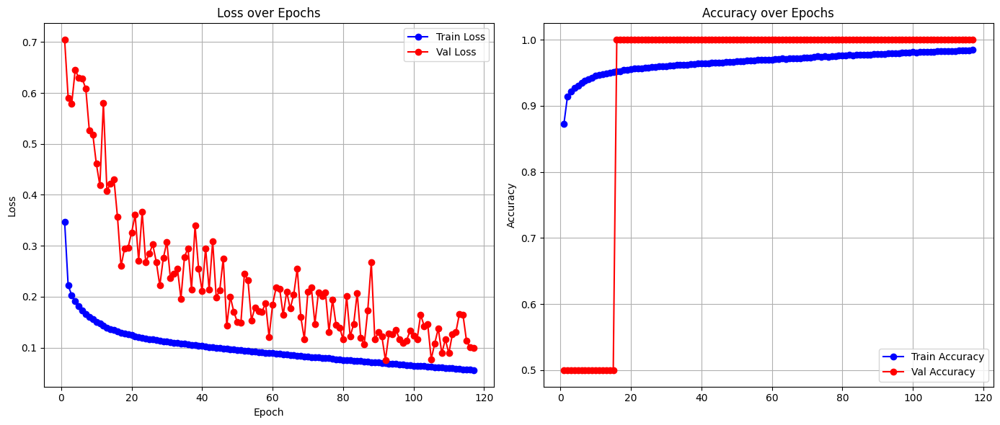

Full model built...
Total execution time: 306.01 seconds
✅ Fold 28 done (lythrum_silenoides): Val Loss = 0.0993, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 29 (lythrum_thesioides):
VALIDATION SET:
  Size: 1
  Class distribution: {np.int64(1): 1}
  Unique groups: [np.str_('lythrum_thesioides')]
TRAINING SET (original):
  Size: 45360
  Class distribution: {np.int64(1): 20527, np.int64(0): 24833}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_hyssopifolia'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 972.03it/s]



🔁 Epoch 2/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 838.02it/s]



🔁 Epoch 3/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 868.75it/s]



🔁 Epoch 4/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 906.48it/s]



🔁 Epoch 5/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 902.00it/s]



🔁 Epoch 6/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 737.40it/s]



🔁 Epoch 7/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 732.63it/s]



🔁 Epoch 8/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 806.60it/s]



🔁 Epoch 9/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 977.24it/s]



🔁 Epoch 10/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.96it/s]



🔁 Epoch 11/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.28it/s]



🔁 Epoch 12/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.66it/s]



🔁 Epoch 13/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 930.00it/s]



🔁 Epoch 14/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 744.73it/s]



🔁 Epoch 15/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1022.00it/s]



🔁 Epoch 16/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 944.45it/s]



🔁 Epoch 17/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 820.32it/s]



🔁 Epoch 18/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 809.40it/s]



🔁 Epoch 19/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 802.74it/s]



🔁 Epoch 20/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 866.59it/s]



🔁 Epoch 21/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 918.19it/s]



🔁 Epoch 22/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 787.96it/s]



🔁 Epoch 23/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 868.21it/s]



🔁 Epoch 24/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.45it/s]



🔁 Epoch 25/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 793.92it/s]



🔁 Epoch 26/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 841.89it/s]



🔁 Epoch 27/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.65it/s]



🔁 Epoch 28/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1046.48it/s]



🔁 Epoch 29/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 861.25it/s]



🔁 Epoch 30/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 920.21it/s]



🔁 Epoch 31/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 860.19it/s]



🔁 Epoch 32/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 833.20it/s]



🔁 Epoch 33/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 748.72it/s]



🔁 Epoch 34/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 818.72it/s]



🔁 Epoch 35/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 798.00it/s]



🔁 Epoch 36/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.04it/s]



🔁 Epoch 37/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 831.54it/s]



🔁 Epoch 38/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 857.20it/s]



🔁 Epoch 39/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.05it/s]



🔁 Epoch 40/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 838.53it/s]



🔁 Epoch 41/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 838.69it/s]



🔁 Epoch 42/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 866.77it/s]



🔁 Epoch 43/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 791.38it/s]



🔁 Epoch 44/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.83it/s]



🔁 Epoch 45/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 844.09it/s]



🔁 Epoch 46/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.65it/s]



🔁 Epoch 47/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 882.64it/s]



🔁 Epoch 48/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 841.22it/s]



🔁 Epoch 49/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 947.44it/s]



🔁 Epoch 50/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 880.79it/s]



🔁 Epoch 51/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.03it/s]



🔁 Epoch 52/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 983.42it/s]



🔁 Epoch 53/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 867.13it/s]



🔁 Epoch 54/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 838.53it/s]



🔁 Epoch 55/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.45it/s]



🔁 Epoch 56/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 789.44it/s]



🔁 Epoch 57/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 904.92it/s]



🔁 Epoch 58/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 881.34it/s]



🔁 Epoch 59/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 869.29it/s]



🔁 Epoch 60/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 897.95it/s]



🔁 Epoch 61/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.93it/s]



🔁 Epoch 62/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 781.94it/s]



🔁 Epoch 63/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 933.94it/s]



🔁 Epoch 64/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 851.12it/s]



🔁 Epoch 65/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 818.24it/s]



🔁 Epoch 66/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 888.62it/s]



🔁 Epoch 67/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 837.19it/s]



🔁 Epoch 68/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.37it/s]



🔁 Epoch 69/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 885.81it/s]



🔁 Epoch 70/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 813.01it/s]



🔁 Epoch 71/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.12it/s]



🔁 Epoch 72/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 860.19it/s]



🔁 Epoch 73/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 740.78it/s]



🔁 Epoch 74/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 819.20it/s]



🔁 Epoch 75/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.81it/s]



🔁 Epoch 76/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 851.81it/s]



🔁 Epoch 77/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 815.22it/s]



🔁 Epoch 78/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 856.33it/s]



🔁 Epoch 79/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 732.12it/s]



🔁 Epoch 80/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.59it/s]



🔁 Epoch 81/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 895.26it/s]



🔁 Epoch 82/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.20it/s]



🔁 Epoch 83/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 917.59it/s]



🔁 Epoch 84/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 871.82it/s]



🔁 Epoch 85/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 862.85it/s]



🔁 Epoch 86/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1042.32it/s]



🔁 Epoch 87/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 866.41it/s]



🔁 Epoch 88/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 872.00it/s]



🔁 Epoch 89/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 797.40it/s]



🔁 Epoch 90/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1001.03it/s]



🔁 Epoch 91/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 765.52it/s]



🔁 Epoch 92/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 974.29it/s]



🔁 Epoch 93/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 924.47it/s]



🔁 Epoch 94/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 839.87it/s]



🔁 Epoch 95/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.04it/s]



🔁 Epoch 96/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 979.29it/s]



🔁 Epoch 97/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 845.46it/s]



🔁 Epoch 98/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.48it/s]



🔁 Epoch 99/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.29it/s]



🔁 Epoch 100/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.98it/s]



🔁 Epoch 101/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 924.06it/s]



🔁 Epoch 102/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 855.46it/s]



🔁 Epoch 103/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 829.41it/s]



🔁 Epoch 104/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 880.79it/s]



🔁 Epoch 105/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 662.40it/s]



🔁 Epoch 106/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 850.94it/s]



🔁 Epoch 107/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 908.84it/s]



🔁 Epoch 108/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.96it/s]



🔁 Epoch 109/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 746.72it/s]



🔁 Epoch 110/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 771.15it/s]



🔁 Epoch 111/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 780.48it/s]



🔁 Epoch 112/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 861.25it/s]



🔁 Epoch 113/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 845.28it/s]



🔁 Epoch 114/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.42it/s]



🔁 Epoch 115/200


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.48it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 114
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


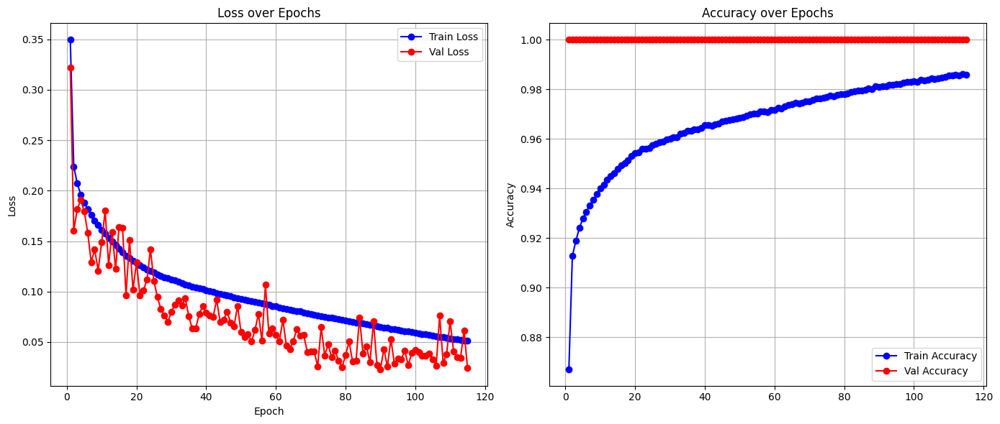

Full model built...
Total execution time: 301.75 seconds
✅ Fold 29 done (lythrum_thesioides): Val Loss = 0.0242, Val Acc = 1.0000

📊 Cross-validation results:
Average Validation Loss: 1.0574
Average Validation Accuracy: 0.7284
All Fold Accuracies: [0.5690194582220527, 0.8312839576780098, 0.00459146405092351, 0.41094224924012157, 0.8303682250724038, 0.8087482550023266, 0.5417249417249417, 0.9752808988764045, 0.2513812154696133, 0.9317507418397626, 0.7256637168141593, 0.775, 0.07534246575342465, 0.8770491803278688, 0.8160919540229885, 0.7283950617283951, 1.0, 0.0, 0.9583333333333334, 1.0, 1.0, 0.8666666666666667, 1.0, 1.0, 0.875, 0.0, 1.0, 1.0, 1.0, 1.0]
Complete results: 
 {}


In [ ]:
all_val_losses = []
all_val_accuracies = []

remove_species=[None]

n_splits = 30

embeddings_save_path_BC2_new = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
model_name_final = 'group_k_fold_new_embeddings'
epochs=200

results = {}

for fold_idx in range(n_splits):
  val_loss, val_acc, taxa = create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=False, augmentation_factor=2,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name=model_name_final,
                                           save_model=True, verbose=False, embeddings_save_path=embeddings_save_path_BC2_new,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx, remove_species=remove_species, do_early_stopping=True)
  all_val_losses.append(val_loss)
  all_val_accuracies.append(val_acc)
  print(f"✅ Fold {fold_idx} done ({taxa}): Val Loss = {val_loss:.4f}, Val Acc = {val_acc:.4f}")


mean_loss = sum(all_val_losses) / len(all_val_losses)
mean_acc = sum(all_val_accuracies) / len(all_val_accuracies)

print("\n📊 Cross-validation results:")
print(f"Average Validation Loss: {mean_loss:.4f}")
print(f"Average Validation Accuracy: {mean_acc:.4f}")
print(f"All Fold Accuracies: {all_val_accuracies}")

print(f"Complete results: \n {results}")

Updating files: 100% (45475/45475), done.
Already on 'clean-barbara'
Your branch is up to date with 'origin/clean-barbara'.
Using device: cuda
BioCLIP 2!


open_clip_config.json:   0%|          | 0.00/534 [00:00<?, ?B/s]

open_clip_model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 23 (lythrum_paradoxum):
VALIDATION SET:
  Size: 8
  Class distribution: {np.int64(1): 8}
  Unique groups: [np.str_('lythrum_paradoxum')]
TRAINING SET (original):
  Size: 35770
  Class distribution: {np.int64(1): 20520, np.int64(0): 15250}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np.str_('lythrum_maritimum'), np.str_('lythrum_netofa'), np.str_('lythrum_ovalifolium'), np.str_('lythrum_portula'), np.str_('lythrum_rotundifolium'), np.str_('lyt

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 31.02it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 833.69it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 952.60it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 830.06it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.21it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 775.86it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 629.68it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.38it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 757.92it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 824.03it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 721.04it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 831.71it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.65it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 825.16it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 911.81it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.16it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 809.55it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.77it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.48it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.57it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 800.44it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.91it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.22it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.19it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.46it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.43it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.06it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.87it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.33it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.36it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.98it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.45it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 757.78it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 692.59it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.05it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 795.13it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 670.12it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.54it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.00it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 875.82it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.59it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 752.34it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.98it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 874.72it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.67it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.49it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 796.79it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.67it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 672.49it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.92it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


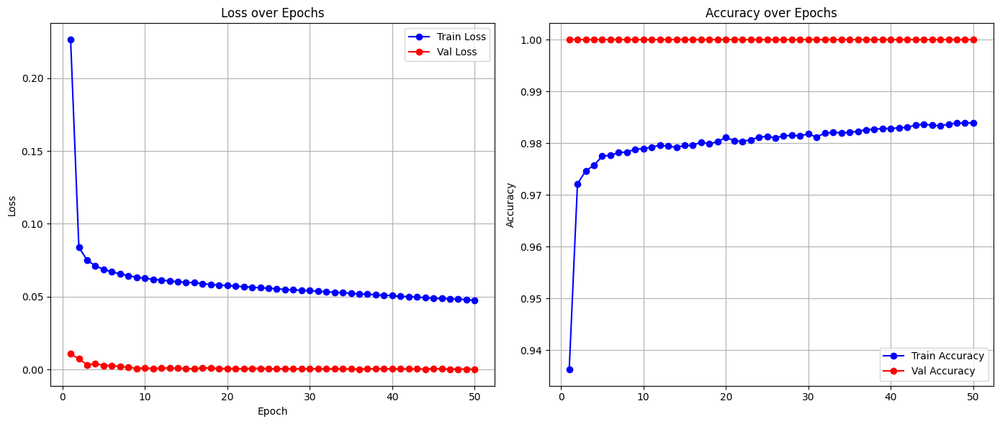

Full model built...
Total execution time: 168.51 seconds
✅ Fold 23 done (lythrum_paradoxum): Val Loss = 0.0001, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 24 (lythrum_wilsonii):
VALIDATION SET:
  Size: 4
  Class distribution: {np.int64(1): 4}
  Unique groups: [np.str_('lythrum_wilsonii')]
TRAINING SET (original):
  Size: 35774
  Class distribution: {np.int64(1): 20524, np.int64(0): 15250}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np.str

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.59it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 927.74it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 828.10it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.05it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.27it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 801.82it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.24it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 880.23it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 980.44it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 875.09it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 796.94it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 612.93it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 803.04it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 868.93it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 720.55it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 599.27it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 804.28it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.33it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.46it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 813.32it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 732.12it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.19it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.63it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 819.20it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 767.06it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 922.64it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.43it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 836.69it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 763.85it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.03it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.59it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.82it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 833.53it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 751.94it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 842.06it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.69it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 699.28it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 908.25it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 856.33it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.83it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 880.23it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.10it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 905.70it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 775.72it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 823.87it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1062.12it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 917.59it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1026.51it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 830.72it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.14it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


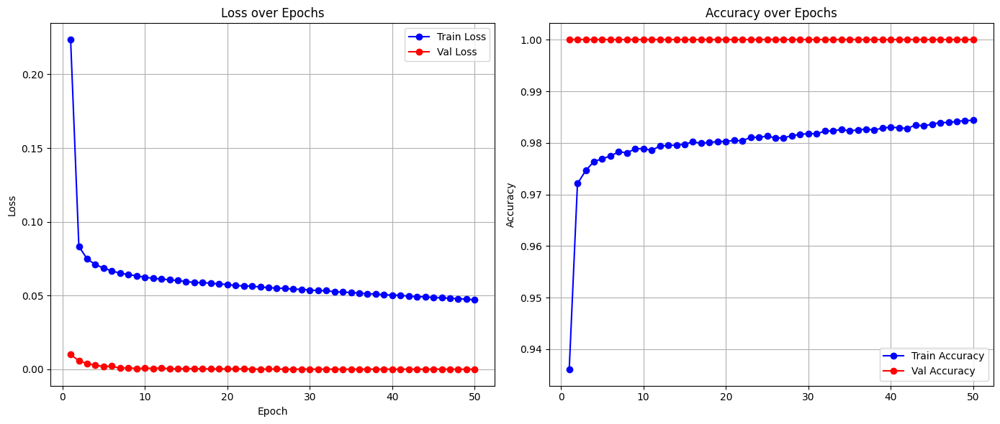

Full model built...
Total execution time: 109.67 seconds
✅ Fold 24 done (lythrum_wilsonii): Val Loss = 0.0001, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 25 (lythrum_netofa):
VALIDATION SET:
  Size: 3
  Class distribution: {np.int64(1): 3}
  Unique groups: [np.str_('lythrum_netofa')]
TRAINING SET (original):
  Size: 35775
  Class distribution: {np.int64(1): 20525, np.int64(0): 15250}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np.str_('ly

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 835.19it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 949.15it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 927.12it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 992.03it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 787.66it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.65it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 735.33it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.99it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 858.08it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 874.36it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 762.74it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 874.18it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.15it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 846.48it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.51it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.04it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.74it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.33it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 706.59it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 846.82it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.75it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1012.14it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.98it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1031.81it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 872.54it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 817.13it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 841.22it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.01it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.90it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.87it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.46it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 763.29it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 907.66it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 844.43it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 825.65it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 965.98it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.41it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 746.32it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.29it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 818.40it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 882.64it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 818.72it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 896.79it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.05it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 861.78it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 809.87it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 807.22it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.75it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 878.02it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 919.80it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


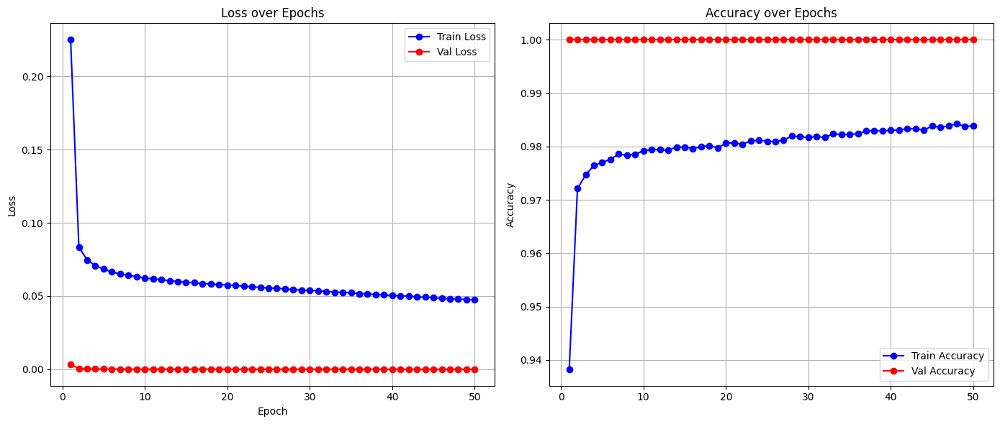

Full model built...
Total execution time: 108.85 seconds
✅ Fold 25 done (lythrum_netofa): Val Loss = 0.0000, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 26 (lythrum_baeticum):
VALIDATION SET:
  Size: 3
  Class distribution: {np.int64(1): 3}
  Unique groups: [np.str_('lythrum_baeticum')]
TRAINING SET (original):
  Size: 35775
  Class distribution: {np.int64(1): 20525, np.int64(0): 15250}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np.str_('lythrum_maritimum'), np.str_(

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.67it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 981.58it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 887.68it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 908.25it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 772.72it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1026.25it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 819.84it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 824.51it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 851.98it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 921.83it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 836.02it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 731.10it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 662.50it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 837.52it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 842.57it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 878.20it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.59it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.78it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 776.58it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 974.29it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 757.64it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.12it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.97it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 799.98it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 822.41it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 744.46it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 787.96it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.31it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 796.49it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 920.61it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.45it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 848.71it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 918.59it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 916.59it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 849.05it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 780.48it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 900.26it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 826.79it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 983.89it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.23it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 798.76it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.79it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1088.02it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 834.36it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 795.73it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.59it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.16it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.20it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 848.02it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 794.23it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


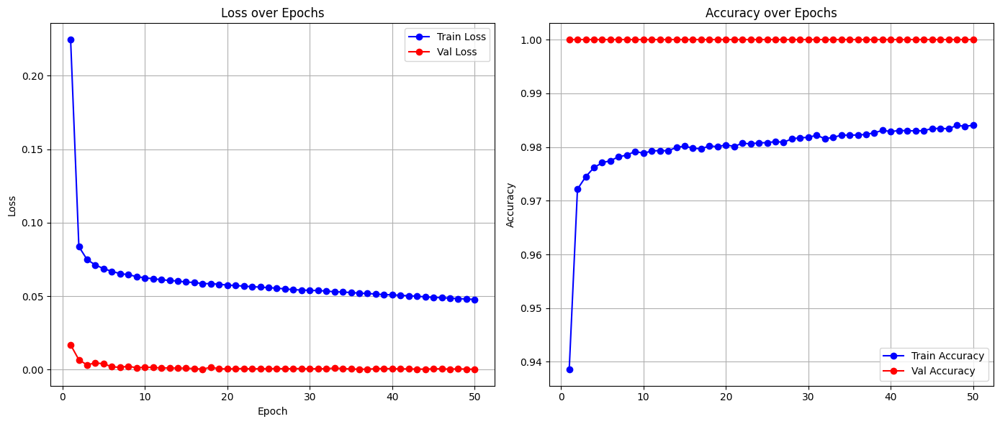

Full model built...
Total execution time: 109.19 seconds
✅ Fold 26 done (lythrum_baeticum): Val Loss = 0.0003, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 27 (lythrum_silenoides):
VALIDATION SET:
  Size: 2
  Class distribution: {np.int64(1): 2}
  Unique groups: [np.str_('lythrum_silenoides')]
TRAINING SET (original):
  Size: 35776
  Class distribution: {np.int64(1): 20526, np.int64(0): 15250}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np.

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 890.32it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 701.51it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.73it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 781.06it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 805.05it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 699.28it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.93it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.43it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 813.48it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 874.18it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.84it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 826.30it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 778.31it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 791.23it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 774.29it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 834.85it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 788.11it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1062.66it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 969.33it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.80it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 776.72it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.09it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.03it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 662.29it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 835.85it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 785.01it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.05it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1046.74it/s]


Stopping early as no improvement has been observed.
Early stopping at epoch 27
📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


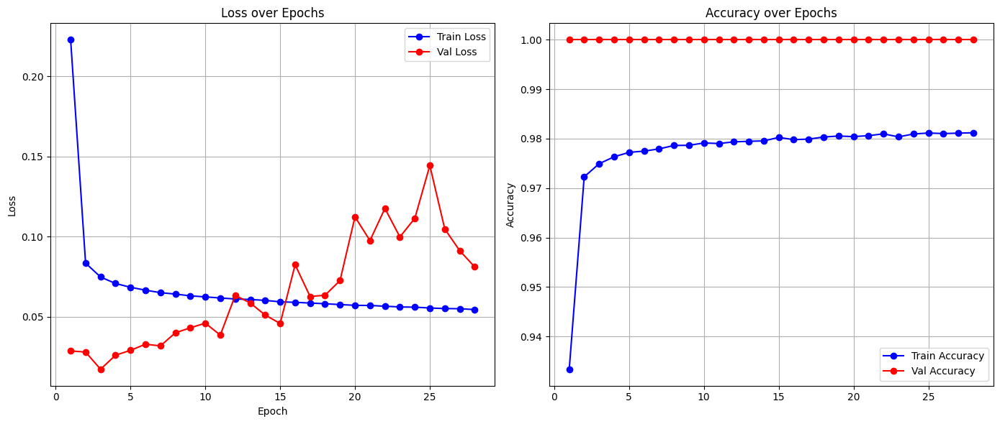

Full model built...
Total execution time: 66.86 seconds
✅ Fold 27 done (lythrum_silenoides): Val Loss = 0.0811, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...

🔍 DEBUG: Actual sets for fold 28 (lythrum_thesioides):
VALIDATION SET:
  Size: 1
  Class distribution: {np.int64(1): 1}
  Unique groups: [np.str_('lythrum_thesioides')]
TRAINING SET (original):
  Size: 35777
  Class distribution: {np.int64(1): 20527, np.int64(0): 15250}
  Unique groups: [np.str_('lythrum_acutangulum'), np.str_('lythrum_alatum'), np.str_('lythrum_album'), np.str_('lythrum_baeticum'), np.str_('lythrum_borysthenicum'), np.str_('lythrum_bryantii'), np.str_('lythrum_californicum'), np.str_('lythrum_curtissii'), np.str_('lythrum_flagellare'), np.str_('lythrum_flexuosum'), np.str_('lythrum_gracile'), np.str_('lythrum_intermedium'), np.str_('lythrum_junceum'), np.str_('lythrum_lineare'), np

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 909.24it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 882.83it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1082.96it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.03it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.01it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 865.16it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1042.84it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 776.00it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.30it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 815.85it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 817.28it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.40it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 997.69it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 787.22it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 918.80it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 762.05it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 684.78it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 958.92it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 849.22it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1073.26it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 929.18it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.69it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.65it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.93it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 832.04it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1034.35it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 767.63it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 862.14it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 892.22it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 891.27it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 801.05it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.37it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 722.04it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.89it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 834.52it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 847.16it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.53it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.33it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.25it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 921.22it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 816.81it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1056.77it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 845.11it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.62it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 862.14it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.92it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 799.98it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 850.77it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 857.20it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.74it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


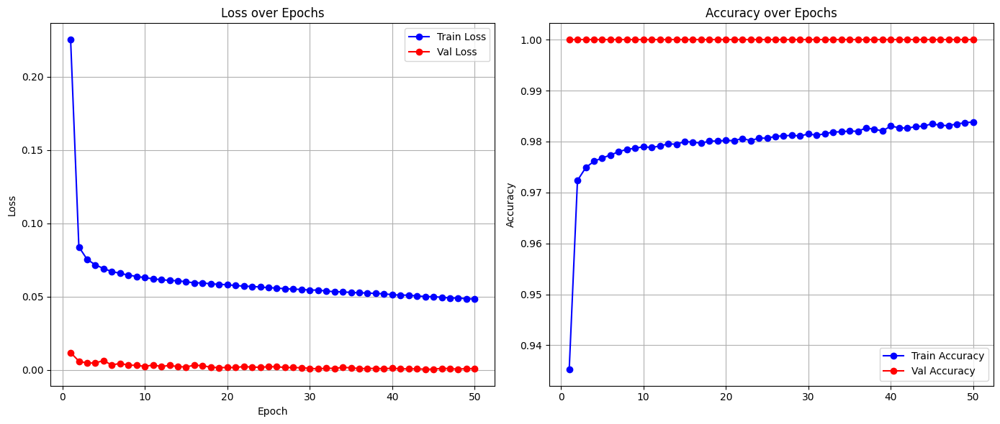

Full model built...
Total execution time: 109.52 seconds
✅ Fold 28 done (lythrum_thesioides): Val Loss = 0.0008, Val Acc = 1.0000

📊 Cross-validation results:
Average Validation Loss: 0.0137
Average Validation Accuracy: 1.0000
All Fold Accuracies: [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Complete results: 
 {'lythrum_paradoxum': 1.0, 'lythrum_wilsonii': 1.0, 'lythrum_netofa': 1.0, 'lythrum_baeticum': 1.0, 'lythrum_silenoides': 1.0, 'lythrum_thesioides': 1.0}


In [ ]:
all_val_losses = []
all_val_accuracies = []

remove_species=['lythrum_hyssopifolia']

n_splits = 29

embeddings_save_path_BC2_new = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
model_name_final = 'group_k_fold_new_embeddings'
epochs=50

results = {}

for fold_idx in range(23,29):
  val_loss, val_acc, taxa = create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=False, augmentation_factor=2,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name=model_name_final,
                                           save_model=True, verbose=False, embeddings_save_path=embeddings_save_path_BC2_new,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx, remove_species=remove_species, do_early_stopping=True)
  all_val_losses.append(val_loss)
  all_val_accuracies.append(val_acc)
  print(f"✅ Fold {fold_idx} done ({taxa}): Val Loss = {val_loss:.4f}, Val Acc = {val_acc:.4f}")
  results[taxa] = val_acc


mean_loss = sum(all_val_losses) / len(all_val_losses)
mean_acc = sum(all_val_accuracies) / len(all_val_accuracies)

print("\n📊 Cross-validation results:")
print(f"Average Validation Loss: {mean_loss:.4f}")
print(f"Average Validation Accuracy: {mean_acc:.4f}")
print(f"All Fold Accuracies: {all_val_accuracies}")

print(f"Complete results: \n {results}")

### Testing by augmenting Virgatum to see how results for each species change


Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:52<00:00,  1.31it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1036.51it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1025.02it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1040.35it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1000.06it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1021.55it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1011.47it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1036.90it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1033.62it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1034.59it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1038.35it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1035.01it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1019.78it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1026.91it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1025.61it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1047.48it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1029.89it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1001.13it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 986.39it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 983.33it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1022.12it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1056.45it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1038.08it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1024.27it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 996.71it/s] 



🔁 Epoch 25/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1042.22it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1048.20it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1043.77it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 993.33it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1042.53it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1030.69it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1061.15it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1036.19it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 962.49it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 982.81it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1043.22it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1056.61it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1054.60it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1033.95it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1015.43it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1030.96it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1015.08it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1009.39it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1029.83it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1051.06it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1012.02it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 995.28it/s] 



🔁 Epoch 47/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1046.47it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1047.78it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1051.23it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 410/410 [00:00<00:00, 1036.25it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


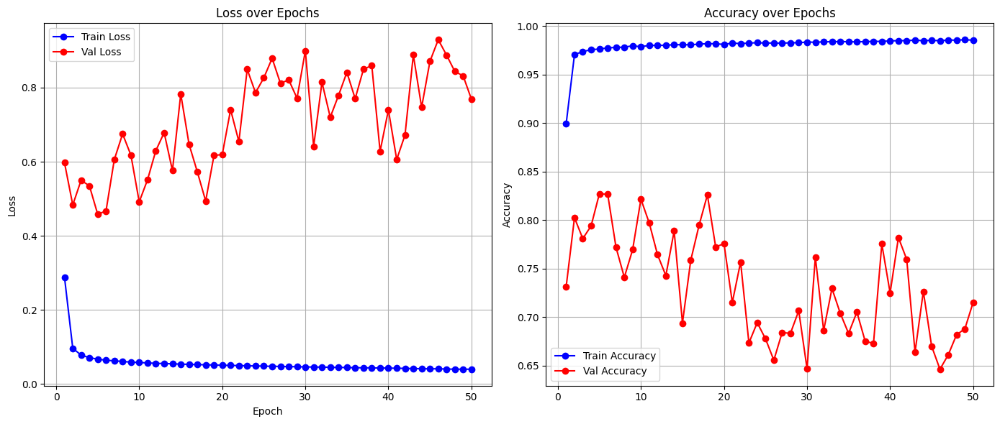

Full model built...
Total execution time: 159.69 seconds
✅ Fold 0 done: Val Loss = 0.7684, Val Acc = 0.7153
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:52<00:00,  1.29it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1037.66it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1008.22it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1034.69it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1012.33it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 976.81it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1026.70it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1021.41it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1038.31it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1048.10it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1025.96it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1022.07it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1042.30it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1036.98it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1047.55it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1030.43it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1038.86it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1034.25it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 990.82it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 976.70it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 966.63it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1005.86it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1027.87it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1017.69it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1017.53it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 996.12it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1029.66it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1035.35it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1027.06it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1048.85it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1015.89it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1029.78it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1037.32it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1043.95it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1032.87it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1033.95it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1058.94it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 987.43it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1027.71it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1024.30it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1020.06it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1023.71it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1019.16it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1026.94it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 962.14it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1032.48it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1036.05it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1031.95it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1046.41it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1032.92it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 328/328 [00:00<00:00, 1031.30it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


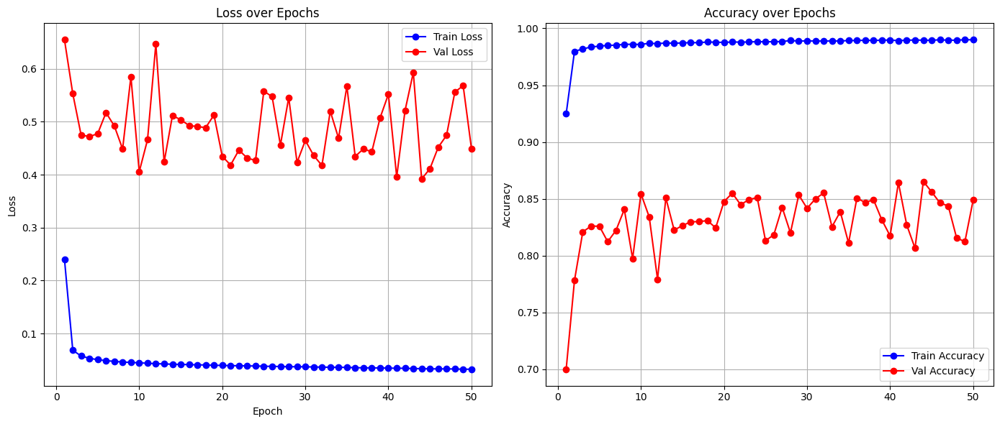

Full model built...
Total execution time: 165.09 seconds
✅ Fold 1 done: Val Loss = 0.4496, Val Acc = 0.8489
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.28it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 103/103 [00:00<00:00, 970.84it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1031.04it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1051.34it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1040.93it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1045.18it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 938.39it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1043.73it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1031.52it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 994.10it/s] 



🔁 Epoch 10/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1009.44it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1036.36it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 984.11it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1033.47it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 965.80it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1020.29it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1030.16it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1033.79it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1049.84it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1038.14it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1038.52it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1033.55it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1010.60it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1013.43it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1036.53it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1047.67it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1021.47it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1017.44it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1032.37it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1054.71it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 953.85it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 967.72it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1036.71it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1036.04it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1005.73it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1052.04it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1029.27it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1037.10it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1013.15it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1035.36it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1033.22it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1035.31it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 933.25it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1034.21it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1008.17it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1017.19it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1018.60it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1031.78it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1016.80it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 971.10it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 103/103 [00:00<00:00, 1020.33it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


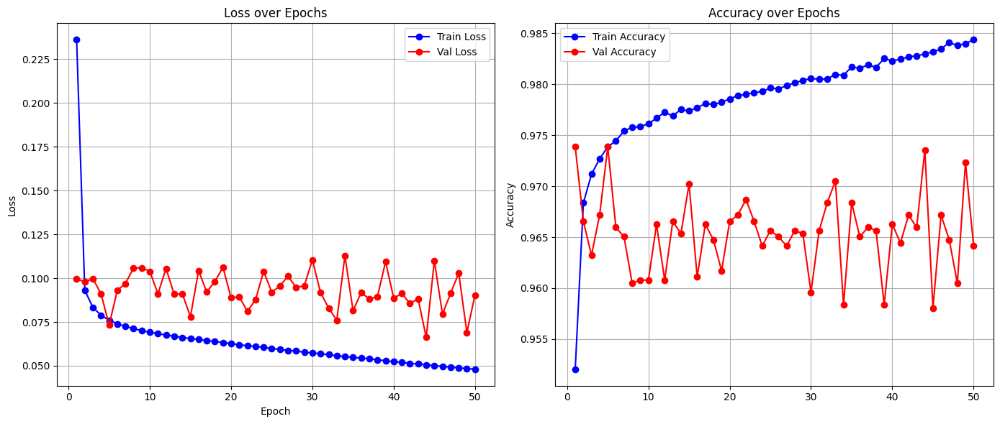

Full model built...
Total execution time: 175.20 seconds
✅ Fold 2 done: Val Loss = 0.0904, Val Acc = 0.9641
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 76/76 [00:00<00:00, 956.24it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1020.01it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1047.37it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1034.36it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1029.85it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1028.12it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1042.48it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1025.52it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1025.97it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1033.25it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1017.30it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1017.31it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1006.20it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 935.59it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1035.53it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1020.16it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 959.59it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1020.43it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 948.79it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1026.36it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 956.03it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1039.15it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 953.78it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1049.04it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1024.02it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1035.38it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1040.63it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1036.09it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1029.17it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1035.04it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1046.94it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 999.08it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 968.86it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1040.10it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1035.95it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1052.06it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1034.93it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1042.76it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1019.99it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 922.10it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1046.37it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1001.57it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1005.66it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1057.47it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1020.67it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 989.07it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 988.35it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1031.33it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1035.23it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 76/76 [00:00<00:00, 1038.73it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


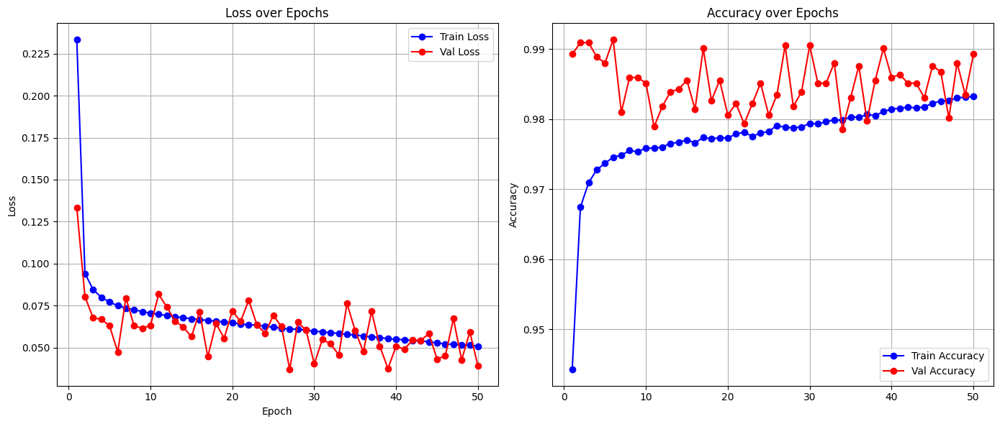

Full model built...
Total execution time: 176.36 seconds
✅ Fold 3 done: Val Loss = 0.0389, Val Acc = 0.9892
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 68/68 [00:00<00:00, 937.72it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1057.97it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 901.08it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1008.57it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1060.01it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 906.47it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1056.25it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1008.35it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 910.82it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1041.61it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1023.07it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1038.19it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1023.53it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 978.29it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1060.22it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1015.00it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1022.07it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1045.81it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1048.79it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1038.04it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1038.05it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1060.35it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1016.29it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1042.47it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 924.15it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1021.62it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1024.03it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1033.45it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 961.54it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 959.90it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1021.31it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1014.75it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1054.36it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1054.96it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1024.68it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1035.06it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1020.93it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1031.78it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 995.01it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1033.93it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1038.73it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1007.98it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1028.74it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1044.87it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1029.15it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 975.79it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1015.86it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1011.29it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 996.56it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 68/68 [00:00<00:00, 1042.62it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


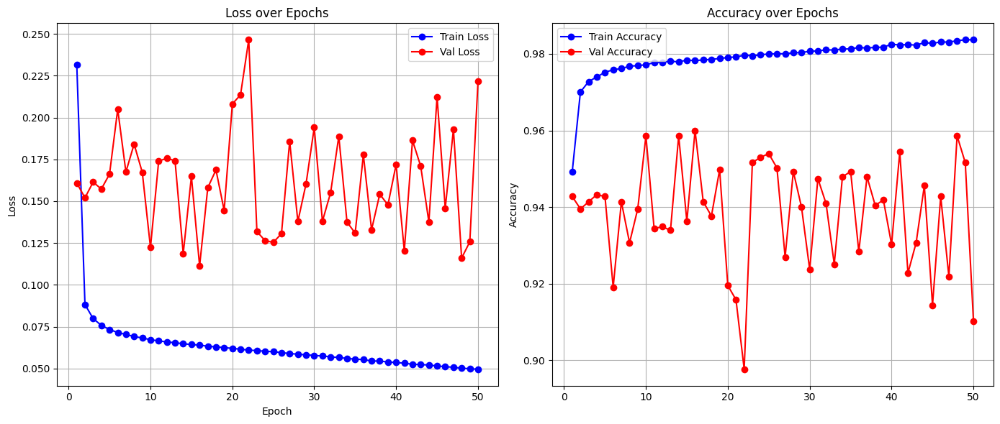

Full model built...
Total execution time: 177.19 seconds
✅ Fold 4 done: Val Loss = 0.2216, Val Acc = 0.9102
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 14/14 [00:00<00:00, 961.98it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 897.97it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 990.91it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 983.98it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 964.10it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 834.89it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 896.38it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 993.57it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 728.83it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 880.50it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 909.00it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 803.54it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 739.69it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1010.43it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 968.09it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 950.81it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 984.48it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 792.81it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1036.20it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 738.48it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 721.88it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 917.02it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 998.41it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1018.71it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1005.95it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1000.96it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 910.56it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 967.99it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 987.36it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 964.65it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1006.05it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 948.37it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 826.15it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 966.11it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1011.83it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 999.94it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 968.57it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 912.44it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 974.24it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 987.48it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1013.22it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 985.42it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 985.34it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 940.79it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 860.77it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 978.93it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 989.66it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 834.70it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 1000.36it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 14/14 [00:00<00:00, 993.14it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


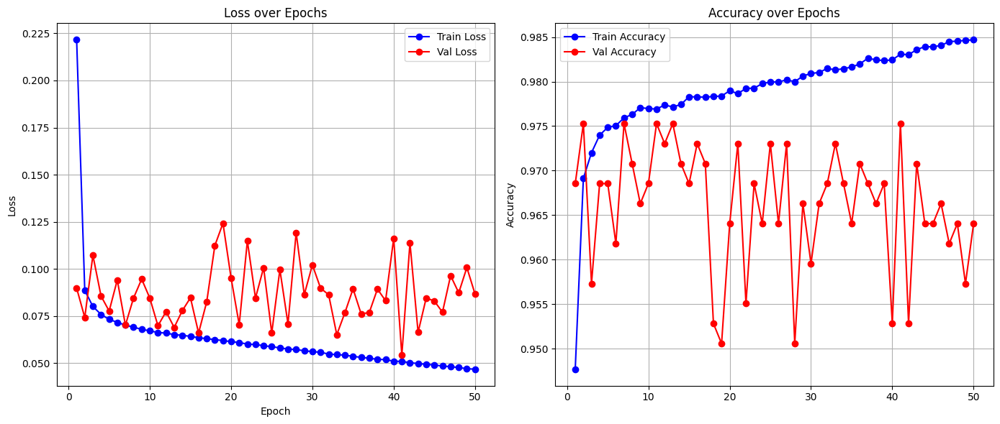

Full model built...
Total execution time: 179.88 seconds
✅ Fold 6 done: Val Loss = 0.0868, Val Acc = 0.9640
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1033.84it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1000.43it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 976.08it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 859.56it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 931.19it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 958.30it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 997.14it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 984.46it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 895.74it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 961.83it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 901.24it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1037.32it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 815.22it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1030.41it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1003.00it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1015.18it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1015.08it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 879.92it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 957.95it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 962.79it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 997.02it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 984.17it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 972.14it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 744.03it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 981.26it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 734.02it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1029.00it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1005.37it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 916.12it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 969.65it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 897.26it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 756.55it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 980.63it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 981.22it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1000.93it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1019.81it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 967.02it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1014.24it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 970.04it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 960.51it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1036.16it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 958.92it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 974.44it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 960.69it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 905.80it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 979.48it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 1013.69it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 971.24it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 749.55it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 12/12 [00:00<00:00, 769.42it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


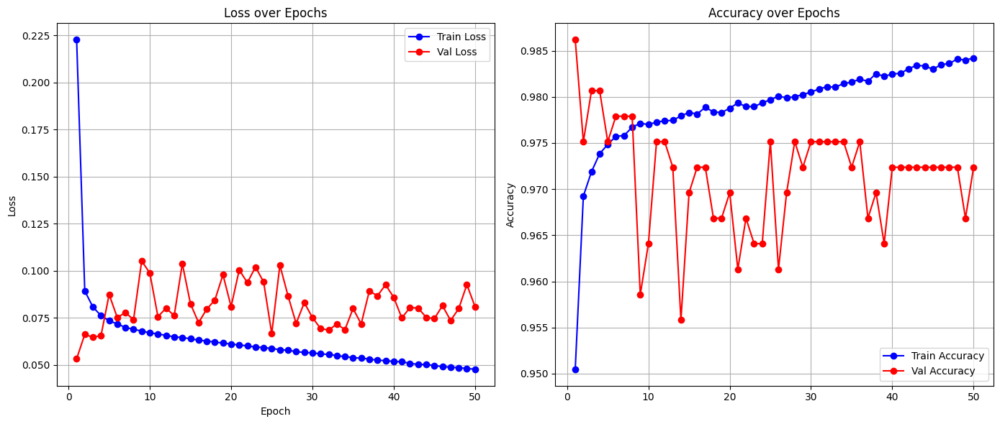

Full model built...
Total execution time: 180.18 seconds
✅ Fold 7 done: Val Loss = 0.0810, Val Acc = 0.9724
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1005.81it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 929.91it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 946.52it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 907.20it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 996.81it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1012.14it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 974.35it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1004.75it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 997.78it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 740.77it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 979.58it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 995.37it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 986.73it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 893.49it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 890.99it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 969.17it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 939.05it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 948.22it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 915.68it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1024.55it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1017.83it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 995.95it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1007.39it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 857.48it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 836.53it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 959.60it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 941.31it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 996.92it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 740.75it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1018.66it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 973.73it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 969.43it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 684.37it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1012.21it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1016.98it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 938.57it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 994.04it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1013.52it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 984.49it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 963.74it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 992.33it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 987.21it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 870.76it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1019.56it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 951.56it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1006.97it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1009.95it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 993.65it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 963.10it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 11/11 [00:00<00:00, 1003.14it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


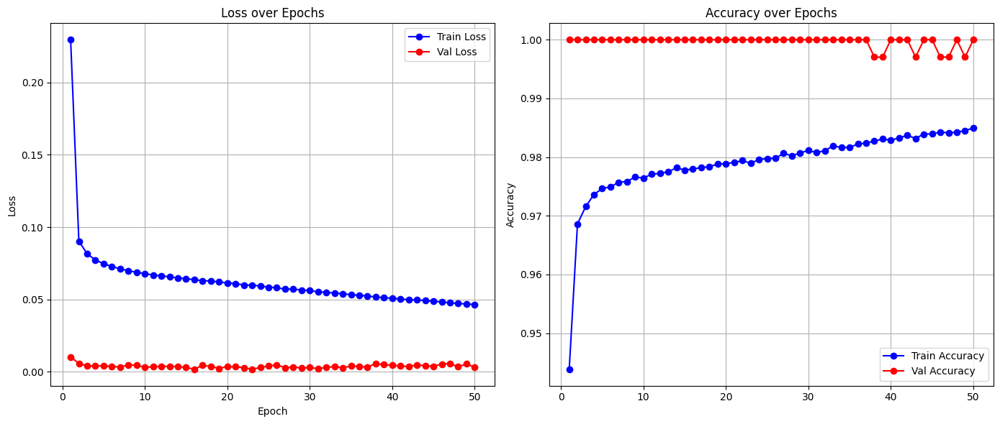

Full model built...
Total execution time: 180.16 seconds
✅ Fold 8 done: Val Loss = 0.0030, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1013.27it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 845.37it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 990.04it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 835.14it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 771.24it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 988.61it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 988.12it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 760.32it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 742.88it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1004.17it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1052.59it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 767.96it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 743.19it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1015.32it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 988.73it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 737.78it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 967.07it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 965.93it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1000.82it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 990.68it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1005.80it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1001.09it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 880.49it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 998.20it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 972.59it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1036.43it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 997.99it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 842.76it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 923.42it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 977.92it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1033.05it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 760.73it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1003.42it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 886.79it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 987.36it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1011.99it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 945.04it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 981.18it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1005.56it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 857.07it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 994.29it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1018.75it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 887.10it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1029.78it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1013.85it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 845.95it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 907.78it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1013.76it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 1033.94it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 8/8 [00:00<00:00, 985.33it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


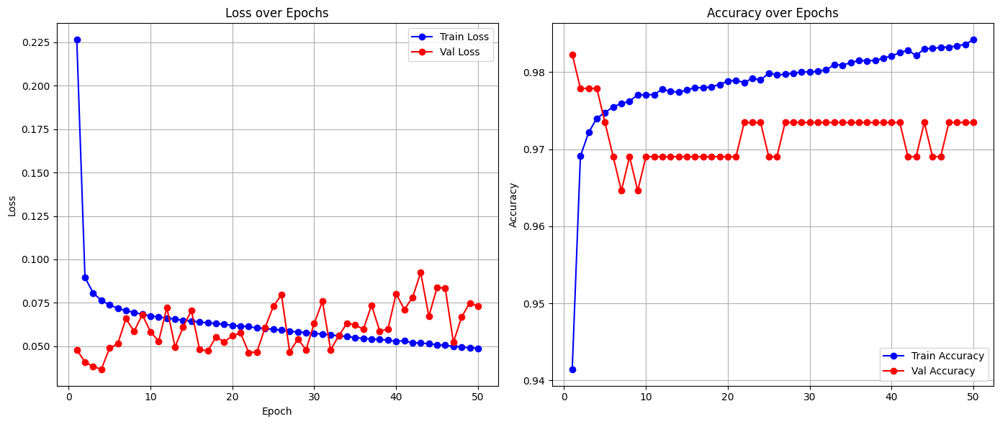

Full model built...
Total execution time: 180.35 seconds
✅ Fold 9 done: Val Loss = 0.0730, Val Acc = 0.9735
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 5/5 [00:00<00:00, 966.03it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 700.90it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 934.02it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 814.87it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 942.12it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 819.71it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 696.03it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 908.21it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 936.10it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 884.39it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 696.71it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 908.80it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 690.69it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 916.35it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 829.21it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 909.47it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 906.80it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 842.60it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 878.31it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 886.60it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 888.77it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 774.26it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 919.00it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 919.96it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 980.89it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 913.95it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 923.53it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 917.15it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 897.68it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 923.00it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 899.14it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 921.46it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 891.57it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 823.90it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 940.68it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 868.35it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 873.41it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 954.07it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 921.62it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 878.24it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 680.36it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 932.86it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 909.91it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 906.37it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 940.93it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 819.07it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 935.56it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 885.43it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 936.60it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 928.97it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


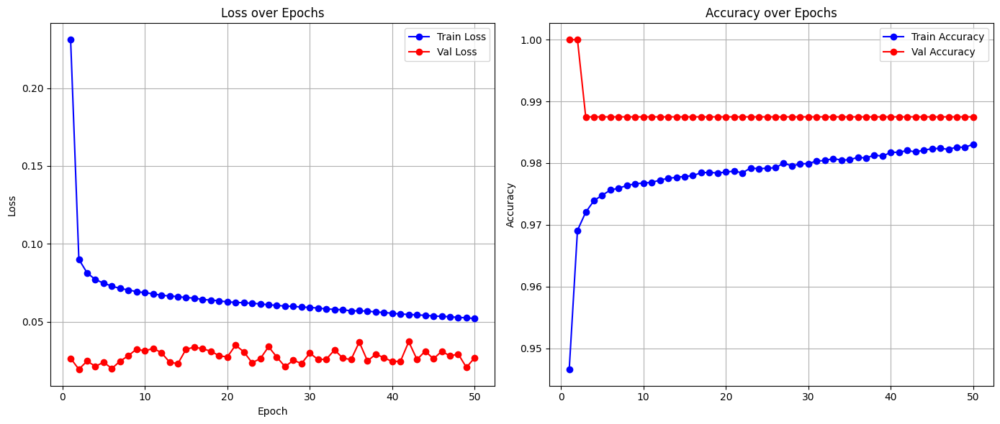

Full model built...
Total execution time: 180.92 seconds
✅ Fold 10 done: Val Loss = 0.0269, Val Acc = 0.9875
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 5/5 [00:00<00:00, 952.04it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 971.04it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 920.05it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 864.27it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 900.72it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 927.66it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 1015.42it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 910.50it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 918.43it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 886.60it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 919.12it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 910.50it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 901.88it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 887.23it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 947.57it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 978.56it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 941.19it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 951.18it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 576.20it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 963.06it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 917.23it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 957.47it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 946.84it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 869.61it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 969.69it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 710.63it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 713.80it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 938.03it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 918.76it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 976.37it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 928.56it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 779.06it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 978.97it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 963.10it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 908.64it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 991.98it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 956.12it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 946.24it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 730.54it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 931.65it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 916.95it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 933.35it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 673.44it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 926.51it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 921.34it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 943.18it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 950.66it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 867.63it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 897.83it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 5/5 [00:00<00:00, 924.34it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


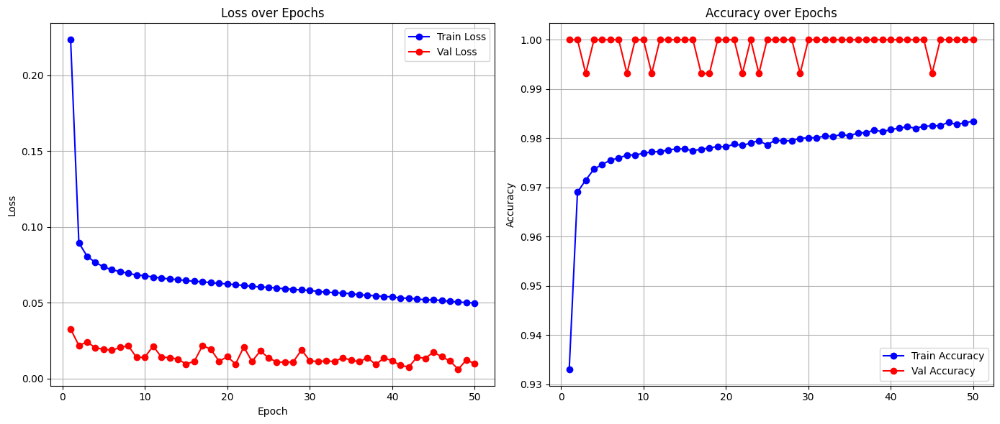

Full model built...
Total execution time: 180.50 seconds
✅ Fold 11 done: Val Loss = 0.0097, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 4/4 [00:00<00:00, 701.24it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 947.49it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 888.01it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 738.89it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 902.34it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 858.70it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 699.60it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 850.60it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 734.49it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 719.10it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 928.20it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 824.72it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 926.30it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 908.15it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 917.84it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 905.60it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 917.49it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 944.82it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 924.36it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 922.18it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 703.33it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 640.74it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 932.02it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 917.59it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 902.68it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 897.56it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 903.36it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 925.74it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 678.64it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 691.62it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 876.87it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 702.71it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 682.58it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 866.37it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 967.49it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 908.69it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 917.59it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 822.25it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 894.64it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 898.86it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 936.28it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 674.95it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 941.06it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 791.71it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 909.09it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 861.16it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 920.26it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 905.60it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 889.24it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 4/4 [00:00<00:00, 837.94it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


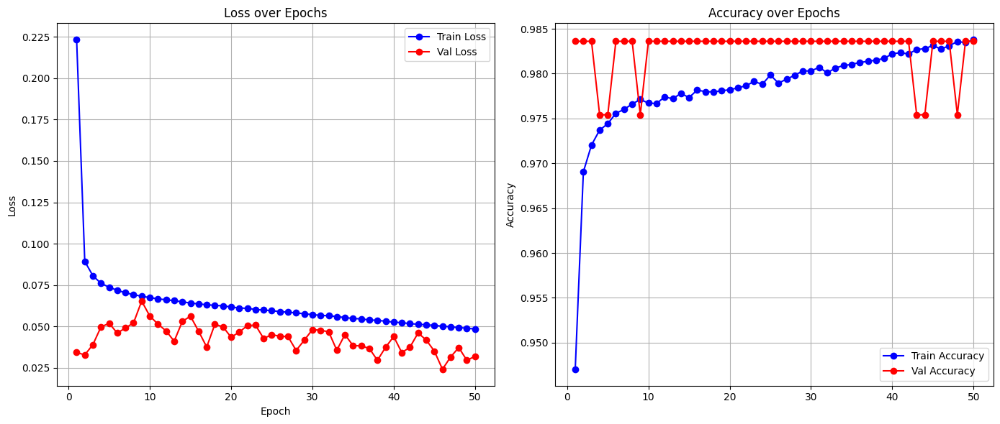

Full model built...
Total execution time: 182.56 seconds
✅ Fold 12 done: Val Loss = 0.0320, Val Acc = 0.9836
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 3/3 [00:00<00:00, 900.32it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 858.49it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 792.28it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 889.00it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 814.53it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 915.85it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 868.99it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 890.26it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 843.25it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 890.70it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 878.57it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 874.72it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 652.17it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 881.84it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 800.49it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 843.47it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 887.87it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 740.00it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 701.23it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 770.96it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 815.33it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 885.37it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 856.04it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 798.31it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 898.78it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 851.98it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 955.64it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 669.55it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 924.40it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 937.97it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 839.03it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 869.47it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 632.94it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 917.19it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 880.91it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 869.17it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 902.71it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 847.33it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 861.02it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 923.72it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 832.20it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 857.79it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 827.44it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 831.76it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 871.51it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 914.92it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 701.08it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 782.42it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 860.25it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 883.94it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


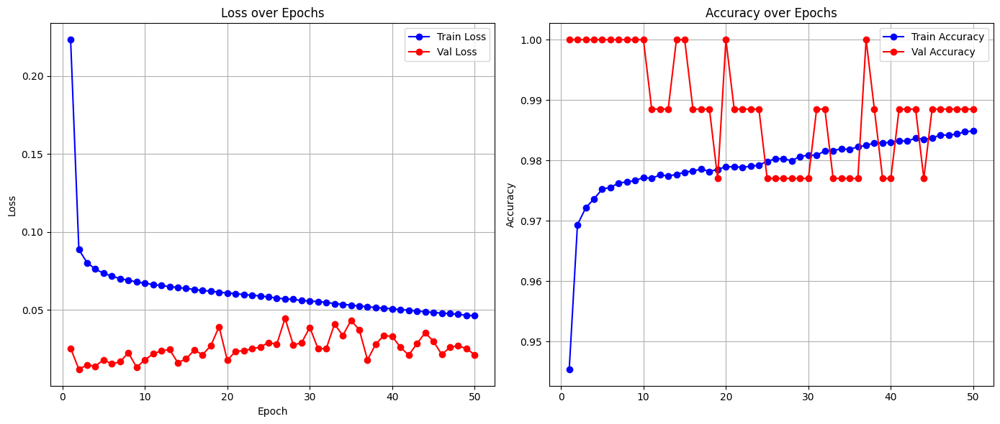

Full model built...
Total execution time: 181.25 seconds
✅ Fold 13 done: Val Loss = 0.0213, Val Acc = 0.9885
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 3/3 [00:00<00:00, 881.22it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 882.27it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 819.89it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 858.67it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 710.66it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 670.80it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 878.33it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 910.82it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 905.83it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 918.46it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 942.61it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 777.54it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 900.52it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 846.82it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 749.07it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 730.33it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 884.19it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 905.25it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 909.43it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 697.77it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 827.71it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 937.69it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 720.34it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 912.73it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 708.42it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 843.36it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 902.07it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 684.34it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 937.55it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 739.21it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 921.08it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 938.95it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 899.16it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 891.01it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 896.41it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 857.91it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 877.53it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 957.60it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 926.37it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 686.35it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 900.00it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 905.31it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 693.08it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 663.69it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 830.66it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 876.61it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 877.90it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 867.37it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 695.23it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 3/3 [00:00<00:00, 880.05it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


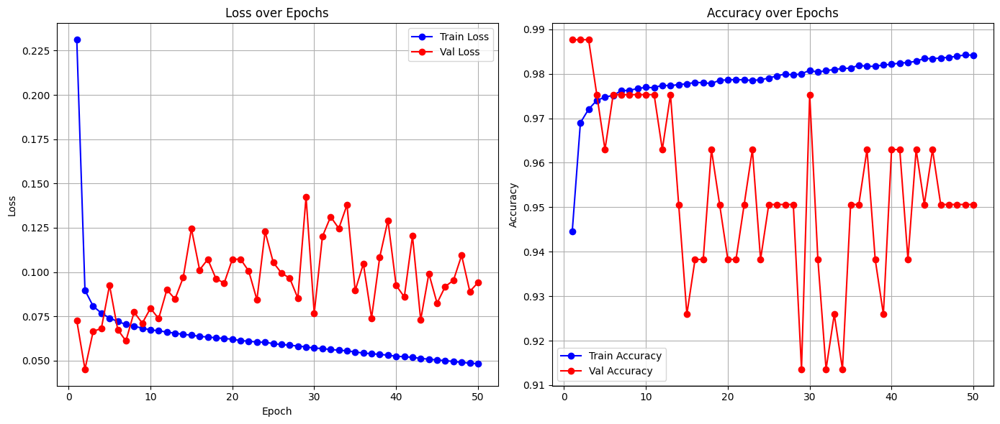

Full model built...
Total execution time: 179.06 seconds
✅ Fold 14 done: Val Loss = 0.0941, Val Acc = 0.9506
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.28it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 796.64it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 782.81it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 818.00it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 769.67it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 766.36it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 798.15it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 785.01it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 848.11it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 785.38it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 794.38it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 715.45it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 836.35it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 818.88it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 833.28it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 858.08it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 657.16it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 678.96it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 773.93it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 787.00it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 830.14it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 571.82it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 638.31it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 759.08it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 738.63it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 741.44it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 670.93it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 830.47it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 834.19it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 625.46it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 842.31it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 759.98it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 811.75it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 809.09it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 657.98it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 846.05it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 845.11it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 893.26it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 800.21it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 900.36it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 765.94it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 820.16it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 844.60it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 674.49it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 851.38it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 832.95it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 877.47it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 797.85it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 883.38it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 868.39it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 827.85it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


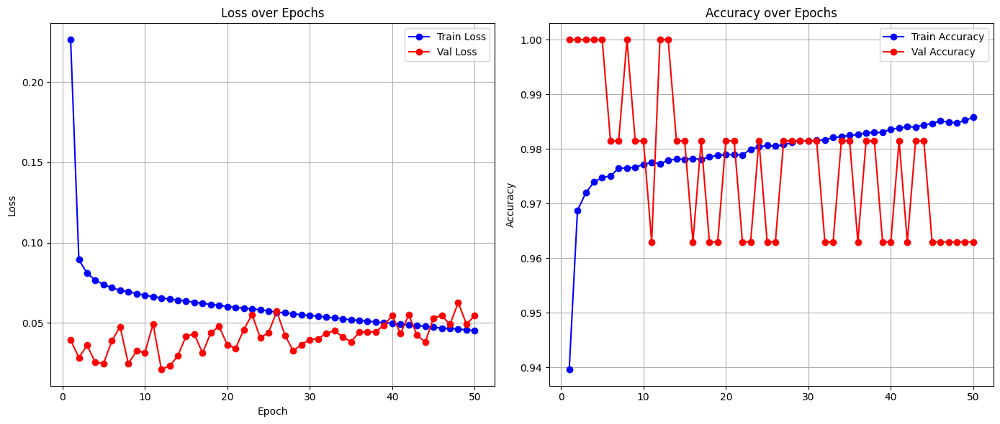

Full model built...
Total execution time: 181.63 seconds
✅ Fold 15 done: Val Loss = 0.0545, Val Acc = 0.9630
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 2/2 [00:00<00:00, 928.87it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 902.49it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 876.64it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 836.44it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 738.89it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 918.19it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 847.59it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 726.66it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 887.50it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 969.56it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 755.73it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 902.39it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 929.79it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 941.80it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 722.16it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 895.17it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 762.18it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 954.23it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 915.99it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 951.41it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 790.04it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 926.51it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 887.31it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 765.80it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 826.38it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 959.03it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 904.92it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 785.01it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 912.30it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 725.03it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 1021.13it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 820.00it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 906.09it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 880.60it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 919.90it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 1062.52it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 696.90it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 906.09it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 795.13it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 934.98it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 875.18it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 820.32it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 740.39it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 856.85it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 887.03it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 937.07it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 923.55it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 884.41it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 904.33it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 2/2 [00:00<00:00, 924.16it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


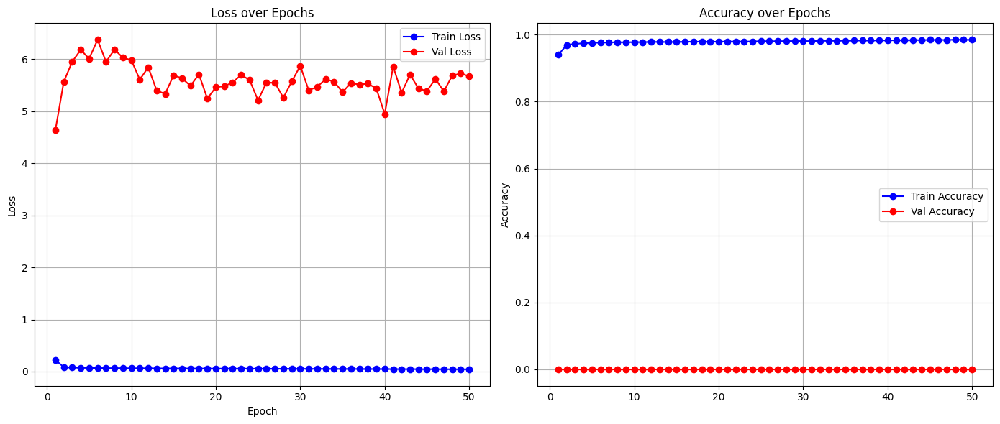

Full model built...
Total execution time: 180.78 seconds
✅ Fold 16 done: Val Loss = 5.6708, Val Acc = 0.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.82it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.87it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.74it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.15it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 646.37it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 590.91it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 598.67it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 563.07it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.80it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 636.56it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 652.71it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.86it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 624.25it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 534.58it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 664.08it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.56it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 617.63it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 585.31it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 572.84it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.47it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.76it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 696.03it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.79it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.83it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.15it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.12it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.22it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.14it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.70it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.73it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 584.33it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 855.46it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.25it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.26it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.11it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 606.20it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.74it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.41it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 618.45it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.54it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 789.00it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 582.46it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 697.77it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 709.82it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 651.90it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 600.56it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 598.33it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.88it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.56it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 627.04it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


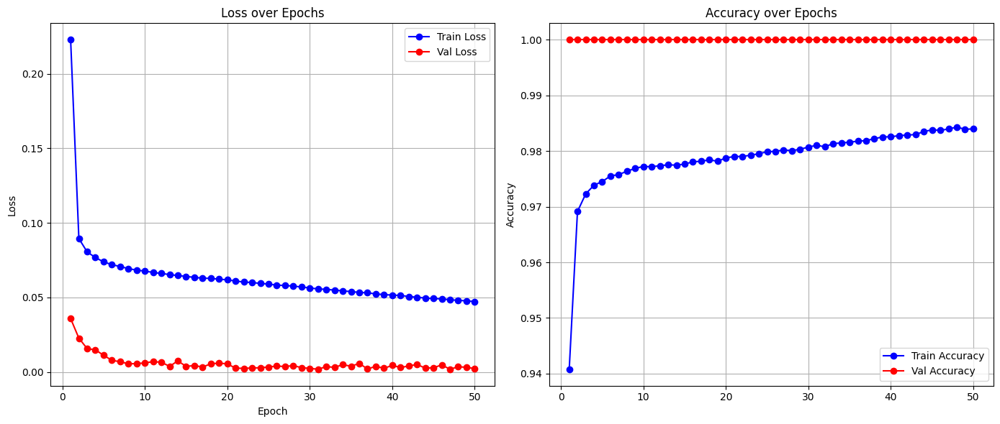

Full model built...
Total execution time: 182.22 seconds
✅ Fold 17 done: Val Loss = 0.0022, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.42it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.01it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 712.83it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.27it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.08it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.20it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 595.95it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 686.24it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 572.91it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.65it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 498.85it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 705.04it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.33it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 588.43it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 706.83it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 608.49it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.58it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.89it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 601.85it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.76it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 609.55it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 541.83it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 725.03it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.29it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.92it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.22it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 624.43it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.93it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.06it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 577.25it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.98it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 628.17it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 651.29it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 621.84it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 610.08it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 692.02it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.48it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 620.73it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.46it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.29it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.06it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 620.28it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 540.22it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.47it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 493.74it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 581.65it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.07it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.24it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 656.80it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 677.70it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


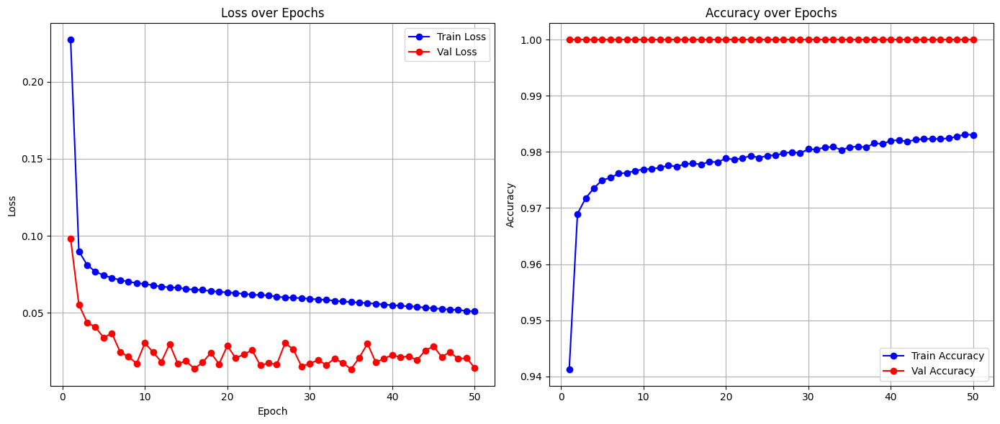

Full model built...
Total execution time: 181.64 seconds
✅ Fold 18 done: Val Loss = 0.0141, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.99it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 629.11it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.78it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.30it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 807.68it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 561.19it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 542.32it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.15it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 740.13it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 639.18it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 634.54it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 746.32it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.52it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 664.71it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 655.87it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 675.19it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 740.00it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 693.73it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 785.30it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 832.53it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 892.41it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 681.23it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 716.24it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 665.45it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 627.33it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 701.15it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 616.45it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 700.10it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 876.55it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.39it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.82it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 743.54it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 697.19it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.83it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 563.83it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.48it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.78it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 670.02it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 615.18it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.22it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 668.52it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 683.89it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.17it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.78it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 742.09it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 633.39it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 739.61it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 668.31it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.46it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.94it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


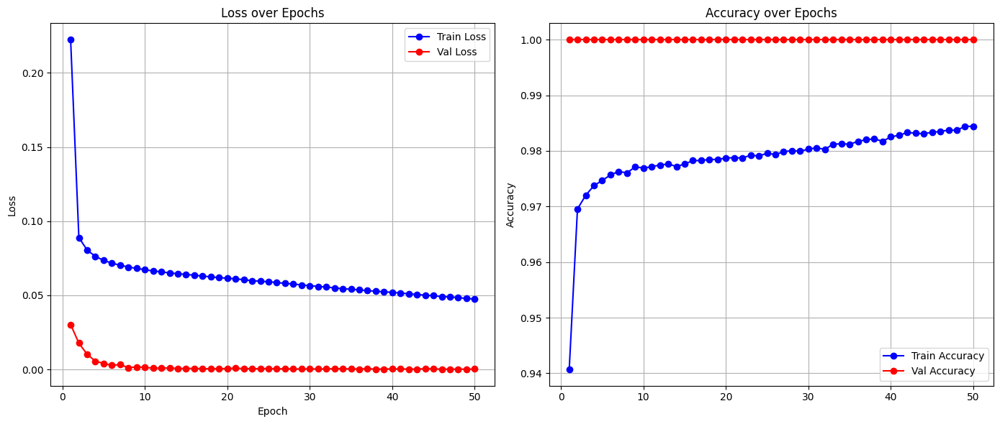

Full model built...
Total execution time: 181.32 seconds
✅ Fold 19 done: Val Loss = 0.0003, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 741.70it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 534.78it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 784.72it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 727.55it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 800.29it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 791.08it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 720.92it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 710.18it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 746.72it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 630.72it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.83it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.74it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 724.28it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 648.87it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 721.04it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 585.22it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.76it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.08it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 864.27it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 606.20it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 698.58it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.33it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.05it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.92it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 621.29it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 669.38it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 583.11it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 722.16it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 707.90it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.77it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 619.45it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.82it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.37it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 652.91it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.28it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 877.10it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.45it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 733.14it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 776.58it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.66it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 661.15it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 856.16it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 786.78it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.12it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 648.67it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 784.13it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 649.57it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.78it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 791.08it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 814.74it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


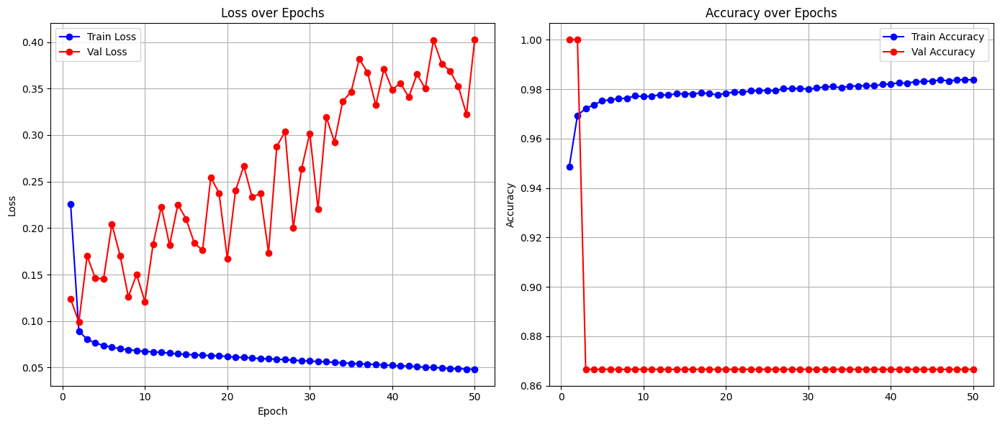

Full model built...
Total execution time: 181.78 seconds
✅ Fold 20 done: Val Loss = 0.4025, Val Acc = 0.8667
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.27it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 656.08it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.63it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.25it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.46it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 866.77it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 602.28it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.74it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.22it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 771.72it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 691.79it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 811.28it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.31it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 755.32it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 564.28it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 723.90it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.41it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 763.02it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.69it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 789.89it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.46it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 608.84it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 870.01it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.10it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 903.75it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 584.73it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 778.31it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 641.92it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 660.31it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 720.18it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 588.51it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 796.94it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.25it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 965.54it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.64it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 936.02it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.61it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 519.42it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 745.39it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.61it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.91it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.38it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 650.99it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.38it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 616.81it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.11it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 610.70it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 685.46it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 596.46it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.86it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.88it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


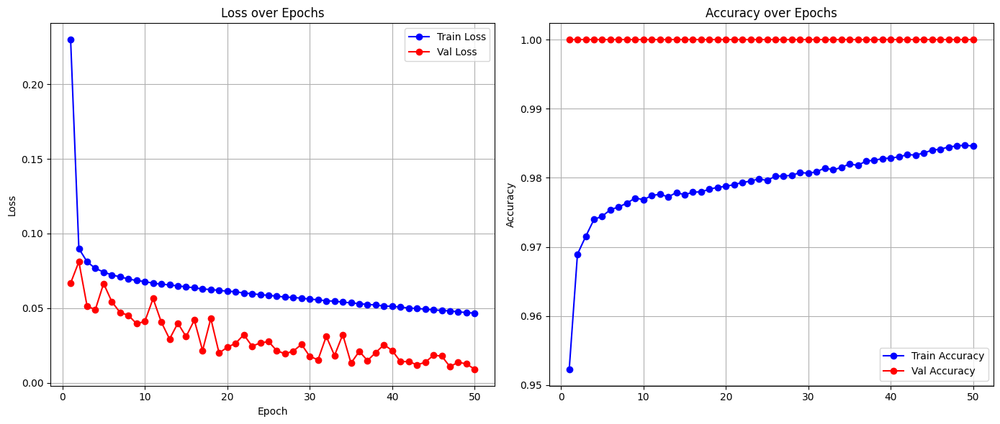

Full model built...
Total execution time: 181.85 seconds
✅ Fold 21 done: Val Loss = 0.0090, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.26it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.10it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.65it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 717.22it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 752.88it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 697.54it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 667.35it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 729.95it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 789.44it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 626.30it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 767.34it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 823.54it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 872.18it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 772.72it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 721.91it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 642.71it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.06it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 781.06it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 591.00it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 698.82it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 722.53it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 773.29it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.17it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 674.65it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 838.19it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 813.01it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 695.92it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 698.00it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.69it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 711.26it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 719.43it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.14it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 625.18it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 815.70it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.91it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.94it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 821.61it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 752.88it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 747.51it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.61it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 844.43it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 690.31it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.38it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.42it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.37it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.84it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 583.35it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.74it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.88it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.27it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.04it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


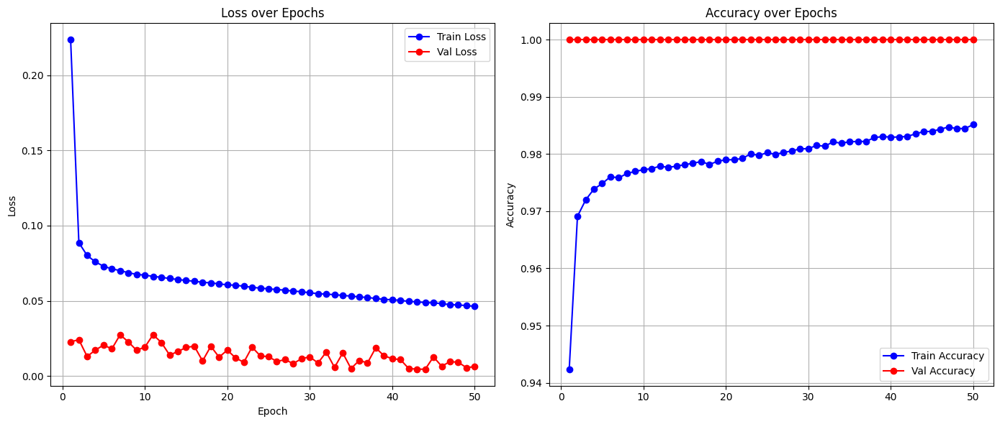

Full model built...
Total execution time: 181.53 seconds
✅ Fold 22 done: Val Loss = 0.0063, Val Acc = 1.0000
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.26it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 780.19it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 643.20it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.43it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 714.78it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 666.50it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 676.61it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 673.68it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.02it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 759.56it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 760.66it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.05it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 730.59it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.80it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 812.53it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 734.30it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 936.86it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 696.84it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 694.65it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 930.21it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 678.69it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 750.46it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 781.64it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.87it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 702.80it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 485.56it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 781.79it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 778.16it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 708.50it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 843.25it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 776.87it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 978.15it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 664.92it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.28it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 911.01it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 736.10it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.96it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 746.18it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 653.62it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.51it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.73it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 782.08it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.34it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 663.34it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 753.56it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 770.87it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 773.86it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 790.04it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 779.90it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 657.41it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 728.81it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


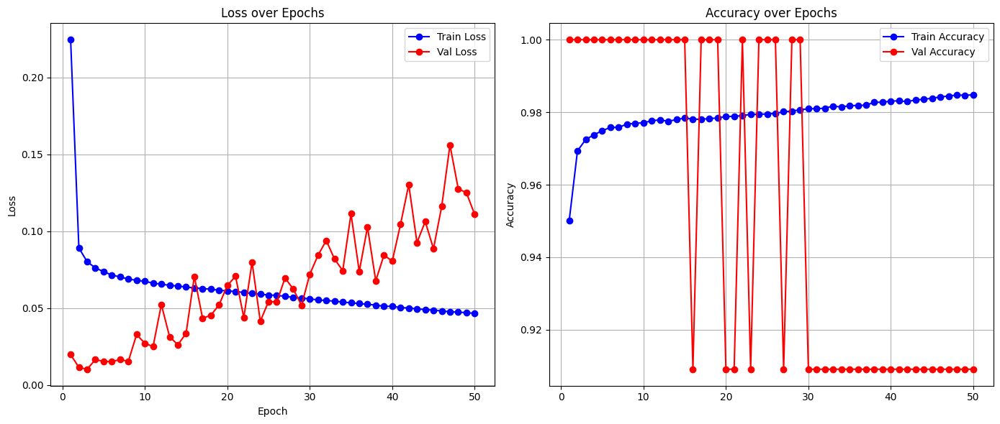

Full model built...
Total execution time: 182.79 seconds
✅ Fold 23 done: Val Loss = 0.1109, Val Acc = 0.9091
Using device: cuda
BioCLIP 2!
Model obtained...
Feature extractor obtained..
📊 Total number of taxa (groups): 30
✅ Embeddings already exist, loading from file...


Extracting embeddings: 100%|██████████| 68/68 [00:53<00:00,  1.26it/s]


🔍 Inspecting 25-fold GroupKFold with augmentation effects:
📊 Total samples in filtered embeddings: 35778
📊 Total unique groups: 29
### Inside  INSPECT_FOLDS_GROUPS_WITH AUGMENTATION - augmented_embeddings_dict['groups'] ['lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum', 'lythrum_virgatum',

Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.08it/s]



🔁 Epoch 2/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 738.43it/s]



🔁 Epoch 3/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 918.39it/s]



🔁 Epoch 4/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 954.99it/s]



🔁 Epoch 5/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 726.41it/s]



🔁 Epoch 6/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 689.74it/s]



🔁 Epoch 7/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 761.35it/s]



🔁 Epoch 8/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 704.10it/s]



🔁 Epoch 9/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.97it/s]



🔁 Epoch 10/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 837.69it/s]



🔁 Epoch 11/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 610.79it/s]



🔁 Epoch 12/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.74it/s]



🔁 Epoch 13/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 961.56it/s]



🔁 Epoch 14/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 740.13it/s]



🔁 Epoch 15/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 765.52it/s]



🔁 Epoch 16/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 645.67it/s]



🔁 Epoch 17/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 703.62it/s]



🔁 Epoch 18/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 647.77it/s]



🔁 Epoch 19/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1001.03it/s]



🔁 Epoch 20/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 749.38it/s]



🔁 Epoch 21/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 734.55it/s]



🔁 Epoch 22/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 820.00it/s]



🔁 Epoch 23/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 644.09it/s]



🔁 Epoch 24/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 713.07it/s]



🔁 Epoch 25/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 959.14it/s]



🔁 Epoch 26/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 715.26it/s]



🔁 Epoch 27/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 605.76it/s]



🔁 Epoch 28/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 783.25it/s]



🔁 Epoch 29/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 864.27it/s]



🔁 Epoch 30/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 631.20it/s]



🔁 Epoch 31/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 825.98it/s]



🔁 Epoch 32/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.68it/s]



🔁 Epoch 33/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 885.43it/s]



🔁 Epoch 34/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.96it/s]



🔁 Epoch 35/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 1007.04it/s]



🔁 Epoch 36/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 769.88it/s]



🔁 Epoch 37/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 757.09it/s]



🔁 Epoch 38/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 729.19it/s]



🔁 Epoch 39/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 754.37it/s]



🔁 Epoch 40/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 764.69it/s]



🔁 Epoch 41/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 756.00it/s]



🔁 Epoch 42/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 900.07it/s]



🔁 Epoch 43/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 810.18it/s]



🔁 Epoch 44/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 941.69it/s]



🔁 Epoch 45/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 806.13it/s]



🔁 Epoch 46/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 808.93it/s]



🔁 Epoch 47/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 768.19it/s]



🔁 Epoch 48/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 718.69it/s]



🔁 Epoch 49/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 758.88it/s]



🔁 Epoch 50/50


Evaluating: 100%|██████████| 1/1 [00:00<00:00, 777.44it/s]


📝 Appended log to /content/drive/MyDrive/Thesis/invasive_species/logs/training_log.json


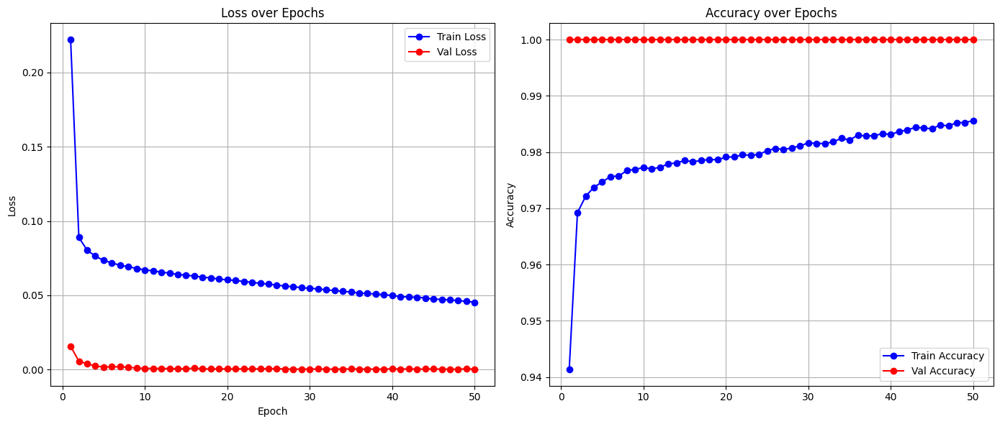

Full model built...
Total execution time: 180.43 seconds
✅ Fold 24 done: Val Loss = 0.0003, Val Acc = 1.0000

📊 Cross-validation results:
Average Validation Loss: 0.3445
Average Validation Accuracy: 0.9161
All Fold Accuracies: [0.7152995040061045, 0.8489181202935849, 0.9641337386018237, 0.989242863053372, 0.9101907864122848, 0.9640449438202248, 0.9723756906077348, 1.0, 0.9734513274336283, 0.9875, 1.0, 0.9836065573770492, 0.9885057471264368, 0.9506172839506173, 0.9629629629629629, 0.0, 1.0, 1.0, 1.0, 0.8666666666666667, 1.0, 1.0, 0.9090909090909091, 1.0]


In [ ]:
all_val_losses = []
all_val_accuracies = []

remove_species=['lythrum_hyssopifolia']

n_splits = 25

embeddings_save_path_BC2_new = "/content/drive/MyDrive/Thesis/bioclip2_groups_embeddings_v0.pt"
model_name_final = 'group_k_fold_new_embeddings'
epochs=50

#Augmentation = True means we augment Vergatum x2

for fold_idx in range(n_splits):
  if fold_idx != 5: #do not test on Virgatum because we are augmenting it in the training set
    val_loss, val_acc = create_model_and_predict(folder_name="taxas", use_bioclip=True, augmentation=True, augmentation_factor=2,
                                          loss_type='CE', bioclip_version=2, output_dir="invasive_species", model_name=model_name_final,
                                           save_model=False, verbose=False, embeddings_save_path=embeddings_save_path_BC2_new,
                                             epochs=epochs, debug_subset_size=None, n_splits=n_splits, fold_idx=fold_idx, remove_species=remove_species)
    all_val_losses.append(val_loss)
    all_val_accuracies.append(val_acc)
    print(f"✅ Fold {fold_idx} done: Val Loss = {val_loss:.4f}, Val Acc = {val_acc:.4f}")


mean_loss = sum(all_val_losses) / len(all_val_losses)
mean_acc = sum(all_val_accuracies) / len(all_val_accuracies)

print("\n📊 Cross-validation results:")
print(f"Average Validation Loss: {mean_loss:.4f}")
print(f"Average Validation Accuracy: {mean_acc:.4f}")
print(f"All Fold Accuracies: {all_val_accuracies}")